In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import re
import json
import ast
from matplotlib.ticker import FuncFormatter
import glob
from matplotlib import animation
from scipy.spatial.distance import pdist, squareform
from itertools import combinations
import scipy
from scipy.stats import entropy
from sklearn import manifold
from adjustText import adjust_text
from mpl_toolkits import mplot3d
import networkx as nx
import os.path as osp
from sklearn import tree
import graphviz
from sklearn.metrics import classification_report
from itertools import product
import dask.dataframe as dd

In [2]:
#plt.style.use('seaborn-white')
plt.style.use('seaborn')
# for matplotlib xkcd I need to install new font without root, like this: 
#https://community.linuxmint.com/tutorial/view/29
# and then ivalidate cache like this: 
#https://stackoverflow.com/questions/19663986/getting-xkcd-plots-using-matplotlib/22812176#22812176
# or by deleting by: rm ~/.cache/matplotlib -r
# the font ttf file must be in ~/.fonts/fonts/truetype/humor-sans directory

# to recover from xkcd
#mpl.rcParams.update(saved_state)

# to save state and go to xkcd
#saved_state = mpl.rcParams.copy()
plt.xkcd()
conf = {
    'font.size': 14.0,
    'axes.grid': True,
    'figure.titlesize': 'x-large',
    'axes.titlesize': 'x-large',
    'axes.labelsize': 'large',
#    'xtick.labelsize': 'medium',
#    'ytick.labelsize': 'medium',
#    'legend.fontsize': 'medium',
    'xtick.labelsize': 'large',
    'ytick.labelsize': 'large',
    'legend.fontsize': 'large',
}

plt.rcParams.update(conf)


In [3]:
# cleaned data are good for user anylysis but not for anime analysis. For users, around 200k animelist records were discarded, over 30m records remainded.
animes = pd.read_csv('anime_cleaned.csv')
users = pd.read_csv('users_cleaned.csv')
animelists = pd.read_csv('animelists_cleaned.csv')

In [4]:
users['birth_date'] = pd.to_datetime(users['birth_date'])
users['last_online'] = pd.to_datetime(users['last_online'])
users['join_date'] = pd.to_datetime(users['join_date'])
animelists['my_last_updated'] = pd.to_datetime(animelists['my_last_updated'])
# renaming possibly array-like columns to end with -s
animes = animes.rename(columns={'genre': 'genres', 'studio': 'studios'})

In [5]:
# setting index for primary identifiers
animes = animes.set_index('anime_id')
users = users.set_index('username')


In [6]:
animes_dd = dd.from_pandas(animes, npartitions=2)
users_dd = dd.from_pandas(users, npartitions=2)
animelists_dd = dd.from_pandas(animelists, npartitions=2)

In [7]:
users['age'] = 2018 - users['birth_date'].dt.year

In [8]:
animes.head()

,title,title_english,title_japanese,title_synonyms,image_url,type,source,episodes,status,airing,...,broadcast,related,producer,licensor,studios,genres,opening_theme,ending_theme,duration_min,aired_from_year
anime_id,,,,,,,,,,,,,,,,,,,,,
11013,Inu x Boku SS,Inu X Boku Secret Service,妖狐×僕SS,Youko x Boku SS,https://myanimelist.cdn-dena.com/images/anime/...,TV,Manga,12,Finished Airing,False,...,Fridays at Unknown,"{'Adaptation': [{'mal_id': 17207, 'type': 'man...","Aniplex, Square Enix, Mainichi Broadcasting Sy...",Sentai Filmworks,David Production,"Comedy, Supernatural, Romance, Shounen","['""Nirvana"" by MUCC']","['#1: ""Nirvana"" by MUCC (eps 1, 11-12)', '#2: ...",24.0,2012.0
2104,Seto no Hanayome,My Bride is a Mermaid,瀬戸の花嫁,The Inland Sea Bride,https://myanimelist.cdn-dena.com/images/anime/...,TV,Manga,26,Finished Airing,False,...,Unknown,"{'Adaptation': [{'mal_id': 759, 'type': 'manga...","TV Tokyo, AIC, Square Enix, Sotsu",Funimation,Gonzo,"Comedy, Parody, Romance, School, Shounen","['""Romantic summer"" by SUN&LUNAR']","['#1: ""Ashita e no Hikari (明日への光)"" by Asuka Hi...",24.0,2007.0
5262,Shugo Chara!! Doki,Shugo Chara!! Doki,しゅごキャラ！！どきっ,"Shugo Chara Ninenme, Shugo Chara! Second Year",https://myanimelist.cdn-dena.com/images/anime/...,TV,Manga,51,Finished Airing,False,...,Unknown,"{'Adaptation': [{'mal_id': 101, 'type': 'manga...","TV Tokyo, Sotsu",NaN,Satelight,"Comedy, Magic, School, Shoujo","['#1: ""Minna no Tamago (みんなのたまご)"" by Shugo Cha...","['#1: ""Rottara Rottara (ロッタラ ロッタラ)"" by Buono! ...",24.0,2008.0
721,Princess Tutu,Princess Tutu,プリンセスチュチュ,NaN,https://myanimelist.cdn-dena.com/images/anime/...,TV,Original,38,Finished Airing,False,...,Fridays at Unknown,"{'Adaptation': [{'mal_id': 1581, 'type': 'mang...","Memory-Tech, GANSIS, Marvelous AQL",ADV Films,Hal Film Maker,"Comedy, Drama, Magic, Romance, Fantasy","['""Morning Grace"" by Ritsuko Okazaki']","['""Watashi No Ai Wa Chiisaikeredo"" by Ritsuko ...",16.0,2002.0
12365,Bakuman. 3rd Season,Bakuman.,バクマン。,Bakuman Season 3,https://myanimelist.cdn-dena.com/images/anime/...,TV,Manga,25,Finished Airing,False,...,Unknown,"{'Adaptation': [{'mal_id': 9711, 'type': 'mang...","NHK, Shueisha",NaN,J.C.Staff,"Comedy, Drama, Romance, Shounen","['#1: ""Moshimo no Hanashi (もしもの話)"" by nano.RIP...","['#1: ""Pride on Everyday"" by Sphere (eps 1-13)...",24.0,2012.0


In [9]:
animelists.head()

,username,anime_id,my_watched_episodes,my_start_date,my_finish_date,my_score,my_status,my_rewatching,my_rewatching_ep,my_last_updated,my_tags
0,karthiga,21,586,0000-00-00,0000-00-00,9,1,NaN,0,2013-03-03 10:52:53,NaN
1,karthiga,59,26,0000-00-00,0000-00-00,7,2,NaN,0,2013-03-10 13:54:51,NaN
2,karthiga,74,26,0000-00-00,0000-00-00,7,2,NaN,0,2013-04-27 16:43:35,NaN
3,karthiga,120,26,0000-00-00,0000-00-00,7,2,NaN,0,2013-03-03 10:53:57,NaN
4,karthiga,178,26,0000-00-00,0000-00-00,7,2,0.0,0,2013-03-27 15:59:13,NaN


In [10]:
users.head()

,user_id,user_watching,user_completed,user_onhold,user_dropped,user_plantowatch,user_days_spent_watching,gender,location,birth_date,access_rank,join_date,last_online,stats_mean_score,stats_rewatched,stats_episodes,age
username,,,,,,,,,,,,,,,,,
karthiga,2255153,3,49,1,0,0,55.091667,Female,"Chennai, India",1990-04-29,NaN,2013-03-03,2014-02-04 01:32:00,7.43,0.0,3391,28
Damonashu,37326,45,195,27,25,59,82.574306,Male,"Detroit,Michigan",1991-08-01,NaN,2008-02-13,2017-07-10 06:52:54,6.15,6.0,4903,27
bskai,228342,25,414,2,5,11,159.483333,Male,"Nayarit, Mexico",1990-12-14,NaN,2009-08-31,2014-05-12 16:35:00,8.27,1.0,9701,28
terune_uzumaki,327311,5,5,0,0,0,11.394444,Female,"Malaysia, Kuantan",1998-08-24,NaN,2010-05-10,2012-10-18 19:06:00,9.70,6.0,697,20
Bas_G,5015094,35,114,6,20,175,30.458333,Male,"Nijmegen, Nederland",1999-10-24,NaN,2015-11-26,2018-05-10 20:53:37,7.86,0.0,1847,19


### comparison of all and active users
Active users are users with some ratings in last 3 months

In [11]:
# newest update date, reflects time of data gathering
now = animelists['my_last_updated'].max()
now

Timestamp('2018-05-22 07:49:06')

In [12]:
from dateutil.relativedelta import relativedelta
last_update = animelists.groupby('username')['my_last_updated'].max()
is_active = last_update > (now - relativedelta(months=3))
active_users = last_update[is_active].index

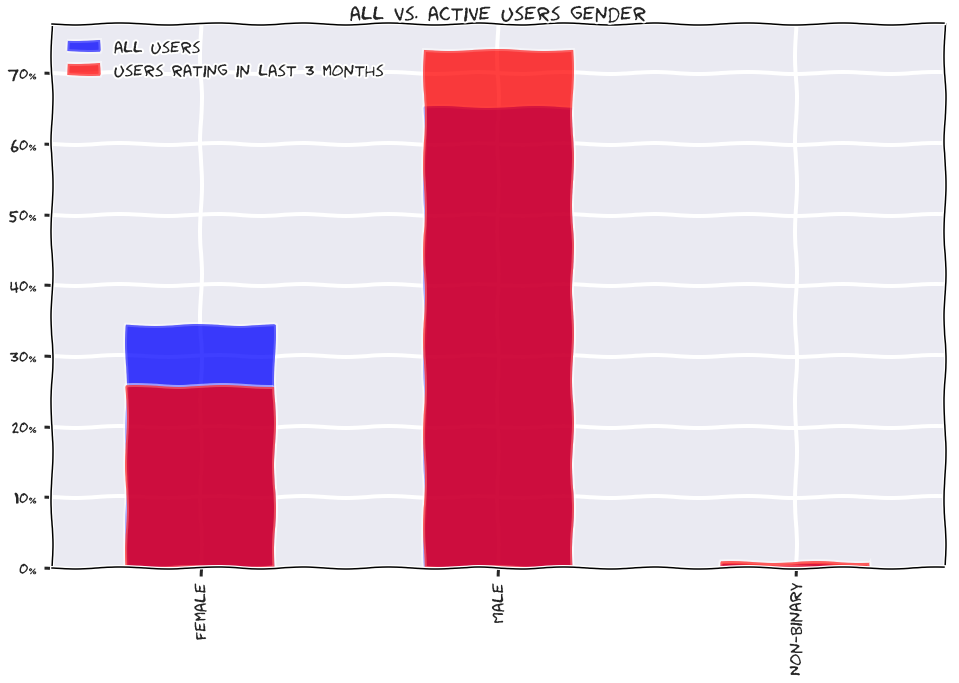

In [13]:
(users['gender'].value_counts() / users['gender'].count()).sort_index().plot.bar(figsize=(16, 10), title='all vs. active users gender', color='blue', alpha=0.5, label='all users')
(users.loc[active_users]['gender'].value_counts() / users.loc[active_users]['gender'].count()).sort_index().plot.bar(figsize=(16, 10), color='red', alpha=0.5, label='users rating in last 3 months')
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
plt.legend(loc=2)

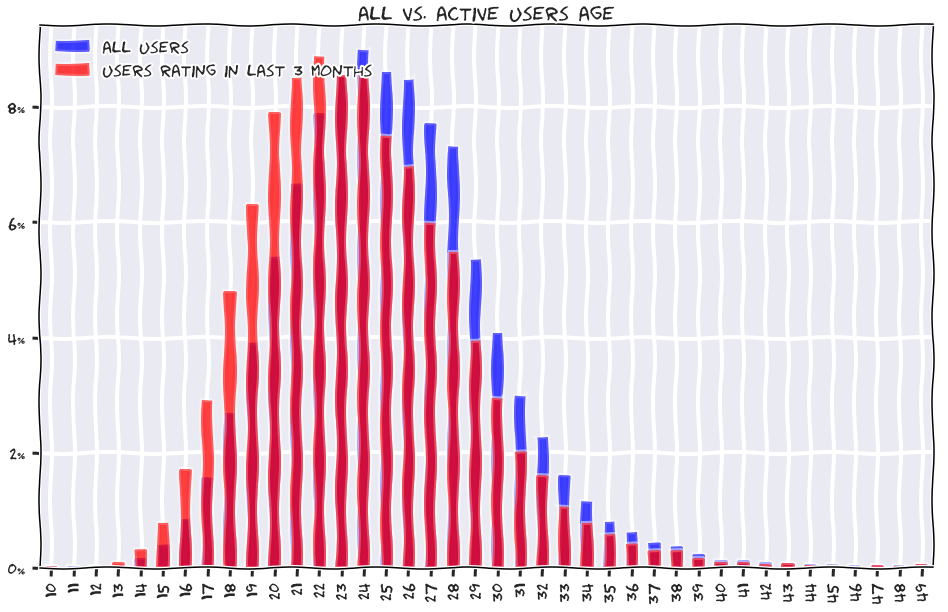

In [14]:
(users['age'].value_counts() / users['age'].count()).sort_index().plot.bar(figsize=(16, 10), title='all vs. active users age', color='blue', alpha=0.5, label='all users')
(users.loc[active_users]['age'].value_counts() / users.loc[active_users]['age'].count()).sort_index().plot.bar(figsize=(16, 10), color='red', alpha=0.5, label='users rating in last 3 months')
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
plt.legend(loc=2)

### inspecing seen animes per all genres by age, gender etc.

In [15]:
animes['genres'].fillna('', inplace=True)
genres_arr = animes['genres'].str.replace(' ', '').str.split(',', expand=True).stack().reset_index(drop=True, level=1).to_frame(name='genre')
genres_arr.index.name = 'anime_id'
animes_genres = pd.merge(animes, genres_arr, how='left', left_index=True, right_index=True)
genres = genres_arr['genre'].unique()

In [17]:
%%timeit
animelists.join(animes['genres'], on='anime_id')

8.02 s ± 321 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [22]:
%%timeit
animelists_dd.join(animes_dd['genres'].to_frame('genres'), on='anime_id').compute()

MemoryError: 

In [20]:
animelists = animelists.join(animes['genres'], on='anime_id')

### this is just testing of functionality

In [16]:
#animelists.iloc[0:10][['anime_id', 'genres']]
#animelists.iloc[0:10][['anime_id', 'genres']].apply(lambda x: print(x), axis=1)
#animelists.iloc[0:10].apply(lambda x: print(x))
#animelists.apply(lambda x: print(x['genre']))
#animelists.iloc[0:10][['anime_id', 'genres']].apply(lambda x: print(type(x)))
#animelists.iloc[0:10][['anime_id', 'genres']].apply(lambda x: print(x[1]), axis=1)
#animelists.iloc[0:10][['anime_id', 'genres']].apply(lambda x: x[1].replace(' ', '').split(','), axis=1)
#animelists.iloc[0:10][['anime_id', 'genres']].apply(lambda x: (x[0], x[1].replace(' ', '').split(',')), axis=1)
#animelists.iloc[0:10][['anime_id', 'genres']].apply(lambda x: (x[0], x[1].replace(' ', '').split(',')), axis=1).apply(pd.Series).stack().to_frame(name='genre')

#genres_df = animelists.iloc[0:10]['genres'].apply(lambda x: x.replace(' ', '').split(',')).apply(pd.Series).stack().to_frame(name='genre')
#genres_df.index.levels[0] = animelists.iloc[0:10]['anime_id']
#genres_df

#animelists.iloc[0:10]['genres'].apply(lambda x: x.replace(' ', '').split(',')).apply(pd.Series).set_index(animelists.iloc[0:10]['anime_id']).stack().to_frame(name='genre')
lists_genres_pd = animelists.iloc[0:10]['genres'].apply(lambda x: x.replace(' ', '').split(',')).apply(pd.Series).stack().to_frame(name='genre')
lists_ids_pd = animelists.iloc[0:10]['anime_id'].to_frame(name='anime_id')
lists_genres_pd.index.levels[0].name = 'anime_id'
lists_ids_pd.index.name = 'anime_id'
pd.merge(lists_genres_pd, lists_ids_pd, how='inner', left_index=True, right_index=True)

genre  anime_id
anime_id                          
0        0        Action        21
         1     Adventure        21
         2        Comedy        21
         3    SuperPower        21
         4         Drama        21
         5       Fantasy        21
         6       Shounen        21
1        0        Sci-Fi        59
         1        Comedy        59
         2         Drama        59
         3       Romance        59
         4         Ecchi        59
         5        Seinen        59
2        0        Comedy        74
         1        School        74
         2        Shoujo        74
         3    SuperPower        74
3        0   SliceofLife       120
         1        Comedy       120
         2         Drama       120
         3       Romance       120
         4       Fantasy       120
         5        Shoujo       120
4        0         Magic       178
         1        Comedy       178
         2       Romance       178
         3        School       178
         4        Shoujo       178
5        0   SliceofLife       210
         1        Comedy       210
         2   MartialArts       210
         3       Fantasy       210
6        0     Adventure       232
         1        Comedy       232
         2         Drama       232
         3         Magic       232
         4       Romance       232
         5       Fantasy       232
         6        School       232
         7        Shoujo       232
7        0        Comedy       233
         1        Sci-Fi       233
         2        Shoujo       233
8        0        Action       249
         1     Adventure       249
         2        Comedy       249
         3    Historical       249
         4        Demons       249
         5  Supernatural       249
         6         Magic       249
         7       Romance       249
         8       Fantasy       249
         9       Shounen       249
9        0        Action       269
         1     Adventure       269
         2        Comedy       269
         3    SuperPower       269
         4  Supernatural       269
         5       Shounen       269

In [25]:
animelists.iloc[0:10][['anime_id', 'genres']]

,anime_id,genres
0,21,"Action, Adventure, Comedy, Super Power, Drama,..."
1,59,"Sci-Fi, Comedy, Drama, Romance, Ecchi, Seinen"
2,74,"Comedy, School, Shoujo, Super Power"
3,120,"Slice of Life, Comedy, Drama, Romance, Fantasy..."
4,178,"Magic, Comedy, Romance, School, Shoujo"
5,210,"Slice of Life, Comedy, Martial Arts, Fantasy"
6,232,"Adventure, Comedy, Drama, Magic, Romance, Fant..."
7,233,"Comedy, Sci-Fi, Shoujo"
8,249,"Action, Adventure, Comedy, Historical, Demons,..."
9,269,"Action, Adventure, Comedy, Super Power, Supern..."


### this is test of correctness

In [18]:
animelists.iloc[0:5]['genres'].apply(lambda x: x.replace(' ', '').split(',')).apply(pd.Series).stack().to_frame(name='genre')

genre
0 0       Action
  1    Adventure
  2       Comedy
  3   SuperPower
  4        Drama
  5      Fantasy
  6      Shounen
1 0       Sci-Fi
  1       Comedy
  2        Drama
  3      Romance
  4        Ecchi
  5       Seinen
2 0       Comedy
  1       School
  2       Shoujo
  3   SuperPower
3 0  SliceofLife
  1       Comedy
  2        Drama
  3      Romance
  4      Fantasy
  5       Shoujo
4 0        Magic
  1       Comedy
  2      Romance
  3       School
  4       Shoujo

In [19]:
indices = pd.MultiIndex.from_tuples([(x[0], y) for i, x in enumerate(animelists.iloc[0:5][['anime_id', 'genres']].apply(lambda x: (x[0], x[1].replace(' ', '').split(',')), axis=1)) for y, _ in enumerate(x[1])])
pd.Series([y for x in animelists.iloc[0:5]['genres'].apply(lambda x: x.replace(' ', '').split(',')) for y in x], index=indices).to_frame(name='genre')


genre
21  0       Action
    1    Adventure
    2       Comedy
    3   SuperPower
    4        Drama
    5      Fantasy
    6      Shounen
59  0       Sci-Fi
    1       Comedy
    2        Drama
    3      Romance
    4        Ecchi
    5       Seinen
74  0       Comedy
    1       School
    2       Shoujo
    3   SuperPower
120 0  SliceofLife
    1       Comedy
    2        Drama
    3      Romance
    4      Fantasy
    5       Shoujo
178 0        Magic
    1       Comedy
    2      Romance
    3       School
    4       Shoujo

In [26]:
pd.DataFrame([(x[0], y) for i, x in enumerate(animelists.iloc[0:5][['anime_id', 'genres']].apply(lambda x: (x[0], x[1].replace(' ', '').split(',')), axis=1)) for y in x[1]], columns=['anime_id', 'genre'])


,anime_id,genre
0,21,Action
1,21,Adventure
2,21,Comedy
3,21,SuperPower
4,21,Drama
5,21,Fantasy
6,21,Shounen
7,59,Sci-Fi
8,59,Comedy
9,59,Drama


In [27]:
genres_arr = animes['genres'].apply(lambda x: x.replace(' ', '').split(',')).apply(pd.Series).stack().to_frame(name='genre').reset_index().drop(['level_1'], axis=1)
display(genres_arr.iloc[0:10])
merged = pd.merge(animelists.iloc[0:10], genres_arr, how='left', on='anime_id')
merged[['username', 'anime_id', 'genres', 'genre']]

,anime_id,genre
0,11013,Comedy
1,11013,Supernatural
2,11013,Romance
3,11013,Shounen
4,2104,Comedy
5,2104,Parody
6,2104,Romance
7,2104,School
8,2104,Shounen
9,5262,Comedy


,username,anime_id,genres,genre
0,karthiga,21,"Action, Adventure, Comedy, Super Power, Drama,...",Action
1,karthiga,21,"Action, Adventure, Comedy, Super Power, Drama,...",Adventure
2,karthiga,21,"Action, Adventure, Comedy, Super Power, Drama,...",Comedy
3,karthiga,21,"Action, Adventure, Comedy, Super Power, Drama,...",SuperPower
4,karthiga,21,"Action, Adventure, Comedy, Super Power, Drama,...",Drama
5,karthiga,21,"Action, Adventure, Comedy, Super Power, Drama,...",Fantasy
6,karthiga,21,"Action, Adventure, Comedy, Super Power, Drama,...",Shounen
7,karthiga,59,"Sci-Fi, Comedy, Drama, Romance, Ecchi, Seinen",Sci-Fi
8,karthiga,59,"Sci-Fi, Comedy, Drama, Romance, Ecchi, Seinen",Comedy
9,karthiga,59,"Sci-Fi, Comedy, Drama, Romance, Ecchi, Seinen",Drama


In [22]:
%%timeit
# animelists.iloc[0:10000]['genres'].apply(lambda x: x.replace(' ', '').split(',')).apply(pd.Series).stack().to_frame(name='genre')
# 1.78 s ± 75.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
# animelists.iloc[0:10000]['genres'].apply(lambda x: x.replace(' ', '').split(',')).apply(pd.Series).stack()
# 1.82 s ± 128 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
# animelists.iloc[0:10000]['genres'].apply(lambda x: x.replace(' ', '').split(',')).apply(pd.Series)
# 1.66 s ± 10.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
# animelists.iloc[0:10000]['genres'].apply(lambda x: x.replace(' ', '').split(','))
# 12 ms ± 825 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
# pd.Series([(i, y) for i, x in enumerate(animelists.iloc[0:10000]['genres'].apply(lambda x: x.replace(' ', '').split(','))) for y in x])
# 17.7 ms ± 2.12 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
# indices = pd.MultiIndex.from_tuples([(animelists.iloc[i]['anime_id'], y) for i, x in enumerate(animelists.iloc[0:10000]['genres'].apply(lambda x: x.replace(' ', '').split(','))) for y, _ in enumerate(x)])
# pd.Series([y for x in animelists.iloc[0:10000]['genres'].apply(lambda x: x.replace(' ', '').split(',')) for y in x], index=indices).to_frame(name='genre')
# 42.2 ms ± 566 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
# wow, nice, by two list comprehensions I speed up from 1.8s to 40ms, which is 45x faster
# but not correct, I need anime id along with it

#### the measuring above is old, need newer one
# animelists.iloc[0:10000]['genres'].apply(lambda x: x.replace(' ', '').split(',')).apply(pd.Series).stack().to_frame(name='genre')
# 1.87 s ± 86.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
# indices = pd.MultiIndex.from_tuples([(animelists.iloc[i]['anime_id'], y) for i, x in enumerate(animelists.iloc[0:10000]['genres'].apply(lambda x: x.replace(' ', '').split(','))) for y, _ in enumerate(x)])
# 8.86 s ± 307 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
# indices = pd.MultiIndex.from_tuples([(x[0], y) for i, x in enumerate(animelists.iloc[0:10000][['anime_id', 'genres']].apply(lambda x: (x[0], x[1].replace(' ', '').split(',')), axis=1)) for y, _ in enumerate(x[1])])
# 391 ms ± 31.4 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
# indices = pd.MultiIndex.from_tuples([(x[0], y) for i, x in enumerate(animelists.iloc[0:10000][['anime_id', 'genres']].apply(lambda x: (x[0], x[1].replace(' ', '').split(',')), axis=1)) for y in range(len(x[1]))])
# 373 ms ± 39 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
# indices = pd.MultiIndex.from_tuples([(x[0], y) for i, x in enumerate(animelists.iloc[0:10000][['anime_id', 'genres']].apply(lambda x: (x[0], x[1].replace(' ', '').split(',')), axis=1)) for y, _ in enumerate(x[1])])
# pd.Series([y for x in animelists.iloc[0:10000]['genres'].apply(lambda x: x.replace(' ', '').split(',')) for y in x], index=indices).to_frame(name='genre')
# 392 ms ± 32.6 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
#pd.DataFrame([(x[0], y) for i, x in enumerate(animelists.iloc[0:10000][['anime_id', 'genres']].apply(lambda x: (x[0], x[1].replace(' ', '').split(',')), axis=1)) for y in x[1]], columns=['anime_id', 'genre'])
# 347 ms ± 7.88 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
# I have small speedup when I don't use multiindex, but just use two columns
# very nice, I speedup from 1.87s to 392ms, which is 4.7x faster. Not as good, but still ok
# even nicer, without multiindex, I speedup from 1.87s to 347ms, which is 5.4x faster, slightly better

# I join genres, so I just use genres from animes csv and join them here, that is much smaller than animelists csv, so it is faster
pd.merge(animelists.iloc[0:10000], genres_arr, how='left', on='anime_id')
# 16.6 ms ± 2.21 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
# wow, great, with that approach, I speedup from 1.87s to 16ms, which is 112x faster, that could finally actually work. 
# 20x speedup compared to previous attempt


13.4 ms ± 62.7 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [23]:
%%timeit
# now trying for 10^5 elements
# animelists.iloc[0:100000]['genres'].apply(lambda x: x.replace(' ', '').split(',')).apply(pd.Series).stack().to_frame(name='genre')
# 18 s ± 592 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
# indices = pd.MultiIndex.from_tuples([(x[0], y) for i, x in enumerate(animelists.iloc[0:100000][['anime_id', 'genres']].apply(lambda x: (x[0], x[1].replace(' ', '').split(',')), axis=1)) for y, _ in enumerate(x[1])])
# pd.Series([y for x in animelists.iloc[0:100000]['genres'].apply(lambda x: x.replace(' ', '').split(',')) for y in x], index=indices).to_frame(name='genre')
# 3.75 s ± 163 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
# pd.DataFrame([(x[0], y) for i, x in enumerate(animelists.iloc[0:100000][['anime_id', 'genres']].apply(lambda x: (x[0], x[1].replace(' ', '').split(',')), axis=1)) for y in x[1]], columns=['anime_id', 'genre'])
# 3.52 s ± 137 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
# wow, nice, I speed up from 18s to 3.49s, which is 5.1x faster only half order of magnitude, but speedup seems to scale well
# so, I tried directly dataframe, times are close, but maybe will be more seen during million elements iteration
pd.merge(animelists.iloc[0:100000], genres_arr, how='left', on='anime_id')
# 132 ms ± 8.14 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
# heureka, seems to scale, 26x faster than previous approach

159 ms ± 22.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [24]:
%%timeit
# trying for 1 million
# indices = pd.MultiIndex.from_tuples([(x[0], y) for i, x in enumerate(animelists.iloc[0:1000 000][['anime_id', 'genres']].apply(lambda x: (x[0], x[1].replace(' ', '').split(',')), axis=1)) for y, _ in enumerate(x[1])])
# pd.Series([y for x in animelists.iloc[0:1000000]['genres'].apply(lambda x: x.replace(' ', '').split(',')) for y in x], index=indices).to_frame(name='genre')
# 37 s ± 603 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
# pd.DataFrame([(x[0], y) for i, x in enumerate(animelists.iloc[0:1000000][['anime_id', 'genres']].apply(lambda x: (x[0], x[1].replace(' ', '').split(',')), axis=1)) for y in x[1]], columns=['anime_id', 'genre'])
# 35.7 s ± 796 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
pd.merge(animelists.iloc[0:1000000], genres_arr, how='left', on='anime_id')
# 2.29 s ± 198 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
# even in one million, 15x faster. Seems to be slower on higher numbers, but still fast enough

2.1 s ± 10.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [25]:
animelists_genres = pd.merge(animelists, genres_arr, how='left', on='anime_id')

In [26]:
animelists_genres.head()

,username,anime_id,my_watched_episodes,my_start_date,my_finish_date,my_score,my_status,my_rewatching,my_rewatching_ep,my_last_updated,my_tags,genres,genre
0,karthiga,21,586,0000-00-00,0000-00-00,9,1,NaN,0,2013-03-03 10:52:53,NaN,"Action, Adventure, Comedy, Super Power, Drama,...",Action
1,karthiga,21,586,0000-00-00,0000-00-00,9,1,NaN,0,2013-03-03 10:52:53,NaN,"Action, Adventure, Comedy, Super Power, Drama,...",Adventure
2,karthiga,21,586,0000-00-00,0000-00-00,9,1,NaN,0,2013-03-03 10:52:53,NaN,"Action, Adventure, Comedy, Super Power, Drama,...",Comedy
3,karthiga,21,586,0000-00-00,0000-00-00,9,1,NaN,0,2013-03-03 10:52:53,NaN,"Action, Adventure, Comedy, Super Power, Drama,...",SuperPower
4,karthiga,21,586,0000-00-00,0000-00-00,9,1,NaN,0,2013-03-03 10:52:53,NaN,"Action, Adventure, Comedy, Super Power, Drama,...",Drama


In [27]:
#%%timeit
#animelists_genres[animelists_genres['genre'] == 'Comedy'].groupby('username')['genre'].count()  # takes about 20s

In [28]:
animelists_genres['my_status'].value_counts()


2     89768041
6     31835543
1      6988523
4      5486788
3      5437355
0          840
5           16
33          14
55           4
Name: my_status, dtype: int64

In [29]:
# semantics of my_status column
status = {
    'watching': 1,
    'completed': 2,
    'on hold': 3,
    'dropped': 4,
    'plan to watch': 6,
}

In [161]:
if osp.exists('users_calculated.csv'):
    users = pd.read_csv('users_calculated.csv')
    users = users.set_index('username')
else:
    # handcrafted features
    genres_columns = ['completed_'+x for x in genres]
    completed = (animelists_genres['my_status'] == status['completed'])
    for genre_column, genre in zip(genres_columns, genres):
        users[genre_column] = animelists_genres[(animelists_genres['genre'] == genre) & completed].groupby('username')['genre'].count()
    
    genres_columns = ['dropped_'+x for x in genres]
    dropped = (animelists_genres['my_status'] == status['dropped'])
    for genre_column, genre in zip(genres_columns, genres):
        users[genre_column] = animelists_genres[(animelists_genres['genre'] == genre) & dropped].groupby('username')['genre'].count()
    
    genres_columns = ['meanscore_'+x for x in genres]
    rated = (animelists_genres['my_score'] != 0)
    for genre_column, genre in zip(genres_columns, genres):
        users[genre_column] = animelists_genres[(animelists_genres['genre'] == genre) & completed & rated].groupby('username')['my_score'].mean()

    # good score is 9 or higher
    completed = (animelists_genres['my_status'] == status['completed'])
    genres_columns = ['scoreabove8_'+x for x in genres]
    rated = (animelists_genres['my_score'] > 8)
    for genre_column, genre in zip(genres_columns, genres):
        users[genre_column] = animelists_genres[(animelists_genres['genre'] == genre) & completed & rated].groupby('username')['my_score'].count()

    # score is 10
    genres_columns = ['scoreabove9_'+x for x in genres]
    rated = (animelists_genres['my_score'] > 9)
    for genre_column, genre in zip(genres_columns, genres):
        users[genre_column] = animelists_genres[(animelists_genres['genre'] == genre) & completed & rated].groupby('username')['my_score'].count()
    
    completed = (animelists['my_status'] == status['completed'])
    dropped = (animelists['my_status'] == status['dropped'])
    rated = (animelists['my_score'] != 0)
    users['all_completed'] = animelists[completed].groupby('username')['anime_id'].count()
    users['all_dropped'] = animelists[dropped].groupby('username')['anime_id'].count()
    users['all_meanscore'] = animelists[completed & rated].groupby('username')['my_score'].mean()
    users['all_rated'] = animelists[completed & rated].groupby('username')['anime_id'].count()

    users.reset_index().to_csv('users_calculated.csv', index=False, sep=',', encoding='utf-8')

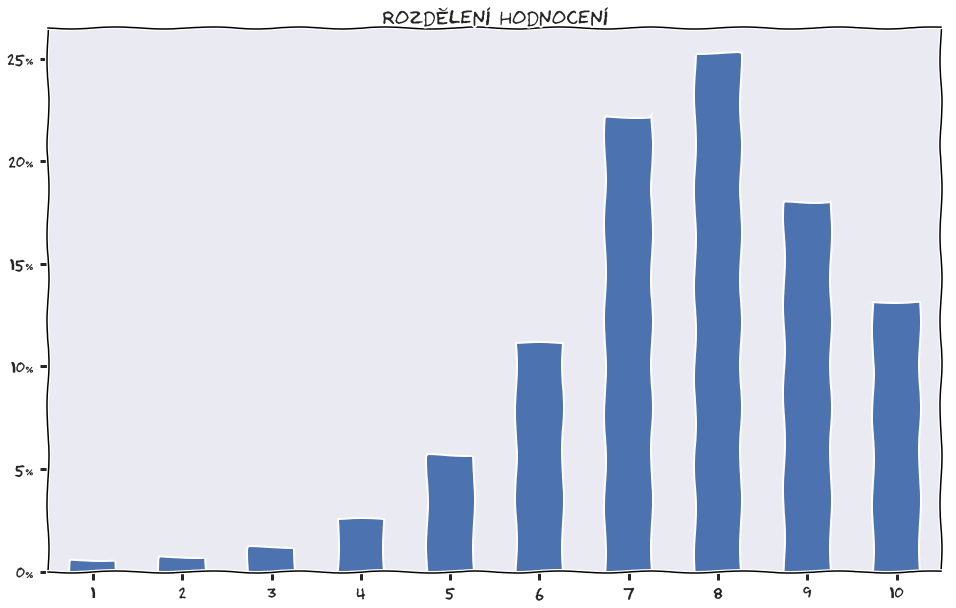

In [162]:
#showing score distribution
scores = animelists[animelists['my_score'] != 0]['my_score'].value_counts()
(scores / scores.sum()).sort_index().plot(kind='bar', figsize=(16, 10), title='Rozdělení hodnocení')
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
plt.xticks(rotation=0)
plt.savefig('graphs/uzivatele-hodnoceni.png', bbox_inches="tight")

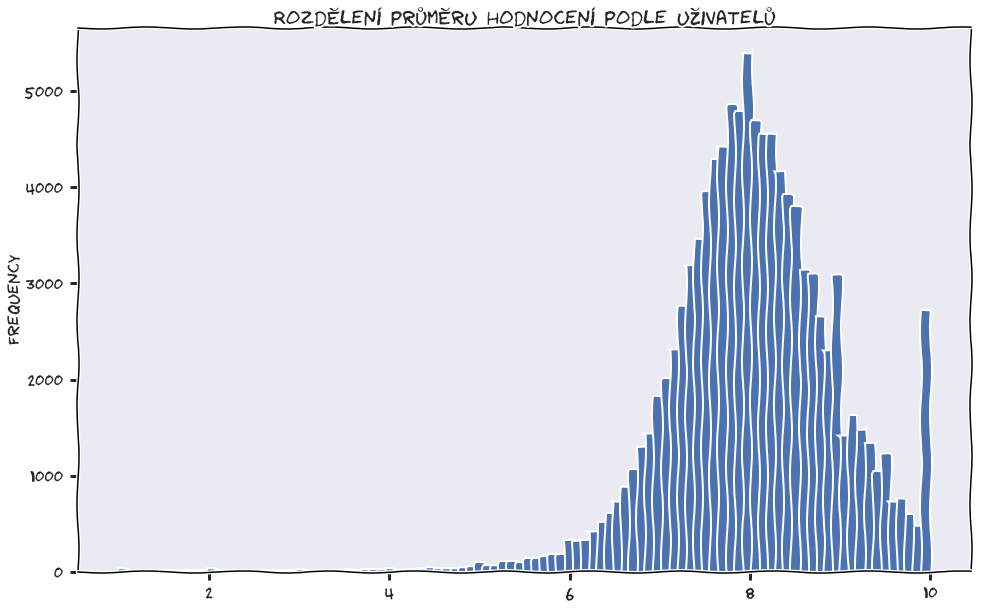

In [163]:
users['all_meanscore'].plot(kind='hist', bins=100, figsize=(16, 10), title='Rozdělení průměru hodnocení podle uživatelů')
plt.xticks(rotation=0)
plt.savefig('graphs/uzivatele-hodnoceni-prumer-histogram.png', bbox_inches="tight")

In [164]:
print('total users:', users['all_meanscore'].count())
print('users with mean score 10:', (users['all_meanscore'] == 10).sum())


total users: 105723
users with mean score 10: 2437


### analyzing users and genres now when I have features for genres per user

In [165]:
completed_columns = sorted(['completed_'+x for x in genres])
completed_columns.remove('completed_')  # removed empty genre
users[completed_columns] = users[completed_columns].fillna(0)  # without this, NaN values are ommited from mean calculation, which messes up data a lot
# semantically, NaN is zero, because it means that user has no completed anime of that genre
users_completed = users[completed_columns].div(users['all_completed'], axis=0).fillna(0)
users_ages_completed = users_completed.join(users['age'])
ages_genres = users_ages_completed.groupby('age').mean()
users_genders_completed = users_completed.join(users['gender'])
genders_genres = users_genders_completed.groupby('gender').mean()

above8_columns = sorted(['scoreabove8_'+x for x in genres])
above8_columns.remove('scoreabove8_')  # removed empty genre
above9_columns = sorted(['scoreabove9_'+x for x in genres])
above9_columns.remove('scoreabove9_')  # removed empty genre
users[above8_columns] = users[above8_columns].fillna(0)
users[above9_columns] = users[above9_columns].fillna(0)
mean_columns = sorted(['meanscore_'+x for x in genres])
mean_columns.remove('meanscore_')  # removed empty genre
users[mean_columns] = users[mean_columns].fillna(0)


In [166]:
# now try the histogram equalization on colormap to better show data
# histogram equalization taken from https://github.com/jobar8/graphics/blob/master/graphics.py and modified little bit
from skimage import exposure

def cmap_to_array(cmap,N=256):
    """
    Return a Nx3 array of RGB values generated from a colormap.
    """
    return cmap(np.linspace(0, 1, N))[:,:3] # remove alpha column

def equalize_colormap(cmap, data, name='EqualizedMap'):
    if type(data) is pd.DataFrame:
        data = data.as_matrix()
    data = data[~np.isnan(data)].flatten()
    cdf, bins = exposure.cumulative_distribution(data, nbins=256)
    # Using it for highly non-uniform data will cause high information loss for extreme values
    #So we do only half equalization, equalizing with histogram averaged with uniform histogram
    # and now the same for uniform distribution of same size
    cdf_u, bins_u = exposure.cumulative_distribution(np.linspace(data.min(), data.max(), data.shape[0]),nbins=256)
    cdf = (cdf + cdf_u) / 2
    '''
    Re-map a colormap according to a cumulative distribution. This is used to 
    perform histogram equalization of an image by changing the colormap 
    instead of the image. *This is not strickly speaking the equalization of the 
    colormap itself*.
    The cdf and bins should be calculated from an input image, as if carrying out
    the histogram equalization of that image. In effect, the cdf becomes integrated  
    to the colormap as a mapping function by redistributing the indices of the
    input colormap.
    
    Parameters
    ----------
    cmap : string or colormap object
        Input colormap to remap.
    bins : array
        Centers of bins.
    cdf : array
        Values of cumulative distribution function.
    '''
    
    # first retrieve the color table (lists of RGB values) behind the input colormap
    if cmap in mpl.cm.cmap_d: # matplotlib colormaps + plus the new ones (viridis, inferno, etc.)
        cmList = cmap_to_array(cm.cmap_d[cmap])
    else:
        try:
            # in case cmap is a colormap object
            cmList = cmap_to_array(cmap) 
        except:
            raise ValueError('Colormap {} has not been recognised'.format(cmap))
    
    # normalize the input bins to interval (0,1)
    bins_norm = (bins - bins.min())/np.float(bins.max() - bins.min())
    
    # calculate new indices by applying the cdf as a function on the old indices
    # which are initially regularly spaced. 
    old_indices = np.linspace(0,1,len(cmList))
    new_indices = np.interp(old_indices,cdf,bins_norm)
    
    # make sure indices start with 0 and end with 1
    new_indices[0] = 0.0
    new_indices[-1] = 1.0
    
    # remap the color table
    cdict = {'red': [], 'green': [], 'blue': []}
    for i,n in enumerate(new_indices):
        r1, g1, b1 = cmList[i]
        cdict['red'].append([n, r1, r1])
        cdict['green'].append([n, g1, g1])
        cdict['blue'].append([n, b1, b1])
        
    return mpl.colors.LinearSegmentedColormap(name, cdict)


Text(0.5,1,'genre percentage in animelists')

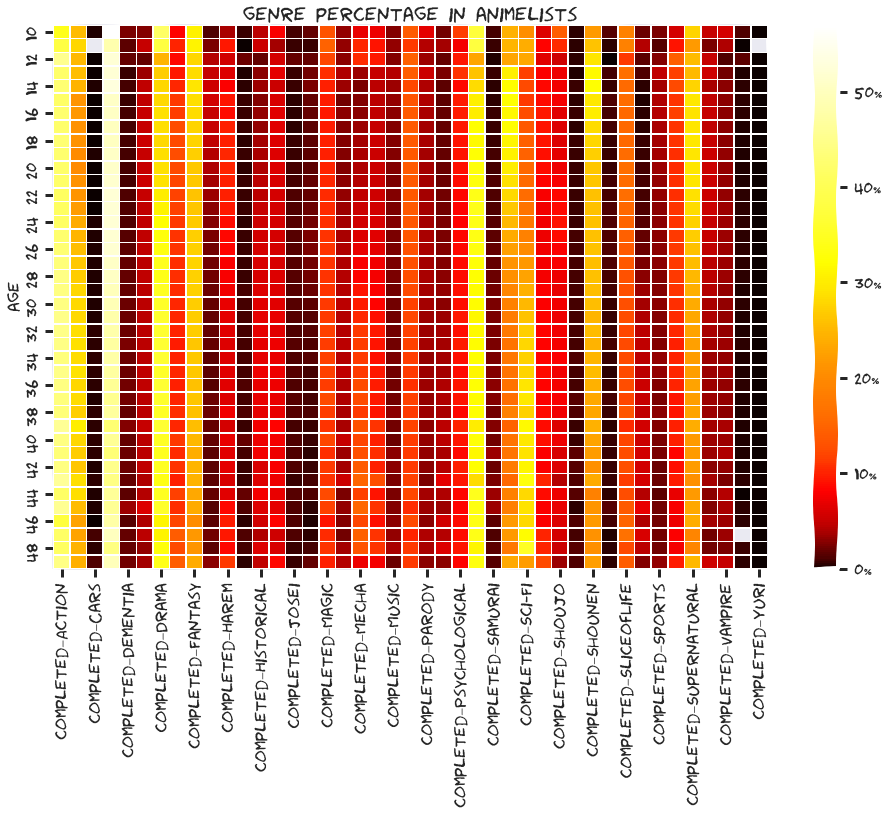

In [167]:
f, ax = plt.subplots(figsize=(16, 10))
#data = ages_genres.div(ages_genres.sum(axis=1), axis=0) * 100
data = ages_genres * 100
cmap = equalize_colormap(plt.cm.hot, data)
mask = np.zeros_like(ages_genres, dtype=np.bool)
mask[ages_genres == 0] = True
sns.heatmap(data, mask=mask, cmap=cmap, linewidths=.5, cbar_kws={'format': '%.0f%%'})
plt.title('genre percentage in animelists')

Text(0.5,1,'histograms normed per genre')

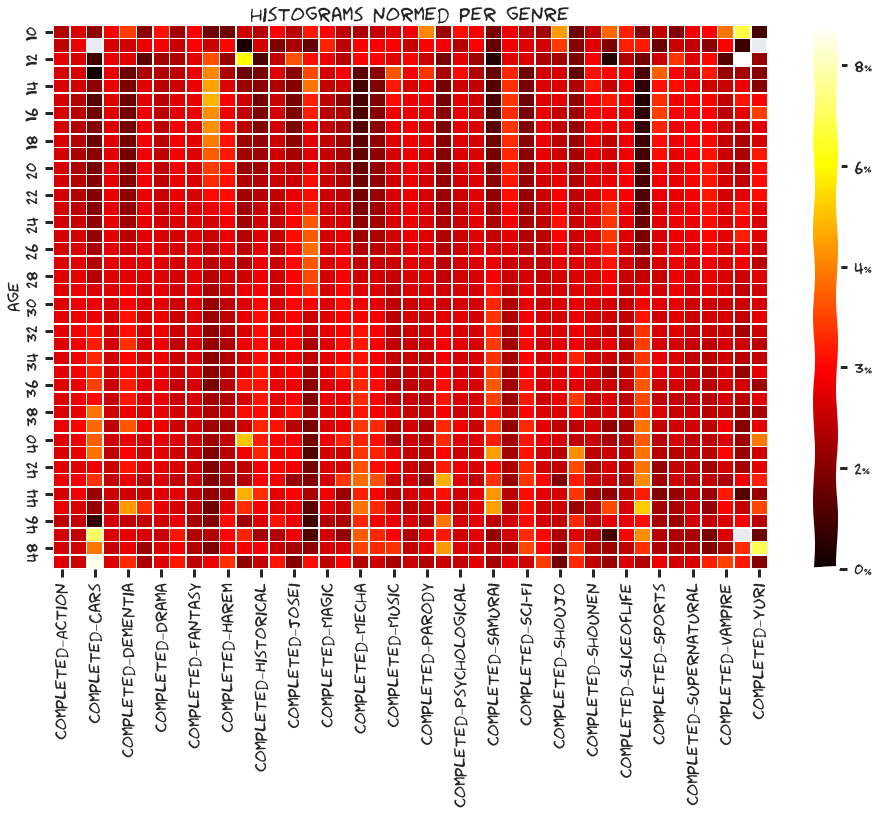

In [168]:
f, ax = plt.subplots(figsize=(16, 10))
data = ages_genres.div(ages_genres.sum(axis=0), axis=1) * 100
#data = ages_genres * 100
mask = np.zeros_like(ages_genres, dtype=np.bool)
mask[ages_genres == 0] = True
sns.heatmap(data, mask=mask, cmap=plt.cm.hot, linewidths=.5, cbar_kws={'format': '%.0f%%'})
plt.title('histograms normed per genre')

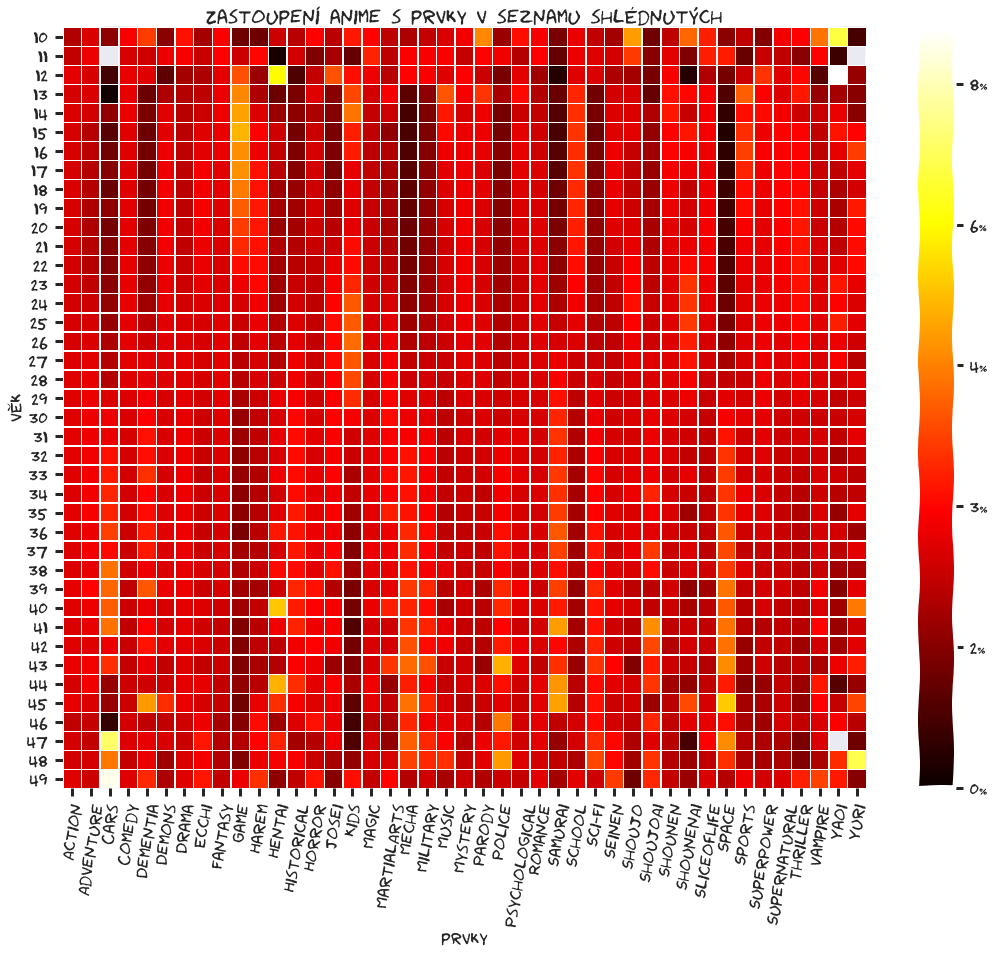

In [265]:
f, ax = plt.subplots(figsize=(18, 14))
renaming = {x: x.replace('completed_', '') for x in completed_columns}
data = ages_genres.div(ages_genres.sum(axis=0), axis=1) * 100
data = data.rename(columns=renaming)
mask = np.zeros_like(ages_genres, dtype=np.bool)
mask[ages_genres == 0] = True
sns.heatmap(data, mask=mask, cmap=plt.cm.hot, linewidths=.5, cbar_kws={'format': '%.0f%%'})
plt.title('Zastoupení anime s prvky v seznamu shlédnutých')
plt.xticks(rotation=80)
plt.ylabel('věk')
plt.xlabel('prvky')
plt.savefig('graphs/uzivatele-vek-zanr-heatmap.png', bbox_inches="tight")

In [170]:
users[['all_completed', 'age', 'gender'] + completed_columns]

,all_completed,age,gender,completed_Action,completed_Adventure,completed_Cars,completed_Comedy,completed_Dementia,completed_Demons,completed_Drama,...,completed_ShounenAi,completed_SliceofLife,completed_Space,completed_Sports,completed_SuperPower,completed_Supernatural,completed_Thriller,completed_Vampire,completed_Yaoi,completed_Yuri
username,,,,,,,,,,,,,,,,,,,,,
karthiga,49.0,28,Female,7.0,5.0,0.0,40.0,0.0,4.0,22.0,...,4.0,10.0,0.0,2.0,2.0,8.0,0.0,0.0,0.0,0.0
Damonashu,188.0,27,Male,103.0,68.0,0.0,90.0,6.0,6.0,75.0,...,0.0,18.0,8.0,6.0,32.0,46.0,12.0,11.0,0.0,0.0
bskai,378.0,28,Male,130.0,79.0,0.0,242.0,5.0,9.0,144.0,...,0.0,64.0,10.0,11.0,37.0,67.0,3.0,10.0,0.0,0.0
terune_uzumaki,5.0,20,Female,0.0,1.0,0.0,5.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
Bas_G,113.0,19,Male,58.0,18.0,0.0,39.0,0.0,6.0,39.0,...,0.0,12.0,4.0,1.0,7.0,33.0,10.0,4.0,0.0,1.0
HimeAria,84.0,22,Female,25.0,15.0,0.0,43.0,0.0,3.0,22.0,...,0.0,10.0,0.0,9.0,8.0,20.0,1.0,1.0,1.0,0.0
Skallington,3.0,27,Male,0.0,0.0,0.0,3.0,0.0,0.0,3.0,...,0.0,3.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0
Slimak,222.0,30,Male,169.0,71.0,0.0,110.0,0.0,16.0,45.0,...,0.0,4.0,2.0,2.0,62.0,74.0,7.0,14.0,0.0,0.0
Elysiun,4.0,34,Male,3.0,3.0,0.0,2.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0


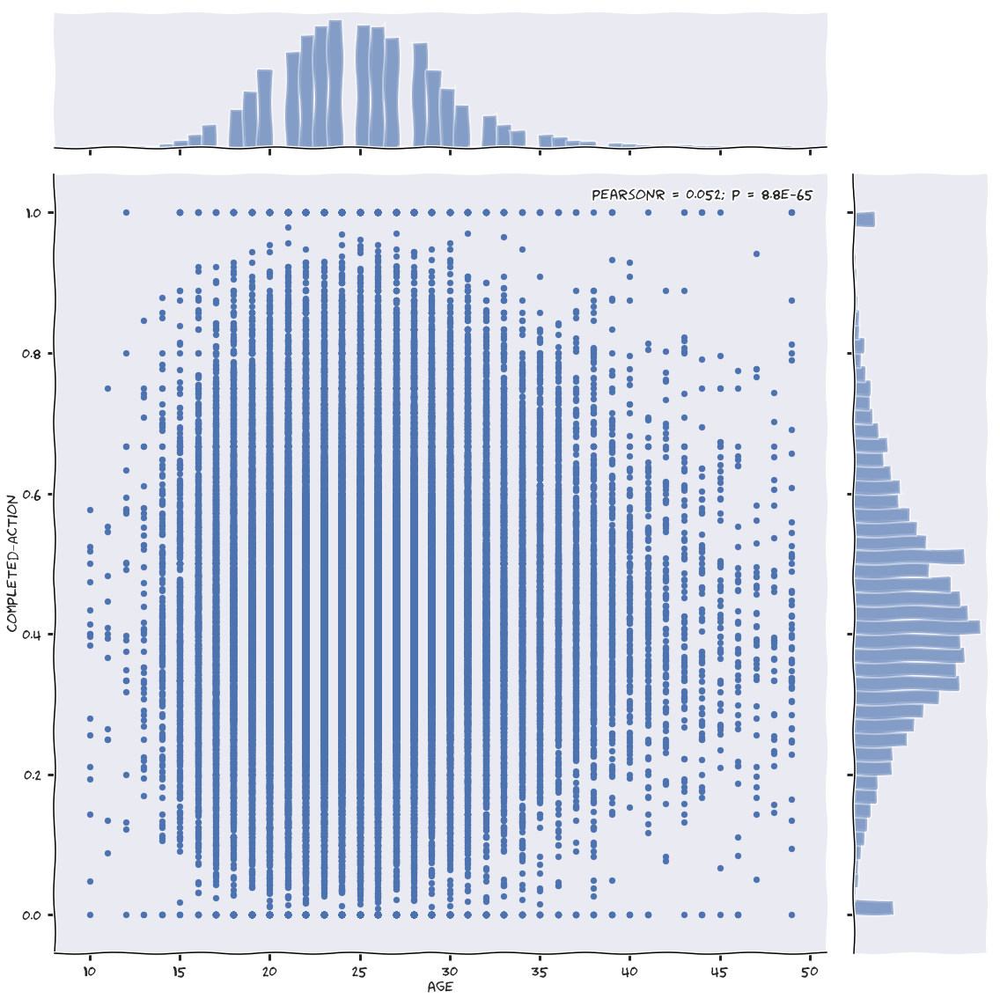

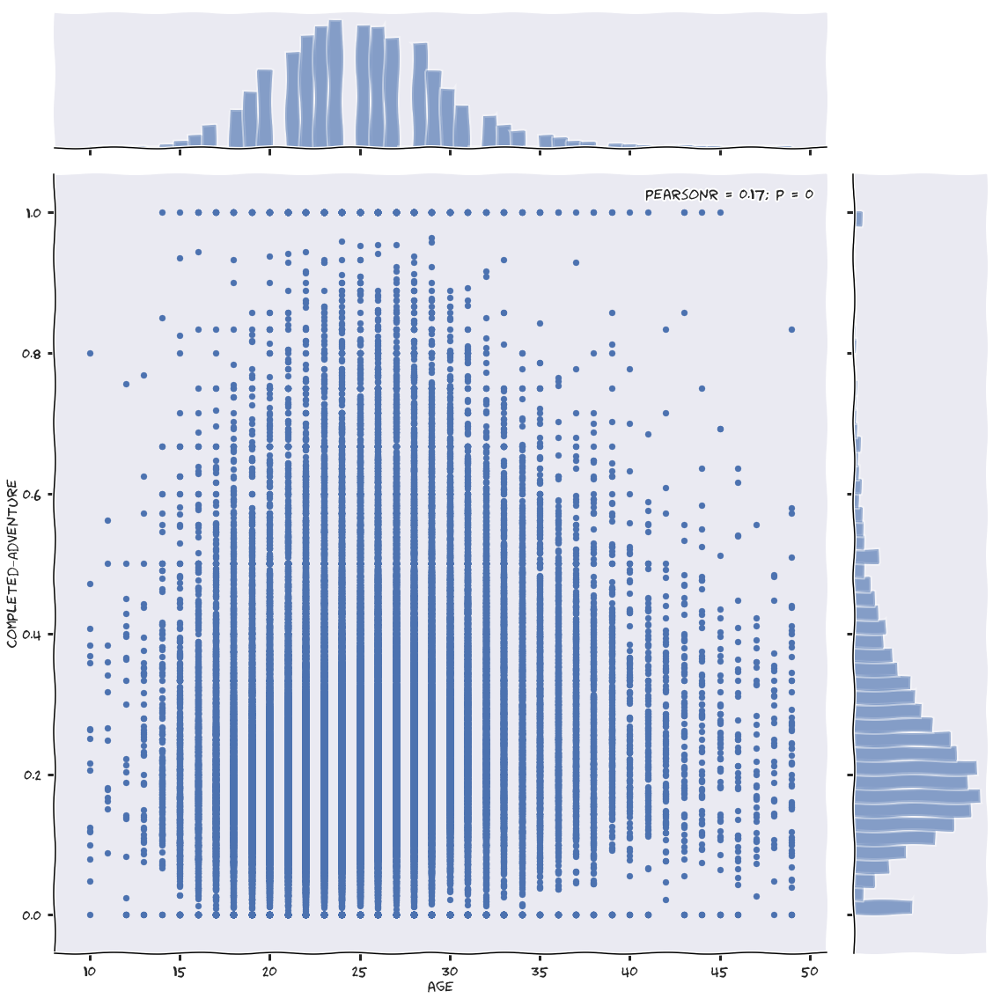

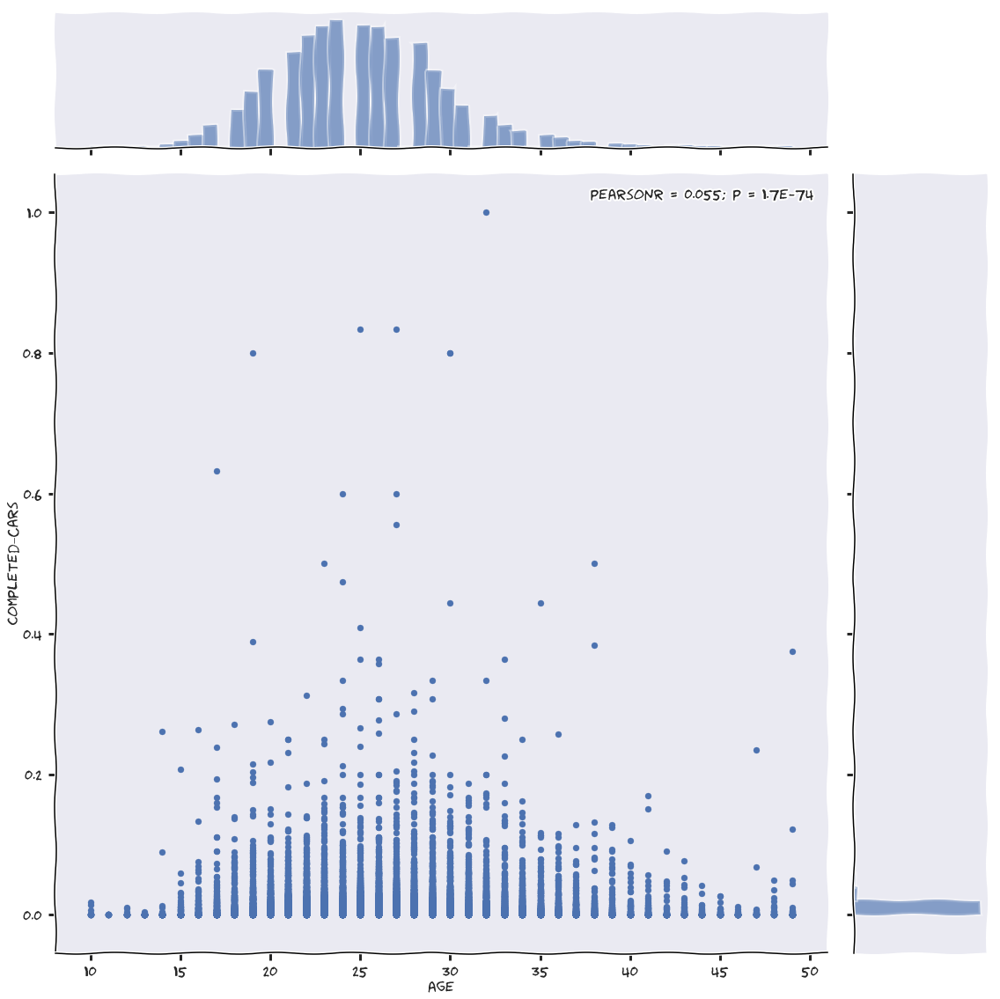

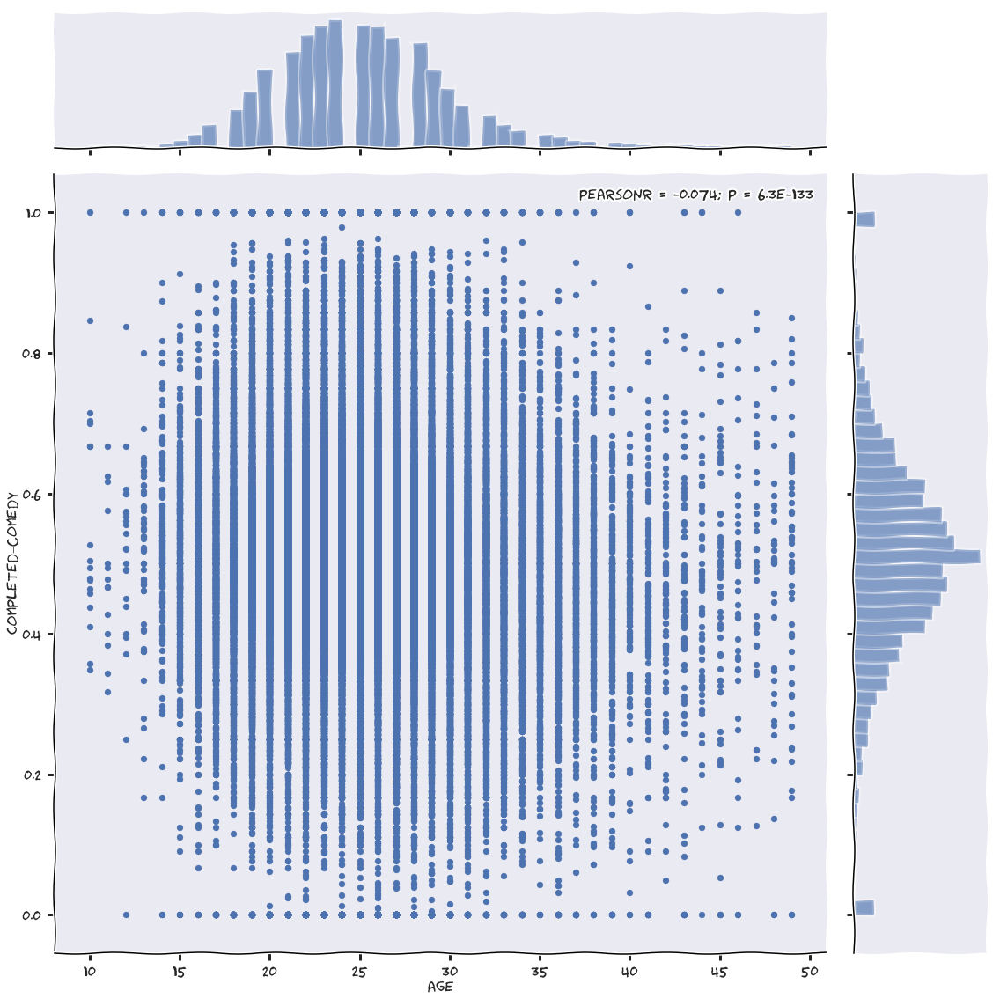

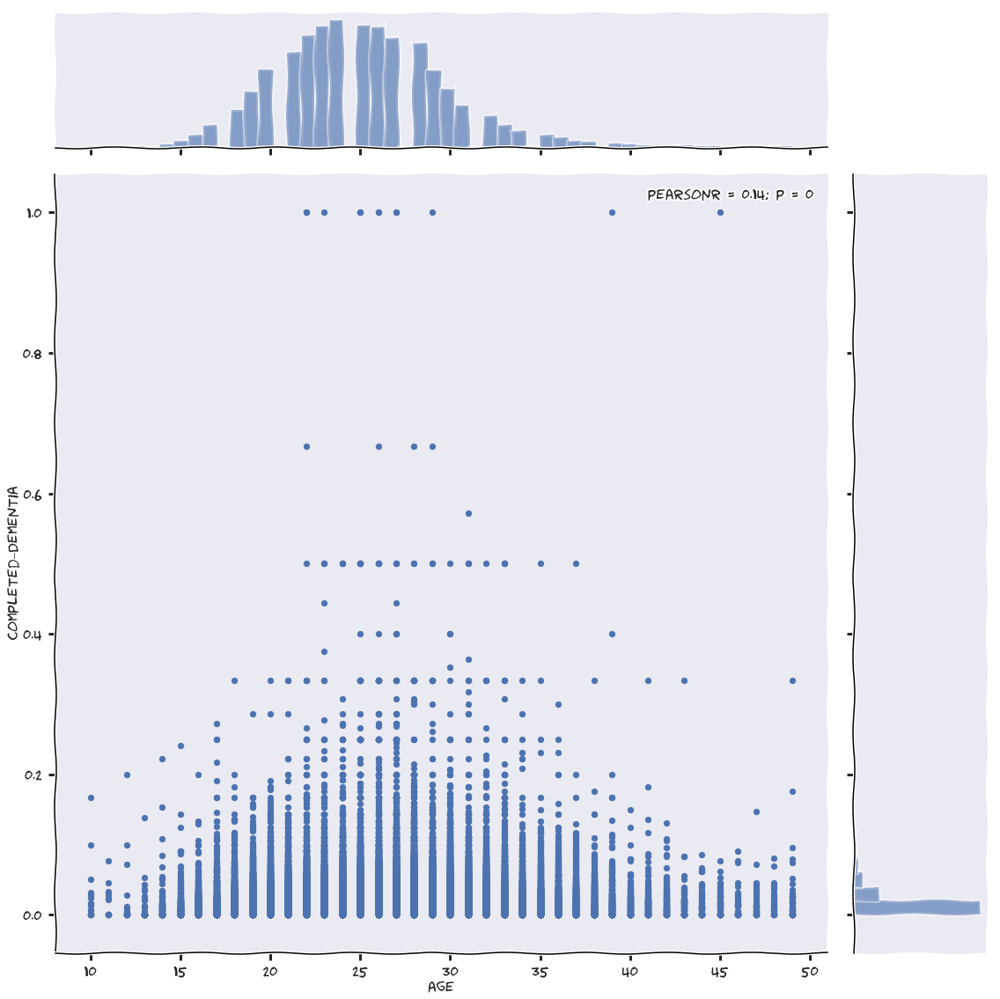

...

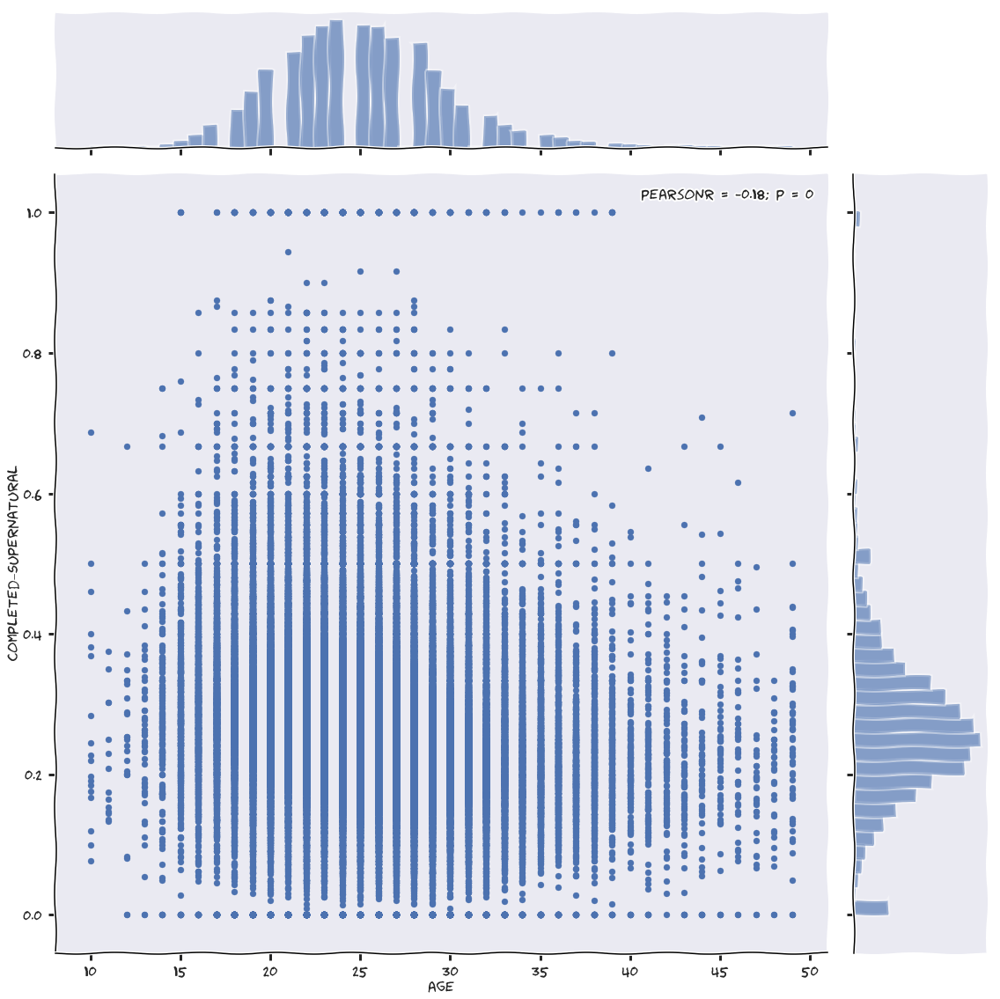

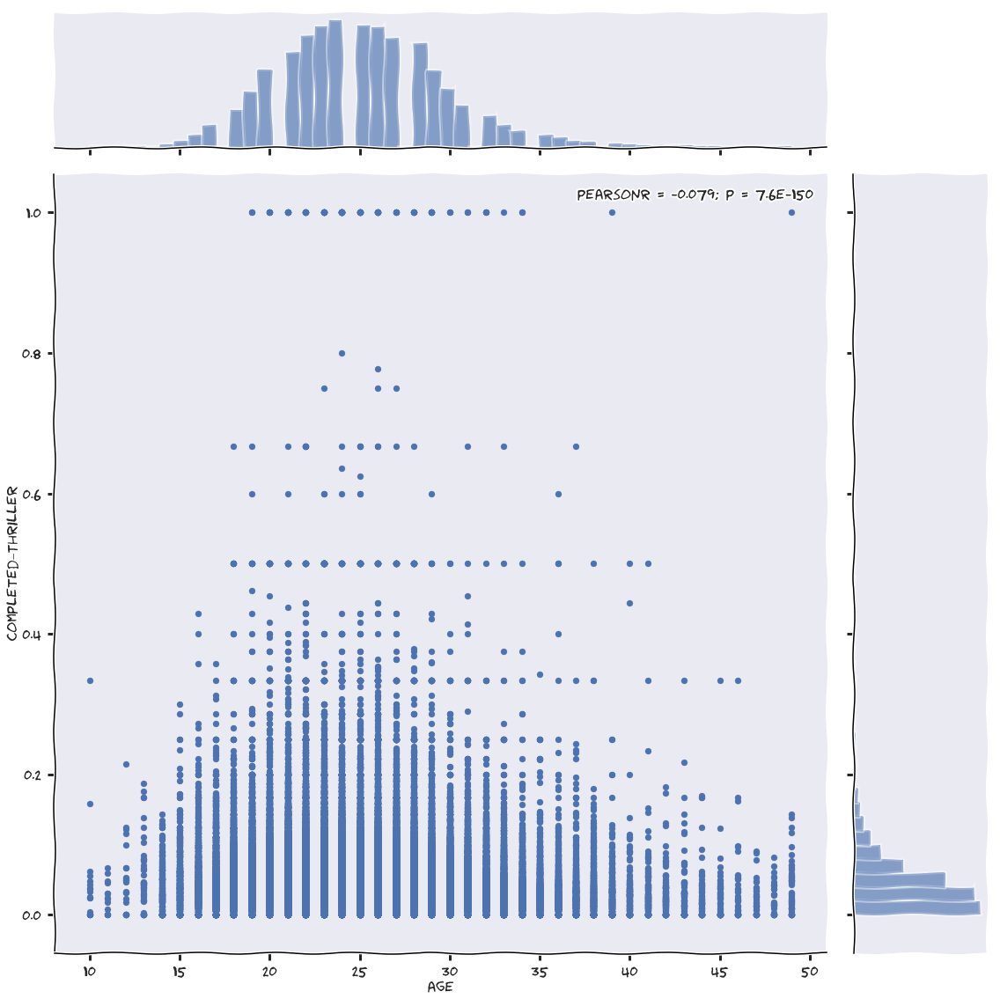

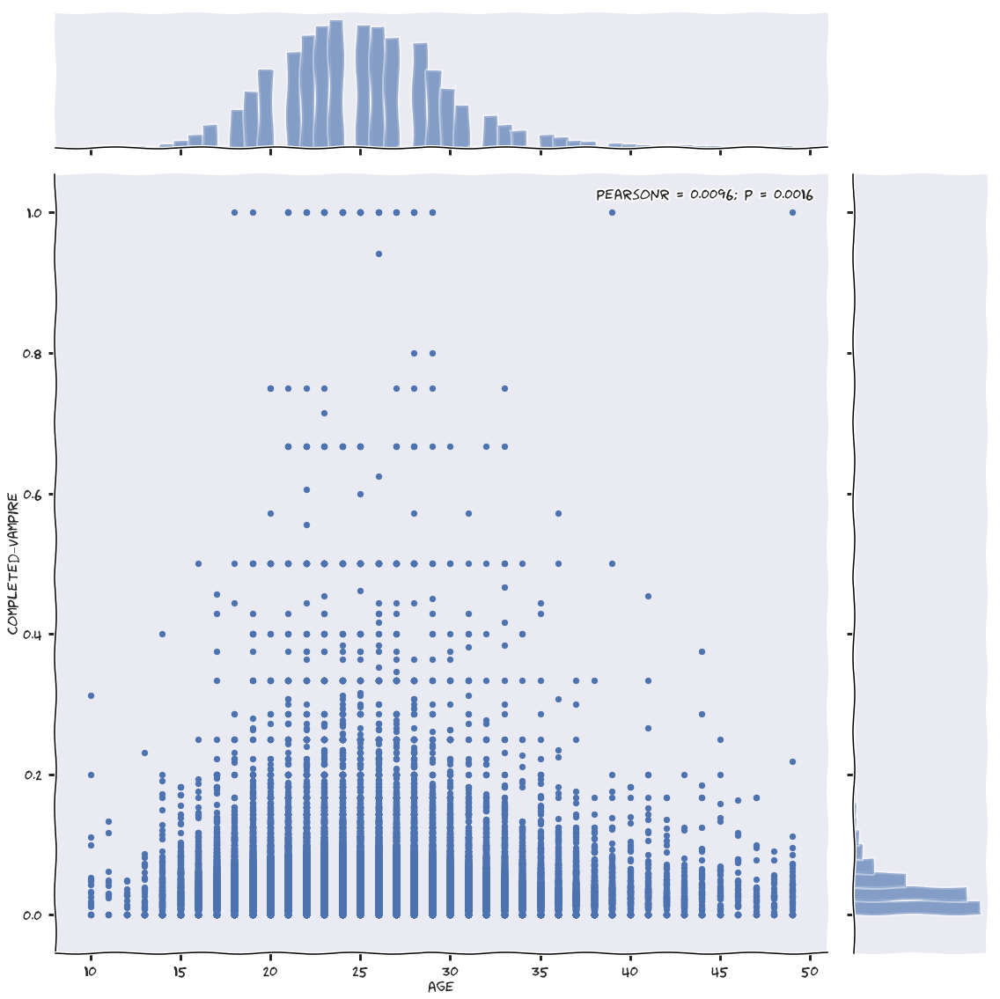

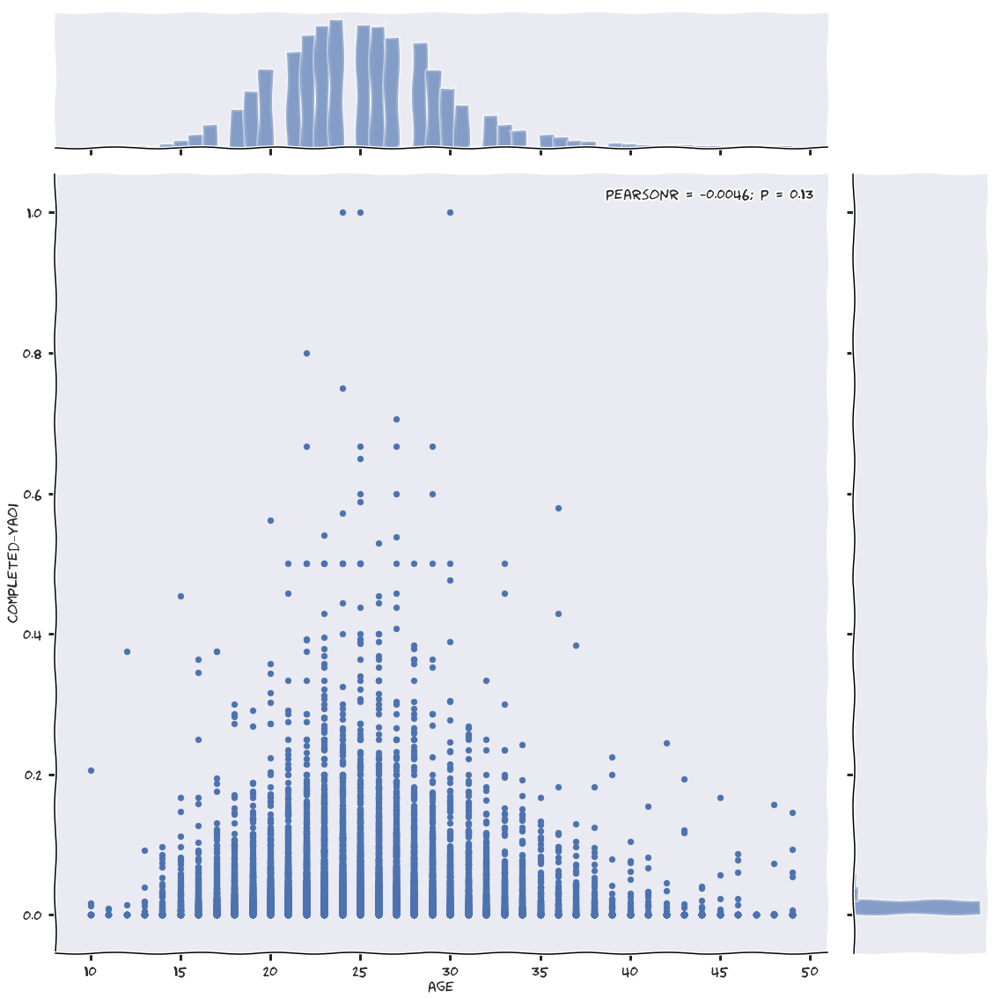

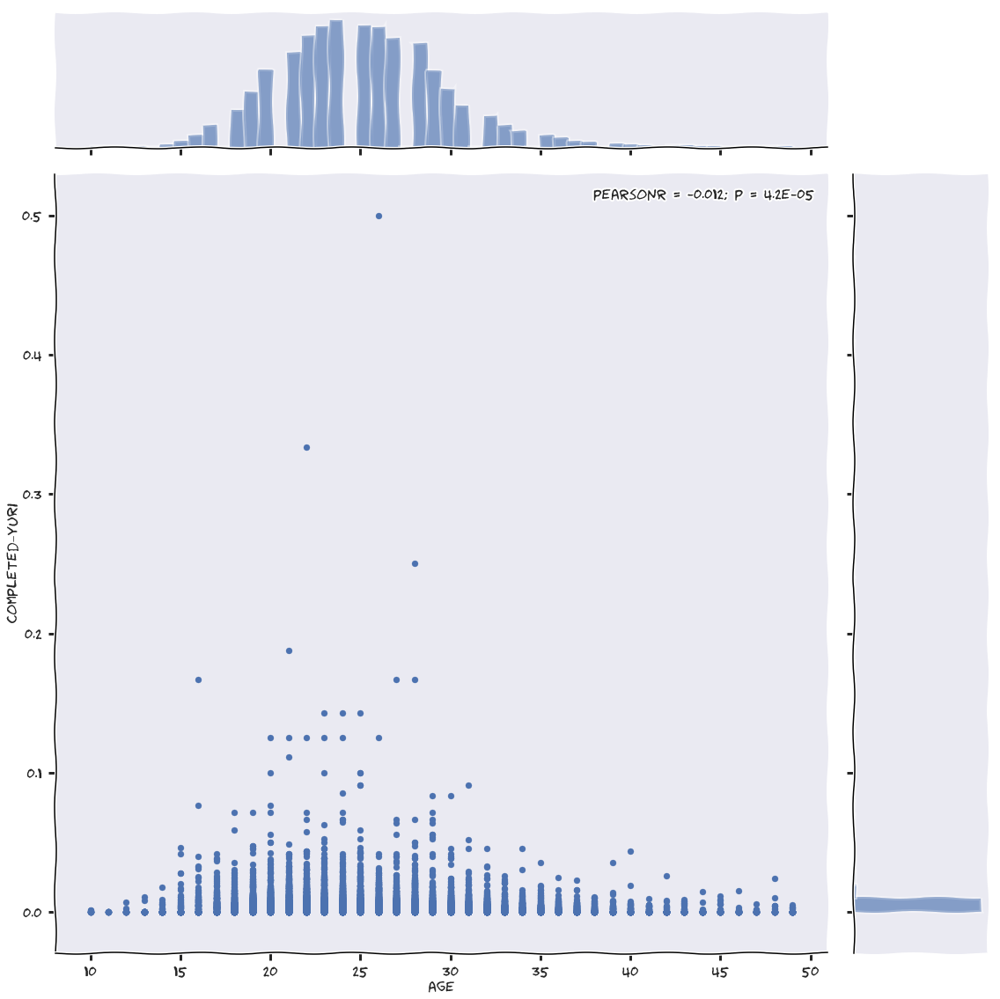

In [171]:
for genre in completed_columns:
    sns.jointplot(x='age', y=genre, data=users_ages_completed, size=16)
    plt.show()

In [172]:
#sns.jointplot(x='age', y='completed_Sci-Fi', data=users_ages_completed, size=16, kind='scatter')

In [173]:
#sns.jointplot(x='age', y='completed_Sci-Fi', data=users_ages_completed, size=16, kind='reg')

In [174]:
#sns.jointplot(x='age', y='completed_Sci-Fi', data=users_ages_completed, size=16, kind='resid')

In [175]:
#sns.jointplot(x='age', y='completed_Sci-Fi', data=users_ages_completed, size=16, kind='kde')

In [176]:
#sns.jointplot(x='age', y='completed_Sci-Fi', data=users_ages_completed, size=16, kind='hex')

In [177]:
#sns.jointplot(x='age', y='completed_Sci-Fi', data=users_ages_completed, size=16).plot_joint(sns.kdeplot, zorder=0, n_levels=20)

In [178]:
# entropy describes how many information it contains. Uniform distribution has highest entropy, dirac distribution lowest. 
# Lower entropy of genre means higher dependency on age
ages_genres[completed_columns].apply(entropy).sort_values()
# shows genres sorted by their dependency on age

completed_Cars             3.484776
completed_Space            3.492352
completed_Samurai          3.563545
completed_Yaoi             3.565160
completed_Mecha            3.584885
completed_Game             3.588596
completed_Kids             3.594614
completed_Yuri             3.598857
completed_Hentai           3.607686
completed_Police           3.624829
completed_Dementia         3.627799
completed_ShounenAi        3.634965
completed_ShoujoAi         3.641704
completed_Sci-Fi           3.644152
completed_Historical       3.648531
completed_Military         3.650001
completed_Josei            3.655107
completed_School           3.659287
completed_Sports           3.662839
completed_Thriller         3.663008
completed_Shoujo           3.664714
completed_Harem            3.667415
completed_Vampire          3.667830
completed_MartialArts      3.668790
completed_Parody           3.674241
completed_Demons           3.674993
completed_Music            3.675950
completed_SuperPower       3

In [179]:
arr = np.ones(ages_genres.index.size)
entropy(arr / arr.sum())

3.6888794541139363

In [180]:
dependent_genres = ages_genres[completed_columns].apply(entropy).sort_values().index[0:6]

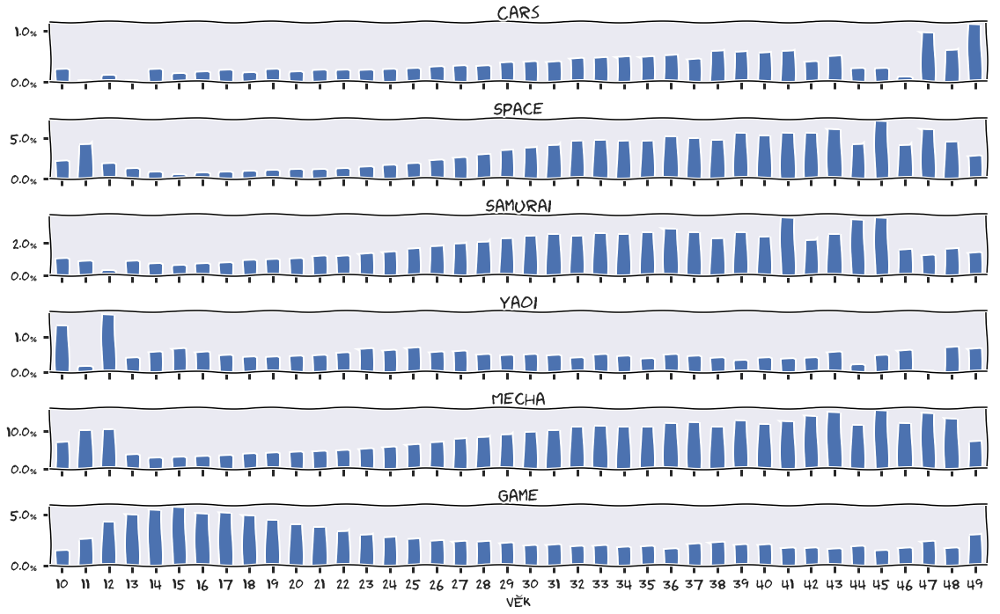

In [181]:
fig, ax = plt.subplots(len(dependent_genres), 1, sharex=True, figsize=(16, 10))
for i, genre in enumerate(dependent_genres):
    ages_genres[genre].plot(kind='bar', ax=ax[i], title=genre.replace('completed_', ''))
    ax[i].yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.1%}'.format(y)))
plt.tight_layout()
plt.xticks(rotation=0)
plt.xlabel('věk')
plt.savefig('graphs/uzivatele-vek-nejrozdilnejsi-bar.png', bbox_inches="tight")

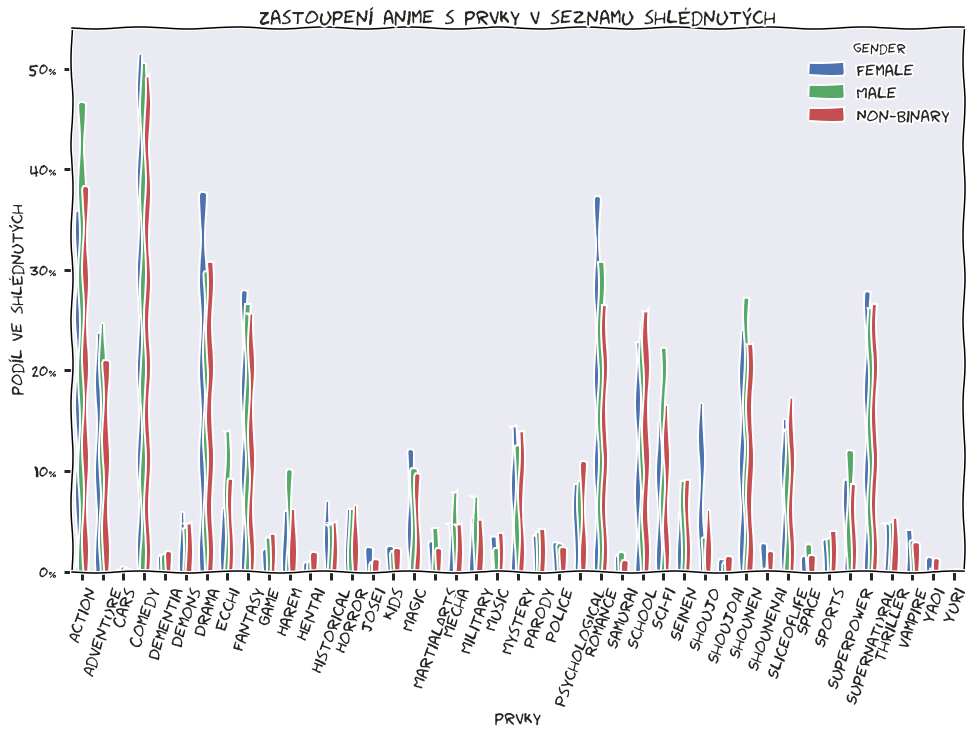

In [182]:
genders_genres.T.plot(kind='bar', figsize=(16, 10))
plt.gca().xaxis.set_major_formatter(FuncFormatter(lambda y, _: genders_genres.columns[y].replace('completed_', '')))
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
plt.title('Zastoupení anime s prvky v seznamu shlédnutých')
plt.xticks(rotation=70)
plt.ylabel('podíl ve shlédnutých')
plt.xlabel('prvky')
plt.savefig('graphs/uzivatele-pohlavi-bar.png', bbox_inches="tight")

In [183]:
genders_genres[completed_columns].apply(entropy).sort_values()

completed_ShounenAi        0.818101
completed_Yaoi             0.844484
completed_Shoujo           0.884273
completed_Cars             0.968212
completed_Josei            0.993397
completed_Yuri             1.000895
completed_Hentai           1.007162
completed_Ecchi            1.047714
completed_Space            1.054377
completed_MartialArts      1.061509
completed_Mecha            1.067239
completed_Harem            1.069608
completed_Game             1.070607
completed_Samurai          1.071659
completed_Music            1.075227
completed_ShoujoAi         1.076199
completed_Historical       1.079689
completed_Military         1.083965
completed_Seinen           1.083979
completed_Sci-Fi           1.084417
completed_Vampire          1.085612
completed_Demons           1.087402
completed_SuperPower       1.087906
completed_Romance          1.088950
completed_Sports           1.091383
completed_Dementia         1.091931
completed_Action           1.092220
completed_Drama            1

In [184]:
genders_genres[completed_columns].apply(np.var).sort_values(ascending=False)

completed_Shoujo           3.372238e-03
completed_Action           2.096643e-03
completed_Romance          1.921287e-03
completed_Drama            1.230466e-03
completed_Ecchi            9.750548e-04
completed_Sci-Fi           9.325351e-04
completed_Shounen          3.632916e-04
completed_Harem            3.323975e-04
completed_Adventure        2.713330e-04
completed_Mecha            2.151913e-04
completed_SuperPower       2.134701e-04
completed_SliceofLife      1.833634e-04
completed_Seinen           1.797318e-04
completed_School           1.655390e-04
completed_Historical       1.177837e-04
completed_Military         1.081437e-04
completed_Magic            1.073377e-04
completed_ShounenAi        1.056848e-04
completed_Comedy           9.317663e-05
completed_Psychological    8.913269e-05
completed_Fantasy          8.590055e-05
completed_Mystery          7.136885e-05
completed_MartialArts      7.095209e-05
completed_Demons           5.596417e-05
completed_Supernatural     4.803192e-05


In [185]:
arr = np.ones(genders_genres.index.size)
entropy(arr / arr.sum())

1.0986122886681096

In [186]:
# variance is better than entropy now
dependent_genres = genders_genres[completed_columns].apply(np.var).sort_values(ascending=False).index[0:12]

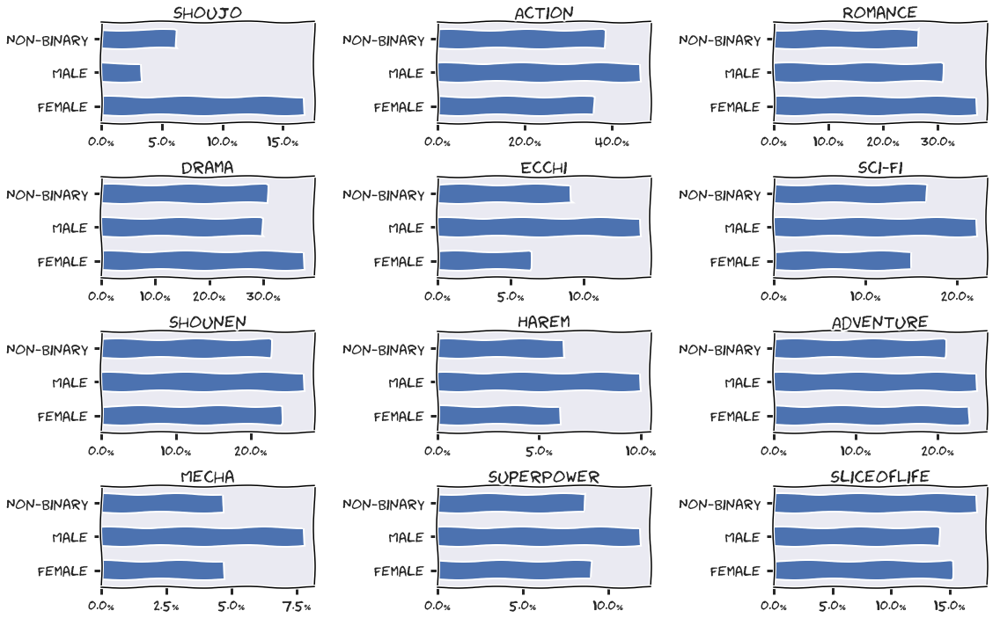

In [260]:
sqrt_num = np.ceil(np.sqrt(len(dependent_genres))).astype('int')
#fig, ax = plt.subplots(sqrt_num, sqrt_num, figsize=(16, 10), squeeze=False)
fig, ax = plt.subplots(4, 3, figsize=(16, 10), squeeze=False)
ax = ax.flatten()
for i, genre in enumerate(dependent_genres):
    genders_genres[genre].plot(kind='barh', ax=ax[i], title=genre.replace('completed_', ''))
    ax[i].xaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.1%}'.format(y)))
    ax[i].set_ylabel('')
plt.tight_layout()
#plt.subplots_adjust()
#plt.xticks(rotation=70)
plt.savefig('graphs/uzivatele-pohlavi-bar-jednotlive.png', bbox_inches="tight")

In [188]:
### and now binning ages into equi-sized bins
age_bins, intervals = pd.qcut(users['age'], 10, retbins=True)
intervals

array([10., 20., 21., 23., 24., 25., 26., 27., 29., 31., 49.])

In [189]:
age_bins.value_counts()
# these intervals suck, they fit 10-20 into one interval

(21.0, 23.0]     17871
(9.999, 20.0]    16448
(27.0, 29.0]     13788
(23.0, 24.0]      9760
(24.0, 25.0]      9379
(25.0, 26.0]      9231
(31.0, 49.0]      8927
(26.0, 27.0]      8383
(29.0, 31.0]      7690
(20.0, 21.0]      7234
Name: age, dtype: int64

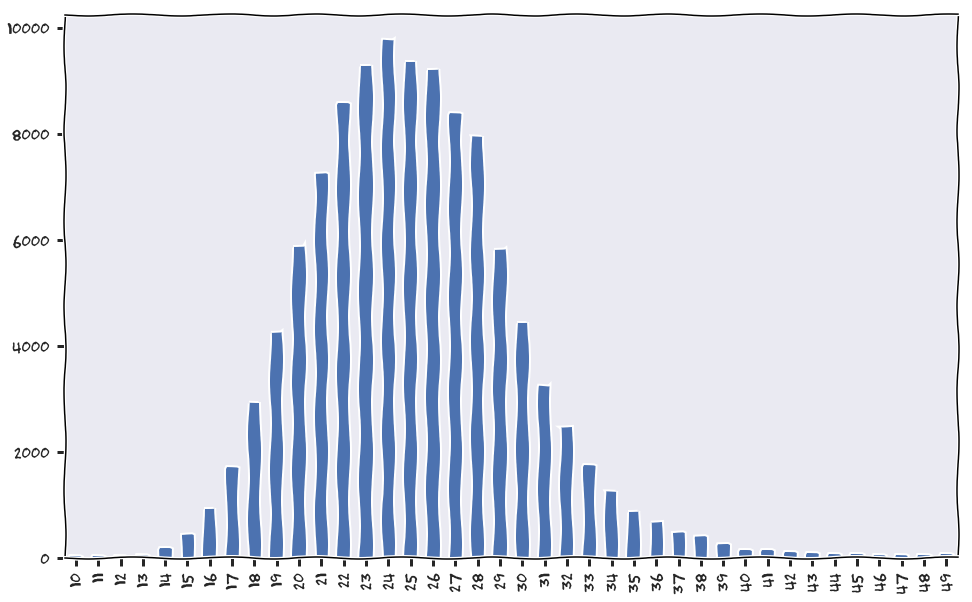

In [190]:
users_ages_completed['age'].value_counts().sort_index().plot(kind='bar', figsize=(16, 10))

In [191]:
bins = [9, 14, 17, 20, 23, 26, 30, 40, 50]
pd.cut(users_ages_completed['age'], bins, right=True).value_counts()
# hand-crafted by intuition

(23, 26]    28370
(26, 30]    26617
(20, 23]    25105
(17, 20]    13097
(30, 40]    11555
(14, 17]     3077
(40, 50]      616
(9, 14]       274
Name: age, dtype: int64

In [192]:
users_ages_completed['age_bin'] = pd.cut(users_ages_completed['age'], bins, right=True).astype(str)

In [193]:
users_ages_completed['age_bin'].value_counts()

(23, 26]    28370
(26, 30]    26617
(20, 23]    25105
(17, 20]    13097
(30, 40]    11555
(14, 17]     3077
(40, 50]      616
(9, 14]       274
Name: age_bin, dtype: int64

In [194]:
def tree_to_table(clf, target_column):
    def expand_node(curr_node, prefix):
        # three is balanced
        thr_percent = "{0:.1%}".format(threshold[curr_node])
        fname = fnames[feature[curr_node]]
        if children_left[curr_node] == -1 and children_right[curr_node] == -1:
            return [prefix], [targets[curr_node]], [value[curr_node, 0, :]]
        l_res, l_target, l_distr = expand_node(children_left[curr_node], prefix + [fname + ' <= ' + thr_percent])
        r_res, r_target, r_distr = expand_node(children_right[curr_node], prefix + [fname + ' > ' + thr_percent])
        return l_res + r_res, l_target + r_target, l_distr + r_distr

    children_left = clf.tree_.children_left
    children_right = clf.tree_.children_right
    feature = clf.tree_.feature
    threshold = clf.tree_.threshold
    value = clf.tree_.value

    fnames = [i.replace('completed_', '') for i in completed_columns]
    targets = [target_names[np.argmax(v)] for v in value]
    paths, classes, distr = expand_node(0, [])
    distr = np.array(distr)
    indices = pd.MultiIndex.from_tuples(paths)
    df = pd.DataFrame({target_column: classes, 'precision': (distr.max(axis=1) / distr.sum(axis=1))},
                      index=indices)
    df['precision'] = df['precision'].apply(lambda x: "{0:.2f}%".format(x * 100))
    # precision in classification terminology is # correctly classified / # totally classified (correctly + incorrectly)
    return df

In [195]:
# guessing gender based on completed genres histogram
clf = tree.DecisionTreeClassifier(max_depth=2)
clf = clf.fit(users_genders_completed[completed_columns], users_genders_completed['gender'])
y_true = users_genders_completed['gender']
y_pred = clf.predict(users_genders_completed[completed_columns])
target_names = users_genders_completed['gender'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

             precision    recall  f1-score   support

     Female       0.82      0.79      0.80     37330
       Male       0.89      0.91      0.90     70880
 Non-Binary       0.00      0.00      0.00       501

avg / total       0.86      0.87      0.86    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


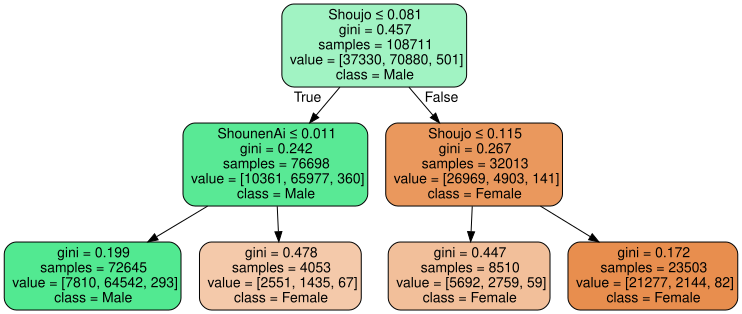

In [196]:
tree.export_graphviz(clf, out_file='gender_classifier.dot',
                         feature_names=[i.replace('completed_', '') for i in completed_columns],
                         class_names=users_genders_completed['gender'].unique(),
                         filled=True, rounded=True,
                         special_characters=True)
dot_data = tree.export_graphviz(clf, out_file=None,
                         feature_names=[i.replace('completed_', '') for i in completed_columns],
                         class_names=users_genders_completed['gender'].unique(),
                         filled=True, rounded=True,
                         special_characters=True)
graph = graphviz.Source(dot_data)
graph

In [197]:
tree_to_table(clf, 'gender')

gender precision
Shoujo <= 8.1% ShounenAi <= 1.1%    Male    88.85%
               ShounenAi > 1.1%   Female    62.94%
Shoujo > 8.1%  Shoujo <= 11.5%    Female    66.89%
               Shoujo > 11.5%     Female    90.53%

In [198]:
# comparing precision depending on depth
clf = tree.DecisionTreeClassifier(max_depth=1)
clf = clf.fit(users_genders_completed[completed_columns], users_genders_completed['gender'])
y_true = users_genders_completed['gender']
y_pred = clf.predict(users_genders_completed[completed_columns])
target_names = users_genders_completed['gender'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))
tree_to_table(clf, 'gender')

             precision    recall  f1-score   support

     Female       0.84      0.72      0.78     37330
       Male       0.86      0.93      0.89     70880
 Non-Binary       0.00      0.00      0.00       501

avg / total       0.85      0.85      0.85    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


,gender,precision
Shoujo <= 8.1%,Male,86.02%
Shoujo > 8.1%,Female,84.24%


In [199]:
# comparing precision depending on depth
clf = tree.DecisionTreeClassifier(max_depth=2)
clf = clf.fit(users_genders_completed[completed_columns], users_genders_completed['gender'])
y_true = users_genders_completed['gender']
y_pred = clf.predict(users_genders_completed[completed_columns])
target_names = users_genders_completed['gender'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))
tree_to_table(clf, 'gender')

             precision    recall  f1-score   support

     Female       0.82      0.79      0.80     37330
       Male       0.89      0.91      0.90     70880
 Non-Binary       0.00      0.00      0.00       501

avg / total       0.86      0.87      0.86    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


gender precision
Shoujo <= 8.1% ShounenAi <= 1.1%    Male    88.85%
               ShounenAi > 1.1%   Female    62.94%
Shoujo > 8.1%  Shoujo <= 11.5%    Female    66.89%
               Shoujo > 11.5%     Female    90.53%

In [200]:
clf = tree.DecisionTreeClassifier(max_depth=3)
clf = clf.fit(users_genders_completed[completed_columns], users_genders_completed['gender'])
y_true = users_genders_completed['gender']
y_pred = clf.predict(users_genders_completed[completed_columns])
target_names = users_genders_completed['gender'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))
tree_to_table(clf, 'gender')

             precision    recall  f1-score   support

     Female       0.83      0.77      0.80     37330
       Male       0.88      0.92      0.90     70880
 Non-Binary       0.00      0.00      0.00       501

avg / total       0.86      0.87      0.86    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


gender precision
Shoujo <= 8.1% ShounenAi <= 1.1% Ecchi <= 2.1%        Male    68.65%
                                 Ecchi > 2.1%         Male    91.68%
               ShounenAi > 1.1%  ShounenAi <= 2.0%    Male    51.66%
                                 ShounenAi > 2.0%   Female    72.40%
Shoujo > 8.1%  Shoujo <= 11.5%   ShounenAi <= 0.5%  Female    50.97%
                                 ShounenAi > 0.5%   Female    85.44%
               Shoujo > 11.5%    Josei <= 0.5%      Female    83.64%
                                 Josei > 0.5%       Female    94.25%

In [201]:
import pickle
with open('tree_clf.rick', 'wb+') as f:
    pickle.dump(clf, f)

In [202]:
clf = tree.DecisionTreeClassifier(max_depth=4)
clf = clf.fit(users_genders_completed[completed_columns], users_genders_completed['gender'])
y_true = users_genders_completed['gender']
y_pred = clf.predict(users_genders_completed[completed_columns])
target_names = users_genders_completed['gender'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))
tree_to_table(clf, 'gender')

             precision    recall  f1-score   support

     Female       0.86      0.77      0.81     37330
       Male       0.88      0.93      0.91     70880
 Non-Binary       0.00      0.00      0.00       501

avg / total       0.87      0.87      0.87    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


gender  \
Shoujo <= 8.1% ShounenAi <= 1.1% Ecchi <= 2.1%     Sci-Fi <= 17.5%    Male   
                                                   Sci-Fi > 17.5%     Male   
                                 Ecchi > 2.1%      Shoujo <= 5.5%     Male   
                                                   Shoujo > 5.5%      Male   
               ShounenAi > 1.1%  ShounenAi <= 2.0% Shoujo <= 4.8%     Male   
                                                   Shoujo > 4.8%    Female   
                                 ShounenAi > 2.0%  Shoujo <= 4.5%   Female   
                                                   Shoujo > 4.5%    Female   
Shoujo > 8.1%  Shoujo <= 11.5%   ShounenAi <= 0.5% Ecchi <= 9.3%    Female   
                                                   Ecchi > 9.3%       Male   
                                 ShounenAi > 0.5%  Harem <= 11.2%   Female   
                                                   Harem > 11.2%    Female   
               Shoujo > 11.5%    Josei <= 0.5%     Shoujo <= 17.4%  Female   
                                                   Shoujo > 17.4%   Female   
                                 Josei > 0.5%      Shoujo <= 16.8%  Female   
                                                   Shoujo > 16.8%   Female   

                                                                   precision  
Shoujo <= 8.1% ShounenAi <= 1.1% Ecchi <= 2.1%     Sci-Fi <= 17.5%    57.43%  
                                                   Sci-Fi > 17.5%     77.21%  
                                 Ecchi > 2.1%      Shoujo <= 5.5%     93.72%  
                                                   Shoujo > 5.5%      77.38%  
               ShounenAi > 1.1%  ShounenAi <= 2.0% Shoujo <= 4.8%     68.90%  
                                                   Shoujo > 4.8%      60.99%  
                                 ShounenAi > 2.0%  Shoujo <= 4.5%     61.23%  
                                                   Shoujo > 4.5%      79.06%  
Shoujo > 8.1%  Shoujo <= 11.5%   ShounenAi <= 0.5% Ecchi <= 9.3%      63.13%  
                                                   Ecchi > 9.3%       66.88%  
                                 ShounenAi > 0.5%  Harem <= 11.2%     87.39%  
                                                   Harem > 11.2%      61.74%  
               Shoujo > 11.5%    Josei <= 0.5%     Shoujo <= 17.4%    71.03%  
                                                   Shoujo > 17.4%     89.59%  
                                 Josei > 0.5%      Shoujo <= 16.8%    90.70%  
                                                   Shoujo > 16.8%     96.79%

In [203]:
clf = tree.DecisionTreeClassifier(max_depth=5)
clf = clf.fit(users_genders_completed[completed_columns], users_genders_completed['gender'])
y_true = users_genders_completed['gender']
y_pred = clf.predict(users_genders_completed[completed_columns])
target_names = users_genders_completed['gender'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))
tree_to_table(clf, 'gender')

             precision    recall  f1-score   support

     Female       0.87      0.76      0.81     37330
       Male       0.88      0.94      0.91     70880
 Non-Binary       0.00      0.00      0.00       501

avg / total       0.87      0.87      0.87    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


gender  \
Shoujo <= 8.1% ShounenAi <= 1.1% Ecchi <= 2.1%     Sci-Fi <= 17.5% MartialArts <= 3.7%    Male   
                                                                   MartialArts > 3.7%     Male   
                                                   Sci-Fi > 17.5%  Shoujo <= 5.2%         Male   
                                                                   Shoujo > 5.2%          Male   
                                 Ecchi > 2.1%      Shoujo <= 5.5%  MartialArts <= 0.2%    Male   
                                                                   MartialArts > 0.2%     Male   
                                                   Shoujo > 5.5%   Romance <= 30.0%       Male   
                                                                   Romance > 30.0%        Male   
               ShounenAi > 1.1%  ShounenAi <= 2.0% Shoujo <= 4.8%  Harem <= 3.9%          Male   
                                                                   Harem > 3.9%           Male   
                                                   Shoujo > 4.8%   Harem <= 12.1%       Female   
                                                                   Harem > 12.1%          Male   
                                 ShounenAi > 2.0%  Shoujo <= 4.5%  Space <= 0.9%        Female   
                                                                   Space > 0.9%           Male   
                                                   Shoujo > 4.5%   Mecha <= 8.1%        Female   
                                                                   Mecha > 8.1%         Female   
Shoujo > 8.1%  Shoujo <= 11.5%   ShounenAi <= 0.5% Ecchi <= 9.3%   Mecha <= 8.2%        Female   
                                                                   Mecha > 8.2%           Male   
                                                   Ecchi > 9.3%    Mystery <= 14.4%       Male   
                                                                   Mystery > 14.4%      Female   
                                 ShounenAi > 0.5%  Harem <= 11.2%  Space <= 5.0%        Female   
                                                                   Space > 5.0%         Female   
                                                   Harem > 11.2%   Mecha <= 2.3%        Female   
                                                                   Mecha > 2.3%         Female   
               Shoujo > 11.5%    Josei <= 0.5%     Shoujo <= 17.4% ShounenAi <= 0.7%    Female   
                                                                   ShounenAi > 0.7%     Female   
                                                   Shoujo > 17.4%  Shoujo <= 25.7%      Female   
                                                                   Shoujo > 25.7%       Female   
                                 Josei > 0.5%      Shoujo <= 16.8% ShounenAi <= 0.1%    Female   
                                                                   ShounenAi > 0.1%     Female   
                                                   Shoujo > 16.8%  Action <= 80.9%      Female   
                                                                   Action > 80.9%         Male   

                                                                                       precision  
Shoujo <= 8.1% ShounenAi <= 1.1% Ecchi <= 2.1%     Sci-Fi <= 17.5% MartialArts <= 3.7%    52.02%  
                                                                   MartialArts > 3.7%     70.76%  
                                                   Sci-Fi > 17.5%  Shoujo <= 5.2%         80.10%  
                                                                   Shoujo > 5.2%          55.87%  
                                 Ecchi > 2.1%      Shoujo <= 5.5%  MartialArts <= 0.2%    83.93%  
                                                                   MartialArts > 0.2%     95.45%  
                                                   Shoujo > 5.5%   Romance <= 30.0%       62.57%  
                                                             

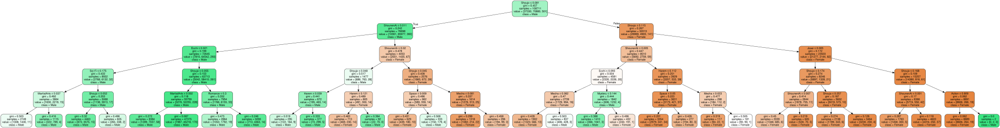

In [204]:
dot_data = tree.export_graphviz(clf, out_file=None,
                         feature_names=[i.replace('completed_', '') for i in completed_columns],
                         class_names=users_genders_completed['gender'].unique(),
                         filled=True, rounded=True,
                         special_characters=True)
graph = graphviz.Source(dot_data)
graph

In [205]:
clf = tree.DecisionTreeClassifier(max_depth=6)
clf = clf.fit(users_genders_completed[completed_columns], users_genders_completed['gender'])
y_true = users_genders_completed['gender']
y_pred = clf.predict(users_genders_completed[completed_columns])
target_names = users_genders_completed['gender'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

             precision    recall  f1-score   support

     Female       0.86      0.79      0.82     37330
       Male       0.89      0.93      0.91     70880
 Non-Binary       0.00      0.00      0.00       501

avg / total       0.88      0.88      0.88    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [206]:
clf = tree.DecisionTreeClassifier(max_depth=7)
clf = clf.fit(users_genders_completed[completed_columns], users_genders_completed['gender'])
y_true = users_genders_completed['gender']
y_pred = clf.predict(users_genders_completed[completed_columns])
target_names = users_genders_completed['gender'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

             precision    recall  f1-score   support

     Female       0.87      0.79      0.83     37330
       Male       0.89      0.94      0.92     70880
 Non-Binary       0.00      0.00      0.00       501

avg / total       0.88      0.88      0.88    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [207]:
clf = tree.DecisionTreeClassifier(max_depth=8)
clf = clf.fit(users_genders_completed[completed_columns], users_genders_completed['gender'])
y_true = users_genders_completed['gender']
y_pred = clf.predict(users_genders_completed[completed_columns])
target_names = users_genders_completed['gender'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

             precision    recall  f1-score   support

     Female       0.88      0.80      0.83     37330
       Male       0.89      0.94      0.92     70880
 Non-Binary       1.00      0.00      0.01       501

avg / total       0.89      0.89      0.89    108711



In [208]:
# first, trying some depths

In [209]:
clf = tree.DecisionTreeClassifier(max_depth=2)
clf = clf.fit(users_ages_completed[completed_columns], users_ages_completed['age_bin'])
y_true = users_ages_completed['age_bin']
y_pred = clf.predict(users_ages_completed[completed_columns])
target_names = users_ages_completed['age_bin'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

             precision    recall  f1-score   support

   (26, 30]       0.00      0.00      0.00      3077
   (17, 20]       0.00      0.00      0.00     13097
   (20, 23]       0.31      0.38      0.34     25105
   (30, 40]       0.31      0.48      0.38     28370
   (23, 26]       0.36      0.45      0.40     26617
   (14, 17]       0.00      0.00      0.00     11555
   (40, 50]       0.00      0.00      0.00       616
    (9, 14]       0.00      0.00      0.00       274

avg / total       0.24      0.32      0.28    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [210]:
clf = tree.DecisionTreeClassifier(max_depth=3)
clf = clf.fit(users_ages_completed[completed_columns], users_ages_completed['age_bin'])
y_true = users_ages_completed['age_bin']
y_pred = clf.predict(users_ages_completed[completed_columns])
target_names = users_ages_completed['age_bin'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

             precision    recall  f1-score   support

   (26, 30]       0.00      0.00      0.00      3077
   (17, 20]       0.00      0.00      0.00     13097
   (20, 23]       0.33      0.26      0.29     25105
   (30, 40]       0.30      0.66      0.41     28370
   (23, 26]       0.38      0.37      0.38     26617
   (14, 17]       0.00      0.00      0.00     11555
   (40, 50]       0.00      0.00      0.00       616
    (9, 14]       0.00      0.00      0.00       274

avg / total       0.25      0.32      0.27    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [211]:
clf = tree.DecisionTreeClassifier(max_depth=4)
clf = clf.fit(users_ages_completed[completed_columns], users_ages_completed['age_bin'])
y_true = users_ages_completed['age_bin']
y_pred = clf.predict(users_ages_completed[completed_columns])
target_names = users_ages_completed['age_bin'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

             precision    recall  f1-score   support

   (26, 30]       0.00      0.00      0.00      3077
   (17, 20]       0.00      0.00      0.00     13097
   (20, 23]       0.32      0.56      0.41     25105
   (30, 40]       0.32      0.33      0.32     28370
   (23, 26]       0.38      0.44      0.41     26617
   (14, 17]       0.44      0.18      0.25     11555
   (40, 50]       0.00      0.00      0.00       616
    (9, 14]       0.00      0.00      0.00       274

avg / total       0.30      0.34      0.31    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [212]:
clf = tree.DecisionTreeClassifier(max_depth=5)
clf = clf.fit(users_ages_completed[completed_columns], users_ages_completed['age_bin'])
y_true = users_ages_completed['age_bin']
y_pred = clf.predict(users_ages_completed[completed_columns])
target_names = users_ages_completed['age_bin'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

             precision    recall  f1-score   support

   (26, 30]       0.00      0.00      0.00      3077
   (17, 20]       0.33      0.14      0.19     13097
   (20, 23]       0.33      0.41      0.37     25105
   (30, 40]       0.32      0.40      0.36     28370
   (23, 26]       0.39      0.48      0.43     26617
   (14, 17]       0.49      0.15      0.23     11555
   (40, 50]       0.00      0.00      0.00       616
    (9, 14]       0.00      0.00      0.00       274

avg / total       0.35      0.35      0.33    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [213]:
clf = tree.DecisionTreeClassifier(max_depth=6)
clf = clf.fit(users_ages_completed[completed_columns], users_ages_completed['age_bin'])
y_true = users_ages_completed['age_bin']
y_pred = clf.predict(users_ages_completed[completed_columns])
target_names = users_ages_completed['age_bin'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

             precision    recall  f1-score   support

   (26, 30]       0.00      0.00      0.00      3077
   (17, 20]       0.34      0.14      0.19     13097
   (20, 23]       0.34      0.50      0.40     25105
   (30, 40]       0.33      0.34      0.34     28370
   (23, 26]       0.39      0.49      0.44     26617
   (14, 17]       0.49      0.15      0.23     11555
   (40, 50]       0.00      0.00      0.00       616
    (9, 14]       0.00      0.00      0.00       274

avg / total       0.35      0.36      0.33    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [214]:
clf = tree.DecisionTreeClassifier(max_depth=7)
clf = clf.fit(users_ages_completed[completed_columns], users_ages_completed['age_bin'])
y_true = users_ages_completed['age_bin']
y_pred = clf.predict(users_ages_completed[completed_columns])
target_names = users_ages_completed['age_bin'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

             precision    recall  f1-score   support

   (26, 30]       0.00      0.00      0.00      3077
   (17, 20]       0.36      0.21      0.26     13097
   (20, 23]       0.35      0.45      0.39     25105
   (30, 40]       0.34      0.40      0.37     28370
   (23, 26]       0.41      0.46      0.43     26617
   (14, 17]       0.49      0.19      0.27     11555
   (40, 50]       0.00      0.00      0.00       616
    (9, 14]       0.00      0.00      0.00       274

avg / total       0.36      0.37      0.35    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [215]:
clf = tree.DecisionTreeClassifier(max_depth=8)
clf = clf.fit(users_ages_completed[completed_columns], users_ages_completed['age_bin'])
y_true = users_ages_completed['age_bin']
y_pred = clf.predict(users_ages_completed[completed_columns])
target_names = users_ages_completed['age_bin'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

             precision    recall  f1-score   support

   (26, 30]       0.64      0.00      0.00      3077
   (17, 20]       0.38      0.19      0.26     13097
   (20, 23]       0.36      0.48      0.41     25105
   (30, 40]       0.35      0.43      0.39     28370
   (23, 26]       0.42      0.46      0.44     26617
   (14, 17]       0.52      0.19      0.28     11555
   (40, 50]       0.00      0.00      0.00       616
    (9, 14]       0.00      0.00      0.00       274

avg / total       0.40      0.38      0.37    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [216]:
clf = tree.DecisionTreeClassifier(max_depth=9)
clf = clf.fit(users_ages_completed[completed_columns], users_ages_completed['age_bin'])
y_true = users_ages_completed['age_bin']
y_pred = clf.predict(users_ages_completed[completed_columns])
target_names = users_ages_completed['age_bin'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

             precision    recall  f1-score   support

   (26, 30]       0.93      0.00      0.01      3077
   (17, 20]       0.39      0.25      0.31     13097
   (20, 23]       0.37      0.49      0.42     25105
   (30, 40]       0.37      0.44      0.40     28370
   (23, 26]       0.44      0.48      0.46     26617
   (14, 17]       0.54      0.22      0.31     11555
   (40, 50]       0.00      0.00      0.00       616
    (9, 14]       0.00      0.00      0.00       274

avg / total       0.42      0.40      0.39    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [217]:
clf = tree.DecisionTreeClassifier(max_depth=10)
clf = clf.fit(users_ages_completed[completed_columns], users_ages_completed['age_bin'])
y_true = users_ages_completed['age_bin']
y_pred = clf.predict(users_ages_completed[completed_columns])
target_names = users_ages_completed['age_bin'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

             precision    recall  f1-score   support

   (26, 30]       0.70      0.02      0.04      3077
   (17, 20]       0.41      0.29      0.34     13097
   (20, 23]       0.40      0.50      0.44     25105
   (30, 40]       0.40      0.44      0.42     28370
   (23, 26]       0.45      0.53      0.49     26617
   (14, 17]       0.55      0.25      0.35     11555
   (40, 50]       0.67      0.00      0.01       616
    (9, 14]       1.00      0.00      0.01       274

avg / total       0.44      0.42      0.41    108711



In [218]:
# 5 depth seems like nice tradeoff based 
clf = tree.DecisionTreeClassifier(max_depth=5)
clf = clf.fit(users_ages_completed[completed_columns], users_ages_completed['age_bin'])
y_true = users_ages_completed['age_bin']
y_pred = clf.predict(users_ages_completed[completed_columns])
target_names = users_ages_completed['age_bin'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))

             precision    recall  f1-score   support

   (26, 30]       0.00      0.00      0.00      3077
   (17, 20]       0.33      0.14      0.19     13097
   (20, 23]       0.33      0.41      0.37     25105
   (30, 40]       0.32      0.40      0.36     28370
   (23, 26]       0.39      0.48      0.43     26617
   (14, 17]       0.49      0.15      0.23     11555
   (40, 50]       0.00      0.00      0.00       616
    (9, 14]       0.00      0.00      0.00       274

avg / total       0.35      0.35      0.33    108711



/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


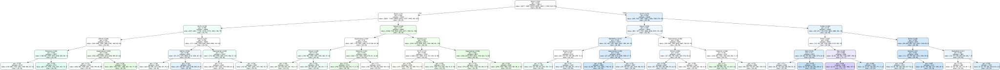

In [219]:
tree.export_graphviz(clf, out_file='age_classifier.dot',
                         feature_names=[i.replace('completed_', '') for i in completed_columns],
                         class_names=users_ages_completed['age_bin'].unique(),
                         filled=True, rounded=True,
                         special_characters=True)
dot_data = tree.export_graphviz(clf, out_file=None,
                         feature_names=[i.replace('completed_', '') for i in completed_columns],
                         class_names=users_ages_completed['age_bin'].unique(),
                         filled=True, rounded=True,
                         special_characters=True)
graph = graphviz.Source(dot_data)
graph

In [220]:
tree_to_table(clf, 'age')

age  \
Space <= 2.1% Game <= 3.0%    Sci-Fi <= 16.3%  School <= 24.5%       Romance <= 34.3%       (30, 40]   
                                                                     Romance > 34.3%        (30, 40]   
                                               School > 24.5%        Supernatural <= 25.3%  (30, 40]   
                                                                     Supernatural > 25.3%   (20, 23]   
                              Sci-Fi > 16.3%   School <= 21.1%       Mecha <= 4.8%          (30, 40]   
                                                                     Mecha > 4.8%           (23, 26]   
                                               School > 21.1%        Supernatural <= 24.5%  (23, 26]   
                                                                     Supernatural > 24.5%   (30, 40]   
              Game > 3.0%     School <= 24.9%  Supernatural <= 28.1% Shoujo <= 2.5%         (20, 23]   
                                                                     Shoujo > 2.5%          (30, 40]   
                                               Supernatural > 28.1%  Historical <= 4.7%     (20, 23]   
                                                                     Historical > 4.7%      (20, 23]   
                              School > 24.9%   Samurai <= 0.0%       Sci-Fi <= 14.1%        (17, 20]   
                                                                     Sci-Fi > 14.1%         (20, 23]   
                                               Samurai > 0.0%        Supernatural <= 26.4%  (20, 23]   
                                                                     Supernatural > 26.4%   (20, 23]   
Space > 2.1%  Sci-Fi <= 27.4% Game <= 2.8%     MartialArts <= 1.3%   Drama <= 39.1%         (30, 40]   
                                                                     Drama > 39.1%          (23, 26]   
                                               MartialArts > 1.3%    Supernatural <= 25.3%  (23, 26]   
                                                                     Supernatural > 25.3%   (23, 26]   
                              Game > 2.8%      Supernatural <= 25.6% School <= 29.3%        (23, 26]   
                                                                     School > 29.3%         (30, 40]   
                                               Supernatural > 25.6%  Historical <= 2.8%     (20, 23]   
                                                                     Historical > 2.8%      (30, 40]   
              Sci-Fi > 27.4%  Thriller <= 4.2% Police <= 2.7%        Kids <= 1.6%           (23, 26]   
                                                                     Kids > 1.6%            (23, 26]   
                                               Police > 2.7%         Kids <= 2.5%           (14, 17]   
                                                                     Kids > 2.5%            (23, 26]   
                              Thriller > 4.2%  Game <= 2.8%          Samurai <= 1.0%        (23, 26]   
                                                                     Samurai > 1.0%         (23, 26]   
                                               Game > 2.8%           MartialArts <= 1.1%    (30, 40]   
                                                                     MartialArts > 1.1%     (23, 26]   

                                                                                           precision  
Space <= 2.1% Game <= 3.0%    Sci-Fi <= 16.3%  School <= 24.5%       Romance <= 34.3%         30.96%  
                                                                     Romance > 34.3%          37.12%  
                                               School > 24.5%        Supernatural <= 25.3%    29.81%  
                                                                     Supernatural > 25.3%     36.26%  
                              Sci-Fi > 16.3%   School <= 21.1%       Mecha <= 4.8%            33.23%  
                                              

### genres in completed animests, compared with genres production

In [221]:
animes['genres'].fillna('', inplace=True)
genres_arr = animes['genres'].apply(lambda x: x.replace(' ', '').split(',')).apply(pd.Series).stack().to_frame(name='genre')
genres_arr = genres_arr[genres_arr['genre'] != '']
genres_arr.index.levels[0].name = 'anime_id'
animes_genres = pd.merge(animes, genres_arr, how='left', left_index=True, right_index=True)

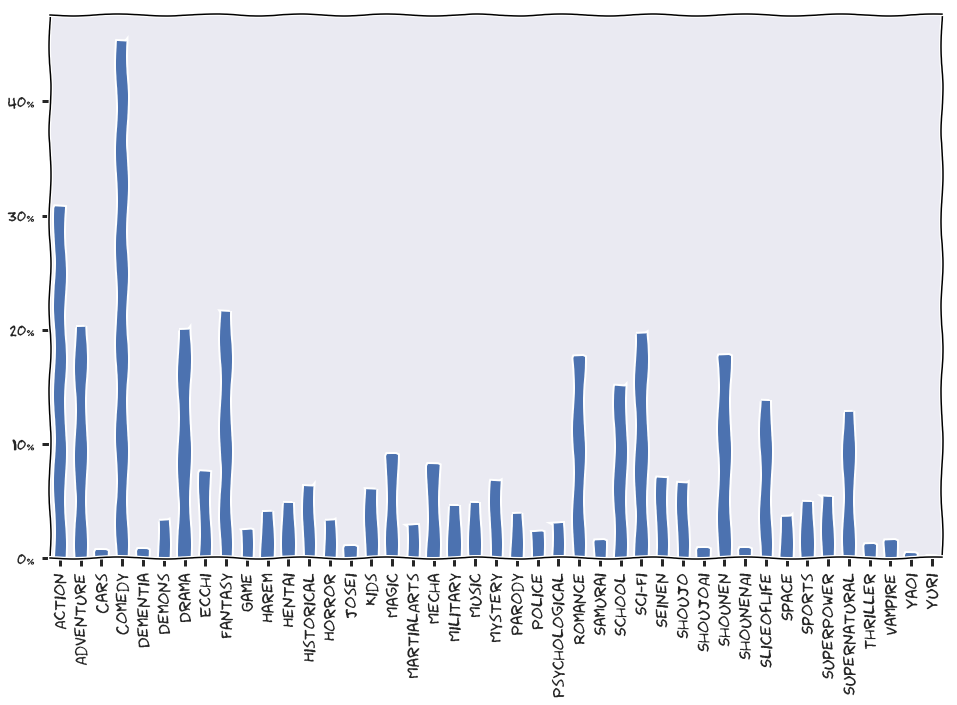

In [222]:
(animes_genres['genre'].value_counts() / animes.shape[0]).sort_index().plot(kind='bar', figsize=(16, 10))
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))

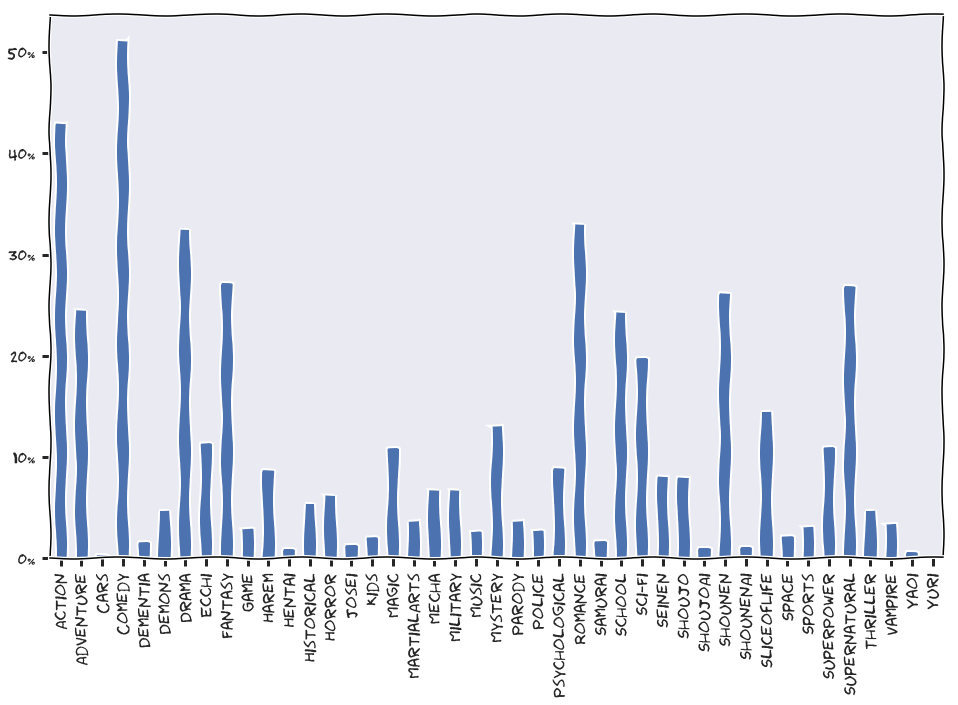

In [223]:
renaming = {x: x.replace('completed_', '') for x in completed_columns}
users[completed_columns].rename(columns=renaming).div(users['all_completed'], axis=0).mean().sort_index().plot(kind='bar', figsize=(16, 10))
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))

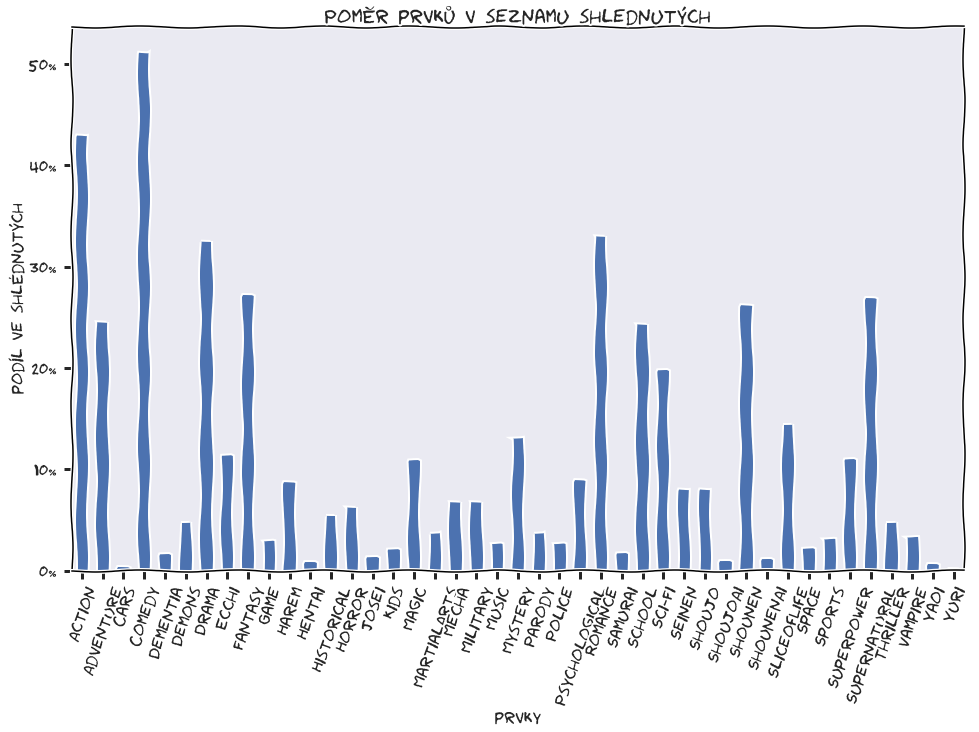

In [224]:
renaming = {x: x.replace('completed_', '') for x in completed_columns}
users[completed_columns].rename(columns=renaming).div(users['all_completed'], axis=0).mean().sort_index().plot(kind='bar', figsize=(16, 10))
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
plt.title('Poměr prvků v seznamu shlednutých')
plt.xticks(rotation=70)
plt.ylabel('podíl ve shlédnutých')
plt.xlabel('prvky')
plt.savefig('graphs/uzivatele-shlednute-genres.png', bbox_inches="tight")

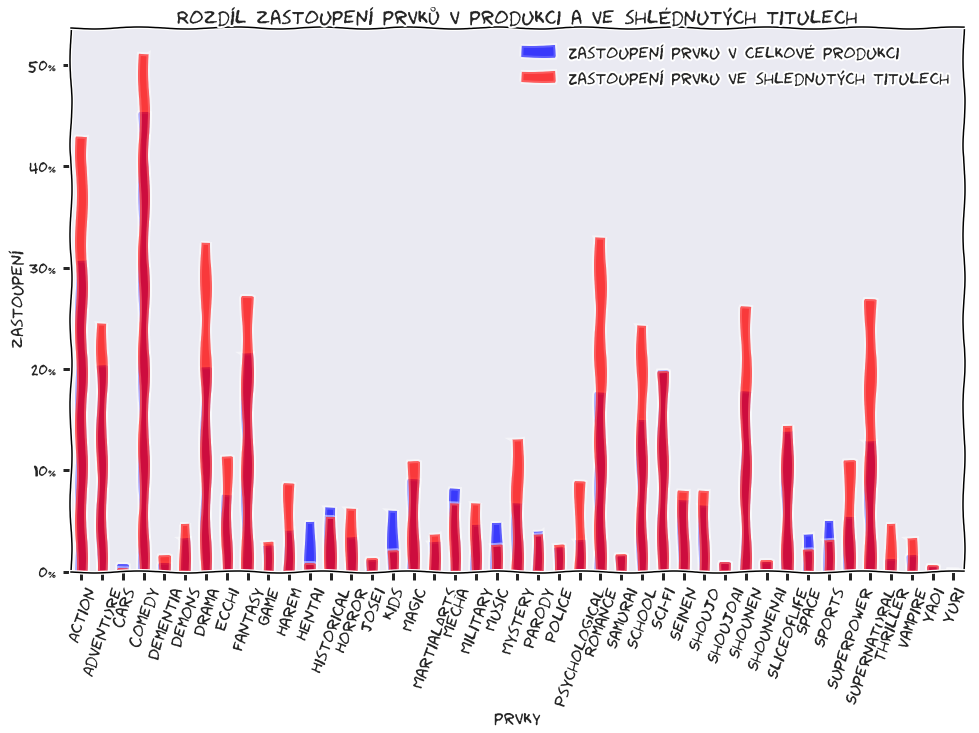

In [225]:
renaming = {x: x.replace('completed_', '') for x in completed_columns}
anime_genres_percent = (animes_genres['genre'].value_counts() / animes.shape[0]).sort_index()
anime_genres_percent.plot(kind='bar', figsize=(16, 10), title='Rozdíl zastoupení prvků v produkci a ve shlédnutých titulech', color='blue', alpha=0.5, label='Zastoupení prvku v celkové produkci')
users_genres_percent = users[completed_columns].rename(columns=renaming).div(users['all_completed'], axis=0).mean().sort_index()
users_genres_percent.plot(kind='bar', color='red', alpha=0.5, label='Zastoupení prvku ve shlednutých titulech')
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
plt.legend(loc=1)
plt.xticks(rotation=70)
plt.ylabel('zastoupení')
plt.xlabel('prvky')
plt.savefig('graphs/uzivatele-shlednute-genres-comparison.png', bbox_inches="tight")

In [226]:
# using new classes for users, both gender and age bin will be class, will try whether decision trees will have bigger success
users_ages_genders_completed = users_ages_completed.join(users_genders_completed['gender'])
users_ages_genders_completed['age_and_gender'] = users_ages_genders_completed['age_bin'] + ', ' + users_ages_genders_completed['gender']

In [227]:
clf = tree.DecisionTreeClassifier(max_depth=2)
clf = clf.fit(users_ages_genders_completed[completed_columns], users_ages_genders_completed['age_and_gender'])
y_true = users_ages_genders_completed['age_and_gender']
y_pred = clf.predict(users_ages_genders_completed[completed_columns])
target_names = users_ages_genders_completed['age_and_gender'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))
tree_to_table(clf, 'gender and age')

                      precision    recall  f1-score   support

    (26, 30], Female       0.00      0.00      0.00      1098
      (26, 30], Male       0.00      0.00      0.00      1927
    (17, 20], Female       0.00      0.00      0.00        52
      (17, 20], Male       0.00      0.00      0.00      4337
    (20, 23], Female       0.00      0.00      0.00      8624
      (30, 40], Male       0.00      0.00      0.00       136
      (20, 23], Male       0.27      0.49      0.35      9499
    (23, 26], Female       0.23      0.67      0.35     15471
      (23, 26], Male       0.00      0.00      0.00       135
    (30, 40], Female       0.00      0.00      0.00     10772
    (14, 17], Female       0.00      0.00      0.00     17513
      (14, 17], Male       0.00      0.00      0.00        85
      (40, 50], Male       0.27      0.50      0.35      8233
       (9, 14], Male       0.32      0.55      0.40     18322
(26, 30], Non-Binary       0.00      0.00      0.00        62
(17, 20

/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


gender and age precision
Shoujo <= 8.1% Mecha <= 6.7%    (23, 26], Female    23.26%
               Mecha > 6.7%        (9, 14], Male    31.59%
Shoujo > 8.1%  School <= 21.9%    (40, 50], Male    27.40%
               School > 21.9%     (20, 23], Male    27.22%

In [228]:
clf = tree.DecisionTreeClassifier(max_depth=3)
clf = clf.fit(users_ages_genders_completed[completed_columns], users_ages_genders_completed['age_and_gender'])
y_true = users_ages_genders_completed['age_and_gender']
y_pred = clf.predict(users_ages_genders_completed[completed_columns])
target_names = users_ages_genders_completed['age_and_gender'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))
tree_to_table(clf, 'gender and age')

                      precision    recall  f1-score   support

    (26, 30], Female       0.00      0.00      0.00      1098
      (26, 30], Male       0.00      0.00      0.00      1927
    (17, 20], Female       0.00      0.00      0.00        52
      (17, 20], Male       0.00      0.00      0.00      4337
    (20, 23], Female       0.00      0.00      0.00      8624
      (30, 40], Male       0.00      0.00      0.00       136
      (20, 23], Male       0.27      0.49      0.35      9499
    (23, 26], Female       0.28      0.44      0.34     15471
      (23, 26], Male       0.00      0.00      0.00       135
    (30, 40], Female       0.31      0.28      0.30     10772
    (14, 17], Female       0.22      0.26      0.24     17513
      (14, 17], Male       0.00      0.00      0.00        85
      (40, 50], Male       0.33      0.22      0.26      8233
       (9, 14], Male       0.32      0.55      0.40     18322
(26, 30], Non-Binary       0.00      0.00      0.00        62
(17, 20

/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


gender and age precision
Shoujo <= 8.1% Mecha <= 6.7%   Game <= 2.8%     (14, 17], Female    22.30%
                               Game > 2.8%      (23, 26], Female    28.18%
               Mecha > 6.7%    Space <= 3.2%       (9, 14], Male    27.11%
                               Space > 3.2%        (9, 14], Male    36.09%
Shoujo > 8.1%  School <= 21.9% Space <= 1.7%    (30, 40], Female    31.49%
                               Space > 1.7%       (40, 50], Male    33.06%
               School > 21.9%  Shoujo <= 11.9%    (20, 23], Male    19.69%
                               Shoujo > 11.9%     (20, 23], Male    30.02%

In [229]:
clf = tree.DecisionTreeClassifier(max_depth=4)
clf = clf.fit(users_ages_genders_completed[completed_columns], users_ages_genders_completed['age_and_gender'])
y_true = users_ages_genders_completed['age_and_gender']
y_pred = clf.predict(users_ages_genders_completed[completed_columns])
target_names = users_ages_genders_completed['age_and_gender'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))
tree_to_table(clf, 'gender and age')

                      precision    recall  f1-score   support

    (26, 30], Female       0.00      0.00      0.00      1098
      (26, 30], Male       0.00      0.00      0.00      1927
    (17, 20], Female       0.00      0.00      0.00        52
      (17, 20], Male       0.00      0.00      0.00      4337
    (20, 23], Female       0.00      0.00      0.00      8624
      (30, 40], Male       0.00      0.00      0.00       136
      (20, 23], Male       0.27      0.33      0.30      9499
    (23, 26], Female       0.28      0.53      0.37     15471
      (23, 26], Male       0.00      0.00      0.00       135
    (30, 40], Female       0.31      0.40      0.34     10772
    (14, 17], Female       0.24      0.25      0.24     17513
      (14, 17], Male       0.00      0.00      0.00        85
      (40, 50], Male       0.32      0.32      0.32      8233
       (9, 14], Male       0.34      0.49      0.40     18322
(26, 30], Non-Binary       0.00      0.00      0.00        62
(17, 20

/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


gender and age  \
Shoujo <= 8.1% Mecha <= 6.7%   Game <= 2.8%    ShounenAi <= 1.1%   (14, 17], Female   
                                               ShounenAi > 1.1%    (30, 40], Female   
                               Game > 2.8%     Historical <= 2.2%  (23, 26], Female   
                                               Historical > 2.2%   (23, 26], Female   
               Mecha > 6.7%    Space <= 3.2%   Game <= 3.2%           (9, 14], Male   
                                               Game > 3.2%         (23, 26], Female   
                               Space > 3.2%    Game <= 2.7%           (9, 14], Male   
                                               Game > 2.7%            (9, 14], Male   
Shoujo > 8.1%  School <= 21.9% Space <= 1.7%   Sci-Fi <= 17.3%     (30, 40], Female   
                                               Sci-Fi > 17.3%        (40, 50], Male   
                               Space > 1.7%    Sci-Fi <= 25.5%       (40, 50], Male   
                                               Sci-Fi > 25.5%        (40, 50], Male   
               School > 21.9%  Shoujo <= 11.9% ShounenAi <= 0.6%     (20, 23], Male   
                                               ShounenAi > 0.6%      (20, 23], Male   
                               Shoujo > 11.9%  Drama <= 37.9%        (20, 23], Male   
                                               Drama > 37.9%       (30, 40], Female   

                                                                  precision  
Shoujo <= 8.1% Mecha <= 6.7%   Game <= 2.8%    ShounenAi <= 1.1%     23.72%  
                                               ShounenAi > 1.1%      23.41%  
                               Game > 2.8%     Historical <= 2.2%    29.73%  
                                               Historical > 2.2%     27.23%  
               Mecha > 6.7%    Space <= 3.2%   Game <= 3.2%          31.29%  
                                               Game > 3.2%           25.75%  
                               Space > 3.2%    Game <= 2.7%          37.78%  
                                               Game > 2.7%           32.84%  
Shoujo > 8.1%  School <= 21.9% Space <= 1.7%   Sci-Fi <= 17.3%       33.18%  
                                               Sci-Fi > 17.3%        29.09%  
                               Space > 1.7%    Sci-Fi <= 25.5%       36.12%  
                                               Sci-Fi > 25.5%        28.26%  
               School > 21.9%  Shoujo <= 11.9% ShounenAi <= 0.6%     14.12%  
                                               ShounenAi > 0.6%      28.30%  
                               Shoujo > 11.9%  Drama <= 37.9%        32.20%  
                                               Drama > 37.9%         29.60%

In [230]:
clf = tree.DecisionTreeClassifier(max_depth=5)
clf = clf.fit(users_ages_genders_completed[completed_columns], users_ages_genders_completed['age_and_gender'])
y_true = users_ages_genders_completed['age_and_gender']
y_pred = clf.predict(users_ages_genders_completed[completed_columns])
target_names = users_ages_genders_completed['age_and_gender'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))
tree_to_table(clf, 'gender and age')

                      precision    recall  f1-score   support

    (26, 30], Female       0.00      0.00      0.00      1098
      (26, 30], Male       0.00      0.00      0.00      1927
    (17, 20], Female       0.00      0.00      0.00        52
      (17, 20], Male       0.00      0.00      0.00      4337
    (20, 23], Female       0.30      0.12      0.17      8624
      (30, 40], Male       0.00      0.00      0.00       136
      (20, 23], Male       0.29      0.44      0.35      9499
    (23, 26], Female       0.29      0.41      0.34     15471
      (23, 26], Male       0.00      0.00      0.00       135
    (30, 40], Female       0.31      0.35      0.33     10772
    (14, 17], Female       0.24      0.36      0.29     17513
      (14, 17], Male       0.00      0.00      0.00        85
      (40, 50], Male       0.34      0.28      0.31      8233
       (9, 14], Male       0.36      0.46      0.40     18322
(26, 30], Non-Binary       0.00      0.00      0.00        62
(17, 20

/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


gender and age  \
Shoujo <= 8.1% Mecha <= 6.7%   Game <= 2.8%    ShounenAi <= 1.1%  MartialArts <= 0.5%  (14, 17], Female   
                                                                  MartialArts > 0.5%   (14, 17], Female   
                                               ShounenAi > 1.1%   Sci-Fi <= 15.7%        (20, 23], Male   
                                                                  Sci-Fi > 15.7%       (30, 40], Female   
                               Game > 2.8%     Historical <= 2.2% Sci-Fi <= 13.0%      (20, 23], Female   
                                                                  Sci-Fi > 13.0%       (23, 26], Female   
                                               Historical > 2.2%  ShounenAi <= 0.7%    (23, 26], Female   
                                                                  ShounenAi > 0.7%       (20, 23], Male   
               Mecha > 6.7%    Space <= 3.2%   Game <= 3.2%       MartialArts <= 1.4%  (14, 17], Female   
                                                                  MartialArts > 1.4%      (9, 14], Male   
                                               Game > 3.2%        Samurai <= 0.2%      (23, 26], Female   
                                                                  Samurai > 0.2%       (14, 17], Female   
                               Space > 3.2%    Game <= 2.7%       Police <= 1.9%          (9, 14], Male   
                                                                  Police > 1.9%           (9, 14], Male   
                                               Game > 2.7%        Sci-Fi <= 31.7%         (9, 14], Male   
                                                                  Sci-Fi > 31.7%          (9, 14], Male   
Shoujo > 8.1%  School <= 21.9% Space <= 1.7%   Sci-Fi <= 17.3%    Drama <= 35.6%       (30, 40], Female   
                                                                  Drama > 35.6%        (30, 40], Female   
                                               Sci-Fi > 17.3%     ShounenAi <= 0.4%    (30, 40], Female   
                                                                  ShounenAi > 0.4%       (40, 50], Male   
                               Space > 1.7%    Sci-Fi <= 25.5%    School <= 14.5%        (40, 50], Male   
                                                                  School > 14.5%         (40, 50], Male   
                                               Sci-Fi > 25.5%     ShounenAi <= 0.9%      (40, 50], Male   
                                                                  ShounenAi > 0.9%       (40, 50], Male   
               School > 21.9%  Shoujo <= 11.9% ShounenAi <= 0.6%  Romance <= 40.4%       (20, 23], Male   
                                                                  Romance > 40.4%      (14, 17], Female   
                                               ShounenAi > 0.6%   Sci-Fi <= 14.1%        (20, 23], Male   
                                                                  Sci-Fi > 14.1%         (20, 23], Male   
                               Shoujo > 11.9%  Drama <= 37.9%     School <= 27.5%        (20, 23], Male   
                                                                  School > 27.5%         (20, 23], Male   
                                               Drama > 37.9%      School <= 31.8%      (30, 40], Female   
                                                                  School > 31.8%         (20, 23], Male   

                                                                                      precision  
Shoujo <= 8.1% Mecha <= 6.7%   Game <= 2.8%    ShounenAi <= 1.1%  MartialArts <= 0.5%    17.13%  
                                                                  MartialArts > 0.5%     26.51%  
                                               ShounenAi > 1.1%   Sci-Fi <= 15.7%        27.55%  
                                                                  Sci-Fi > 15.7%         25.06%  
                               Game > 2.8%     Historical <= 2.2% S

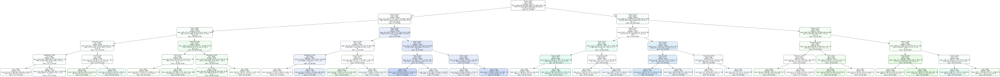

In [231]:
dot_data = tree.export_graphviz(clf, out_file=None,
                         feature_names=[i.replace('completed_', '') for i in completed_columns],
                         class_names=users_ages_genders_completed['age_and_gender'].unique(),
                         filled=True, rounded=True,
                         special_characters=True)
graph = graphviz.Source(dot_data)
graph

In [232]:
clf = tree.DecisionTreeClassifier(max_depth=6)
clf = clf.fit(users_ages_genders_completed[completed_columns], users_ages_genders_completed['age_and_gender'])
y_true = users_ages_genders_completed['age_and_gender']
y_pred = clf.predict(users_ages_genders_completed[completed_columns])
target_names = users_ages_genders_completed['age_and_gender'].unique()
print(classification_report(y_true, y_pred, target_names=target_names))
tree_to_table(clf, 'gender and age')

                      precision    recall  f1-score   support

    (26, 30], Female       0.00      0.00      0.00      1098
      (26, 30], Male       0.00      0.00      0.00      1927
    (17, 20], Female       0.00      0.00      0.00        52
      (17, 20], Male       0.28      0.03      0.05      4337
    (20, 23], Female       0.32      0.10      0.15      8624
      (30, 40], Male       0.00      0.00      0.00       136
      (20, 23], Male       0.31      0.35      0.33      9499
    (23, 26], Female       0.28      0.51      0.36     15471
      (23, 26], Male       0.00      0.00      0.00       135
    (30, 40], Female       0.28      0.48      0.36     10772
    (14, 17], Female       0.28      0.17      0.21     17513
      (14, 17], Male       0.00      0.00      0.00        85
      (40, 50], Male       0.36      0.25      0.29      8233
       (9, 14], Male       0.34      0.52      0.41     18322
(26, 30], Non-Binary       0.00      0.00      0.00        62
(17, 20

/home.others/eb/easybuild/software/scikit-learn/0.19.1-foss-2018a-Python-3.6.4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


gender and age  \
Shoujo <= 8.1% Mecha <= 6.7%   Game <= 2.8%    ShounenAi <= 1.1%  MartialArts <= 0.5% Harem <= 3.6%              (30, 40], Female   
                                                                                      Harem > 3.6%               (23, 26], Female   
                                                                  MartialArts > 0.5%  School <= 29.5%               (9, 14], Male   
                                                                                      School > 29.5%             (14, 17], Female   
                                               ShounenAi > 1.1%   Sci-Fi <= 15.7%     Harem <= 12.3%               (20, 23], Male   
                                                                                      Harem > 12.3%              (14, 17], Female   
                                                                  Sci-Fi > 15.7%      Josei <= 1.4%              (30, 40], Female   
                                                                                      Josei > 1.4%               (30, 40], Female   
                               Game > 2.8%     Historical <= 2.2% Sci-Fi <= 13.0%     Parody <= 0.7%             (23, 26], Female   
                                                                                      Parody > 0.7%              (20, 23], Female   
                                                                  Sci-Fi > 13.0%      Supernatural <= 24.2%      (23, 26], Female   
                                                                                      Supernatural > 24.2%       (23, 26], Female   
                                               Historical > 2.2%  ShounenAi <= 0.7%   Supernatural <= 26.4%      (23, 26], Female   
                                                                                      Supernatural > 26.4%       (23, 26], Female   
                                                                  ShounenAi > 0.7%    ShounenAi <= 2.0%          (23, 26], Female   
                                                                                      ShounenAi > 2.0%             (20, 23], Male   
               Mecha > 6.7%    Space <= 3.2%   Game <= 3.2%       MartialArts <= 1.4% Game <= 1.5%                  (9, 14], Male   
                                                                                      Game > 1.5%                (14, 17], Female   
                                                                  MartialArts > 1.4%  School <= 28.0%               (9, 14], Male   
                                                                                      School > 28.0%             (14, 17], Female   
                                               Game > 3.2%        Samurai <= 0.2%     School <= 24.1%            (23, 26], Female   
                                                                                      School > 24.1%             (23, 26], Female   
                                                                  Samurai > 0.2%      Supernatural <= 26.0%         (9, 14], Male   
                                                                                      Supernatural > 26.0%       (23, 26], Female   
                               Space > 3.2%    Game <= 2.7%       Police <= 1.9%      MartialArts <= 2.4%           (9, 14], Male   
                                                                                      MartialArts > 2.4%            (9, 14], Male   
                                                                  Police > 1.9%       Thriller <= 3.9%       (23, 26], Non-Binary   
                                                                                      Thriller > 3.9%               (9, 14], Male   
                                               Game > 2.7%        Sci-Fi <= 31.7%     ShoujoAi <= 0.2%           (14, 17], Female   
                                                                                      ShoujoAi > 0.2%               (9, 14], 

### nothing interesting in decision trees above, gender does not bring precision into age prediction
### going to measure genre distances by users animelists

<IPython.core.display.Javascript object>


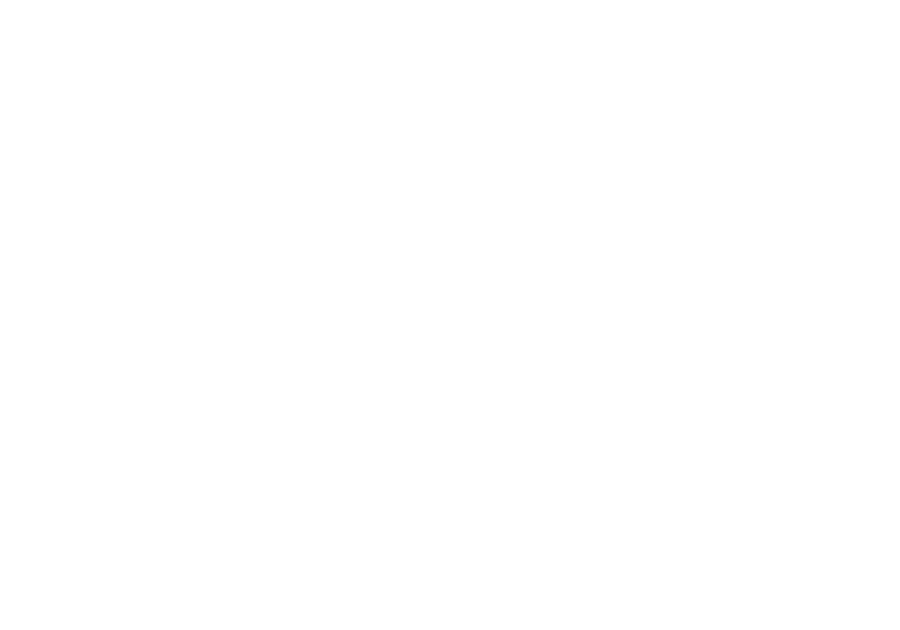

Text(0.5,0.92,'users by genres in 3D')

<IPython.core.display.Javascript object>


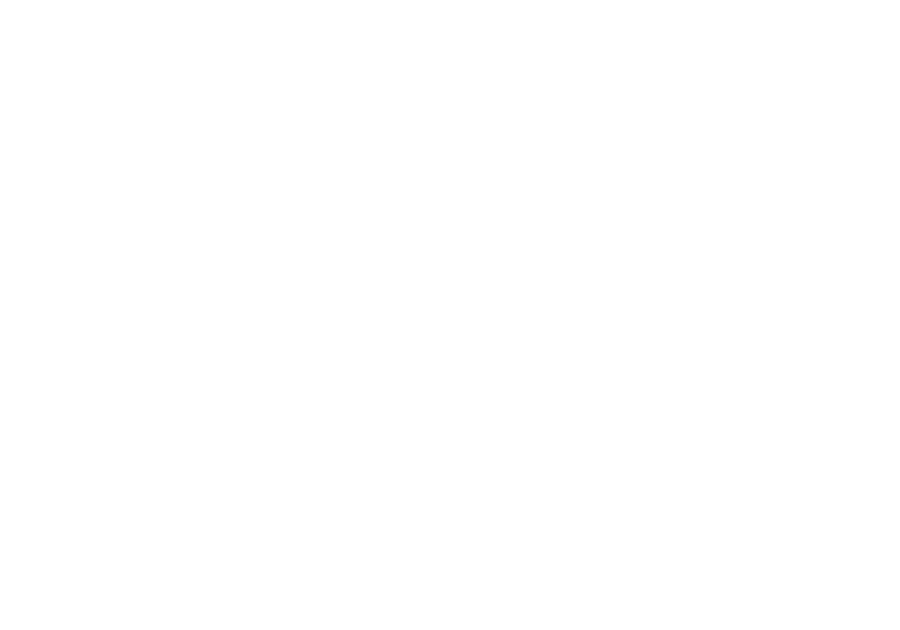

In [233]:
%matplotlib notebook
# doing PCA on genres distribution
from sklearn import decomposition
from sklearn import preprocessing

pca = decomposition.PCA(n_components=3)
embeddings = pca.fit_transform(users_ages_genders_completed[completed_columns])

plt.figure(figsize=(10, 7))

# colors per gender
ax = plt.axes(projection='3d')
le = preprocessing.LabelEncoder()
genders = le.fit_transform(users_ages_genders_completed['gender'])
genders = genders.astype(np.int)
colors = plt.cm.Set1(np.unique(genders))
ax.scatter3D(embeddings[:, 0], embeddings[:, 1], embeddings[:, 2], s=1, c=[colors[x] for x in genders])
plt.title("users by genres in 3D")

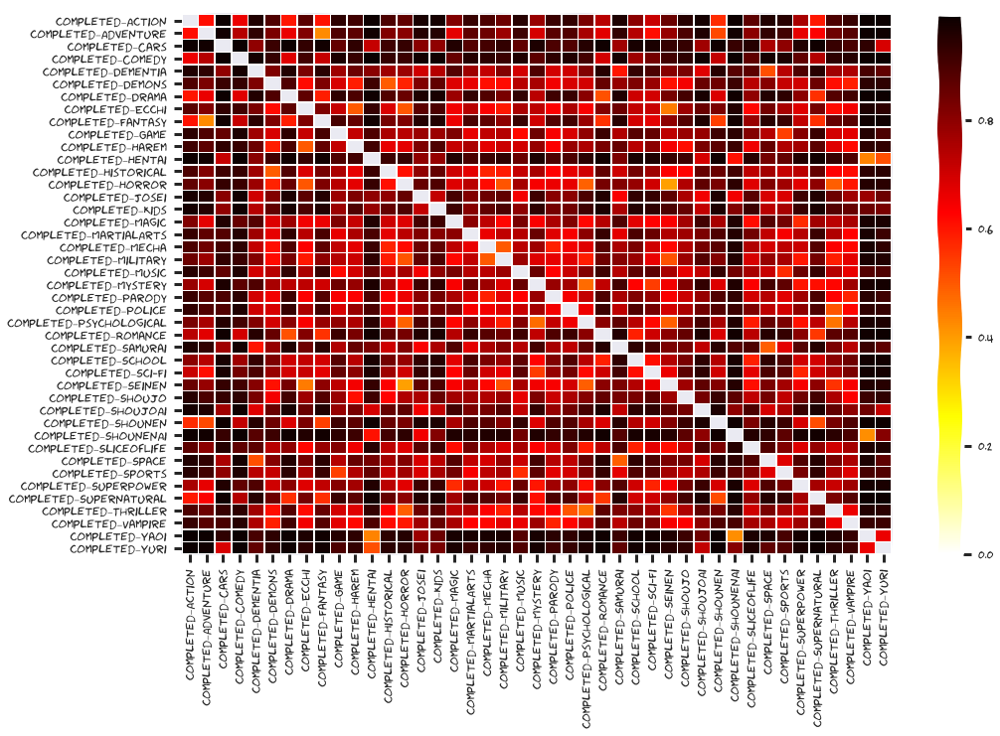

In [234]:
def nsd(x, y):
    return (max(np.log(x.sum()), np.log(y.sum())) - np.log((x & y).sum())) / (np.log(x.size) - min(np.log(x.sum()), np.log(y.sum())))

# todo: vymyslet co s tím, když je to spojité a ne binární
%matplotlib inline

renaming = {x: x.replace('completed_', '') for x in completed_columns}
dists = pdist(users_completed[completed_columns].rename(columns=renaming).T > 0, lambda x, y: nsd(x, y))
dists_m = squareform(dists)
dists_m[dists_m == np.inf] = 0  # infinities mess color scale

dists_df = pd.DataFrame(dists_m)
dists_df.columns = users_completed.T.index
dists_df.index = users_completed.T.index

f, ax = plt.subplots(figsize=(16, 10))
mask = np.zeros_like(dists_df, dtype=np.bool)
mask[dists_df == 0] = True
sns.heatmap(dists_df, mask=mask, linewidths=.5, cmap=plt.cm.hot_r)

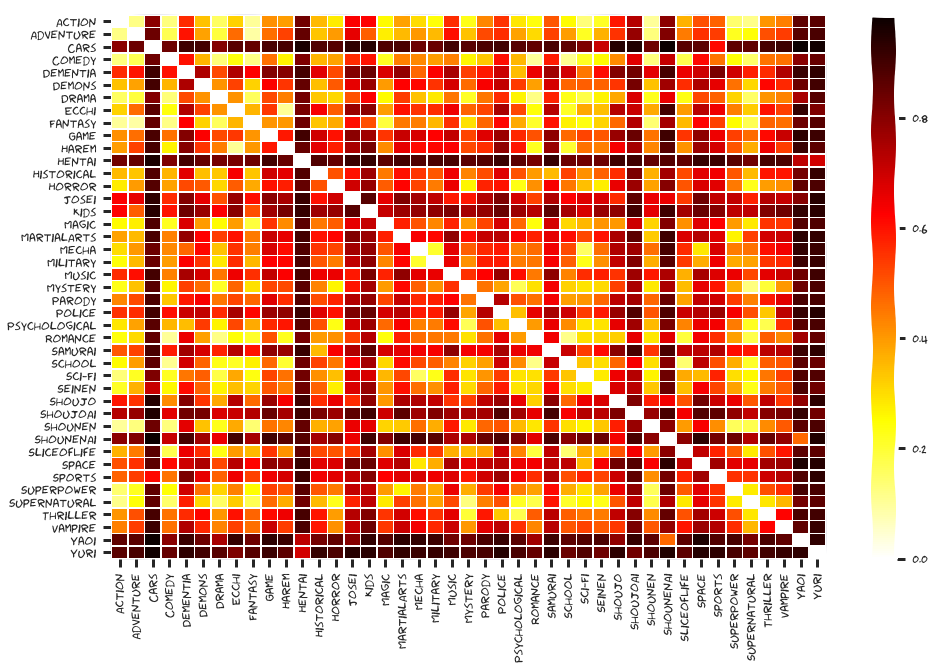

In [235]:
%matplotlib inline

renaming = {x: x.replace('completed_', '') for x in completed_columns}
genres_users = users_completed[completed_columns].rename(columns=renaming).T
dists = pdist(genres_users, 'cosine')
dists_m = squareform(dists)
dists_df = pd.DataFrame(dists_m)
dists_df.columns = genres_users.index
dists_df.index = genres_users.index

f, ax = plt.subplots(figsize=(16, 10))
sns.heatmap(dists_df, linewidths=.5, cmap=plt.cm.hot_r)

12

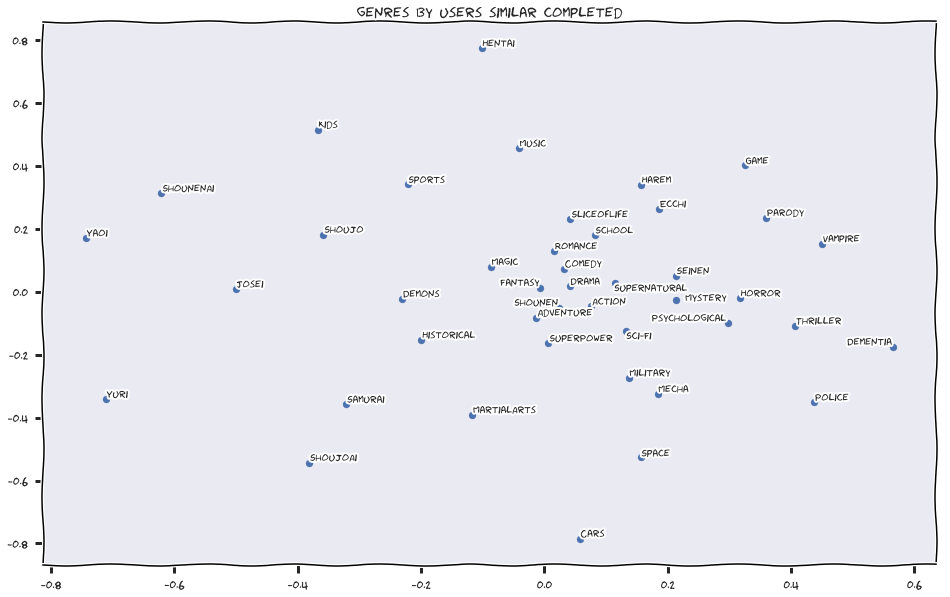

In [236]:
embedder = manifold.MDS(2, max_iter=2000, n_init=5, dissimilarity='precomputed')
embeddings = embedder.fit_transform(dists_m)
# need to agregate animes_studios because it does not contain duplicities because of genres
plt.figure(figsize=(16, 10))
plt.scatter(embeddings[:, 0], embeddings[:, 1])
plt.title("genres by users similar completed")
texts = [plt.text(embeddings[i, 0], embeddings[i, 1], txt) for i, txt in enumerate(dists_df.index)]
adjust_text(texts)

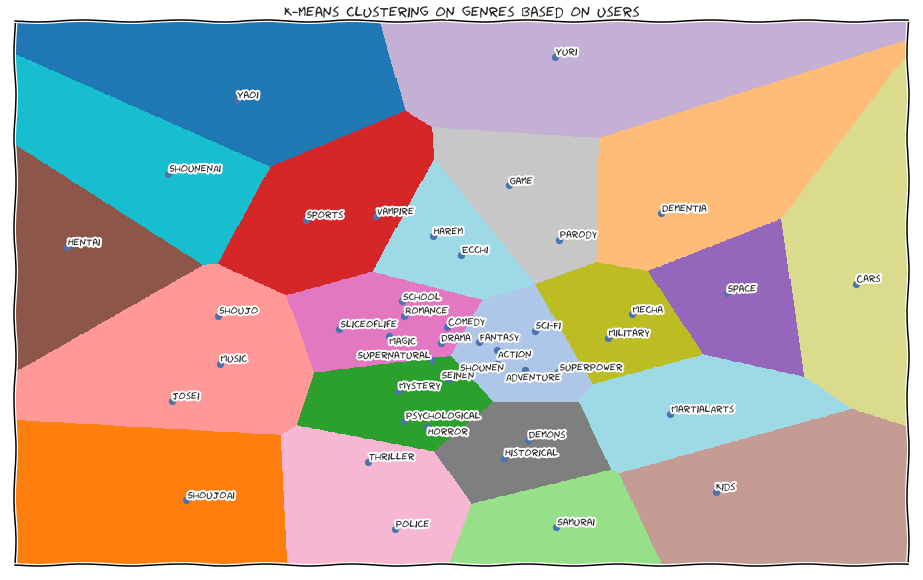

In [237]:
from sklearn.cluster import KMeans

embedder = manifold.MDS(2, max_iter=2000, n_init=5, dissimilarity='precomputed')
embeddings = embedder.fit_transform(dists_m)

kmeans = KMeans(init='k-means++', n_clusters=21, n_init=10)
kmeans.fit(embeddings)

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = .002     # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = embeddings[:, 0].min() - 0.1, embeddings[:, 0].max() + 0.1
y_min, y_max = embeddings[:, 1].min() - 0.1, embeddings[:, 1].max() + 0.1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(figsize=(16, 10))
plt.clf()
plt.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.tab20,
           aspect='auto', origin='lower')

plt.scatter(embeddings[:, 0], embeddings[:, 1])
#plt.plot(embeddings[:, 0], embeddings[:, 1], 'k.', markersize=2)
# Plot the centroids as a white X
plt.title('K-means clustering on genres based on users')

texts = [plt.text(embeddings[i, 0], embeddings[i, 1], txt) for i, txt in enumerate(dists_df.index)]
adjust_text(texts)

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()

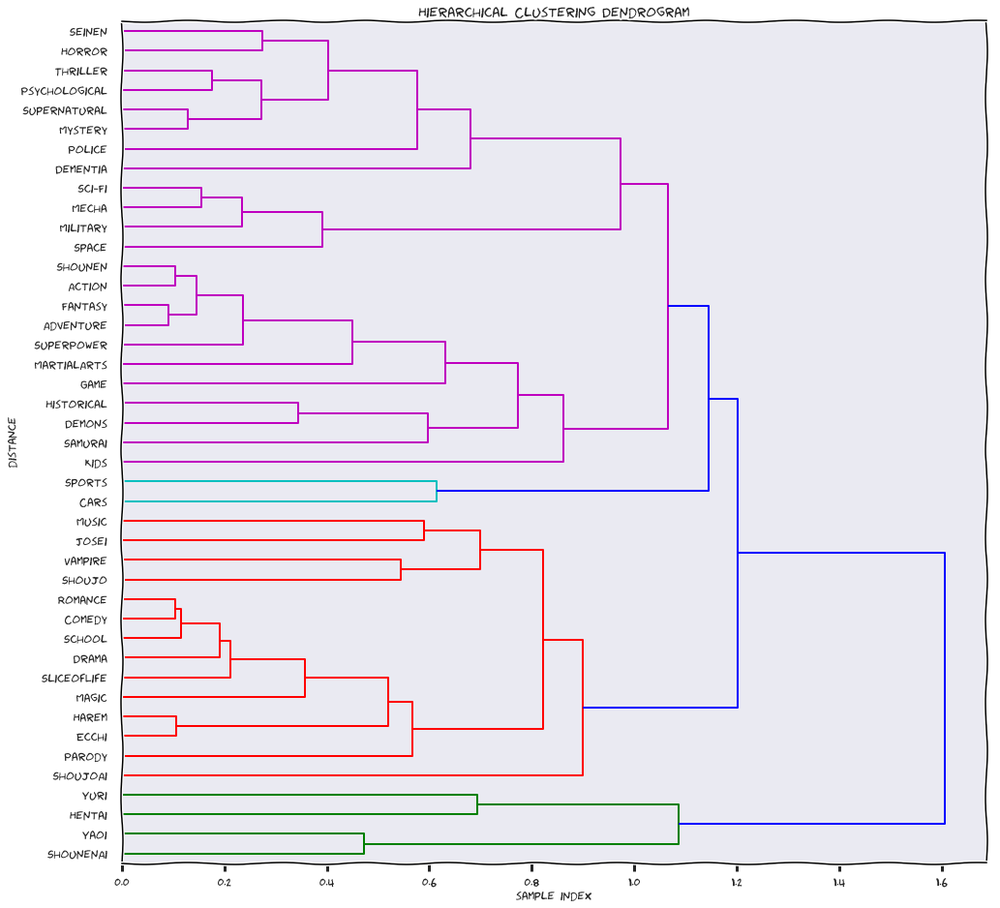

In [238]:
from scipy.cluster.hierarchy import dendrogram, linkage

# generate the linkage matrix 
# squareform transfers between condensed and redundant distance form
Z = linkage(squareform(dists_m), 'ward')

# calculate full dendrogram
plt.figure(figsize=(16, 16))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    Z,
#    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=12.,  # font size for the x axis labels
    orientation='right',
    labels=dists_df.index
)
plt.show()

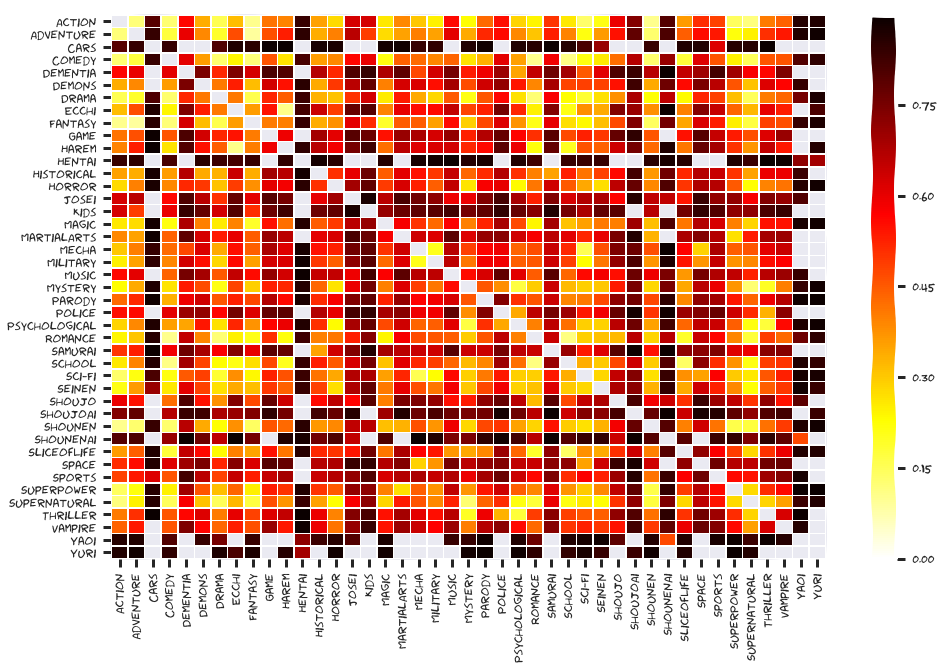

In [239]:
# now with thresholding, more than 0.9 dissimilarity is undefined
f, ax = plt.subplots(figsize=(16, 10))
dists = pdist(genres_users, 'cosine')
dists_m = squareform(dists)
dists_m[dists_m > 0.9] = 0
dists_df = pd.DataFrame(dists_m)
dists_df.columns = genres_users.index
dists_df.index = genres_users.index

mask = np.zeros_like(dists_df, dtype=np.bool)
mask[dists_df == 0] = True

sns.heatmap(dists_df, mask=mask, linewidths=.5, cmap=plt.cm.hot_r)

In [240]:
def init(sizes):
    def my_init():
        ax.scatter3D(embeddings[:, 0], embeddings[:, 1], embeddings[:, 2], s=sizes)
        return fig,
    return my_init

def animate(i):
    ax.azim = ax.azim - 2
    ax.view_init(ax.elev, ax.azim)
    return fig,

def points_3d_to_gif(embeddings, labels, gif_filename, ax, sizes):
    for i, txt in enumerate(labels):
        ax.text(embeddings[i, 0], embeddings[i, 1], embeddings[i, 2], txt)

    #plt.axis('off')
    #ax.grid(False)
    ax.grid(True)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])

    ax.elev = 25.
    ax.azim = 321.
    ax.dist = 11.

    # Animate, interval in ms, frames == # of frames in animation
    anim = animation.FuncAnimation(fig, animate, init_func=init(sizes),
                                   frames=180, interval=80, blit=True)
    # Save
    anim.save('images/{}.gif'.format(gif_filename), dpi=80, writer='imagemagick')


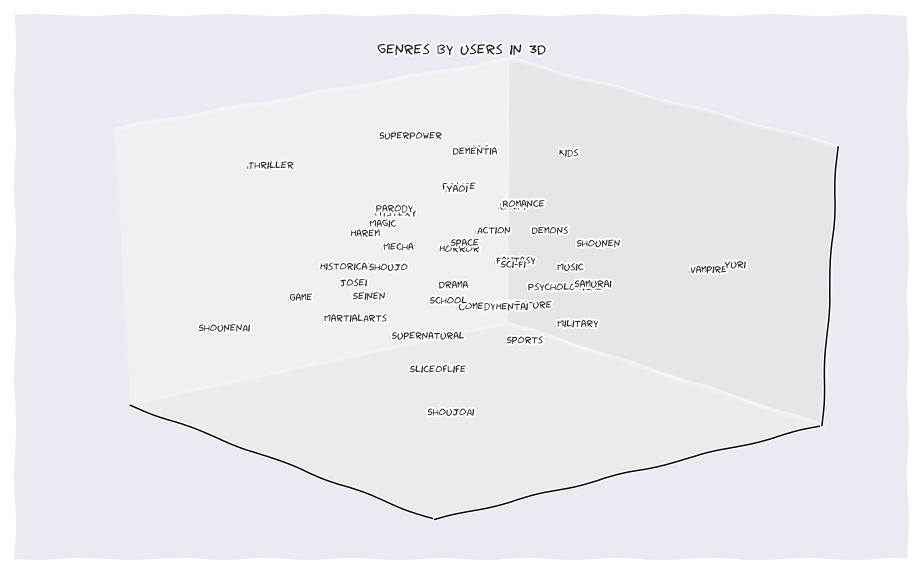

In [241]:
dists = pdist(genres_users, 'cosine')
dists_m = squareform(dists)
dists_m[dists_m > 0.9] = 0  # I need to set infinities to zeros, then it handles infinities as missing data, which is wanted
embedder = manifold.MDS(3, metric=False, max_iter=2000, n_init=10, dissimilarity='precomputed')
embeddings = embedder.fit_transform(dists_m)

fig = plt.figure(figsize=(16, 10))
ax = plt.axes(projection='3d')

plt.title("genres by users in 3D")
points_3d_to_gif(embeddings, genres_users.index, 'genres_users-cosine-MSD', ax, genres_users.sum(axis=1).apply(np.log))

In [242]:
pairs = np.array(list(combinations(genres_users.index, 2)))

# for gephi, higher edge cost means higher similarity
edges = pd.DataFrame({'source': pairs[:, 0], 'target': pairs[:, 1], 'weight': 1-dists})
edges = edges[edges['weight'] != np.inf]

nodes = pd.DataFrame({'id': genres_users.index, 'label': genres_users.index})
edges['type'] = 'undirected'

nodes.to_csv('genres_users_nodes.csv', index=False, sep=',', encoding='utf-8')
edges.to_csv('genres_users_edges_cosine.csv', index=False, sep=',', encoding='utf-8')

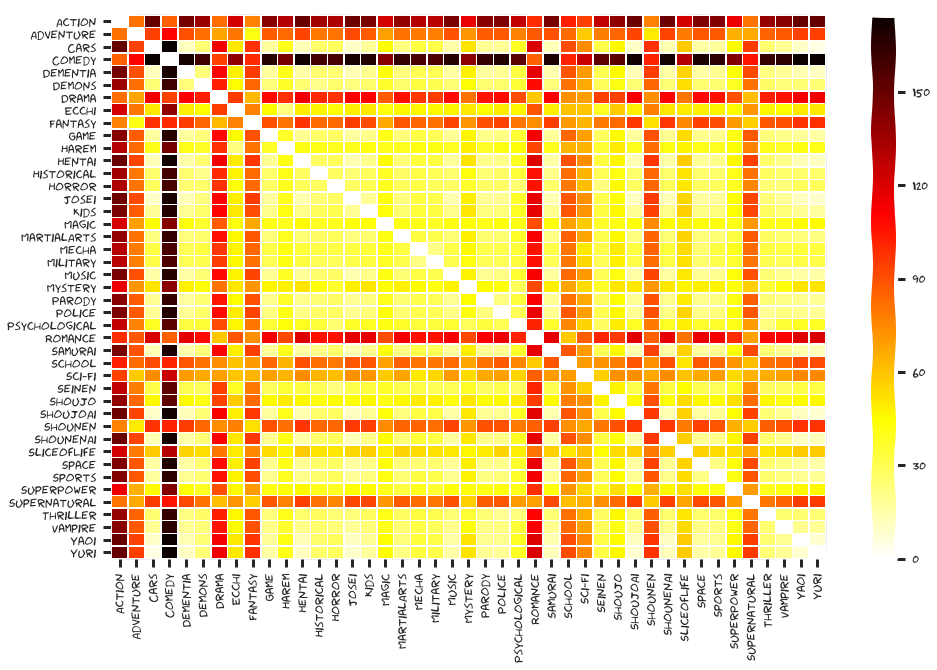

In [243]:
renaming = {x: x.replace('completed_', '') for x in completed_columns}
genres_users = users_completed[completed_columns].rename(columns=renaming).T
dists = pdist(genres_users, 'euclidean')
dists_m = squareform(dists)
dists_df = pd.DataFrame(dists_m)
dists_df.columns = genres_users.index
dists_df.index = genres_users.index

f, ax = plt.subplots(figsize=(16, 10))
sns.heatmap(dists_df, linewidths=.5, cmap=plt.cm.hot_r)

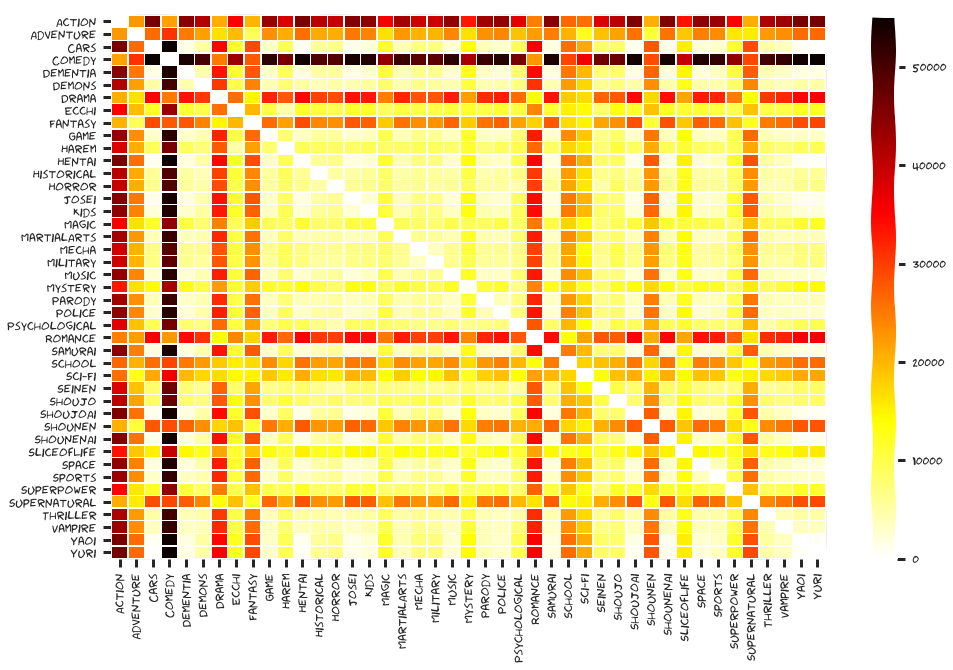

In [244]:
renaming = {x: x.replace('completed_', '') for x in completed_columns}
genres_users = users_completed[completed_columns].rename(columns=renaming).T
dists = pdist(genres_users, 'cityblock')
dists_m = squareform(dists)
dists_df = pd.DataFrame(dists_m)
dists_df.columns = genres_users.index
dists_df.index = genres_users.index

f, ax = plt.subplots(figsize=(16, 10))
sns.heatmap(dists_df, linewidths=.5, cmap=plt.cm.hot_r)

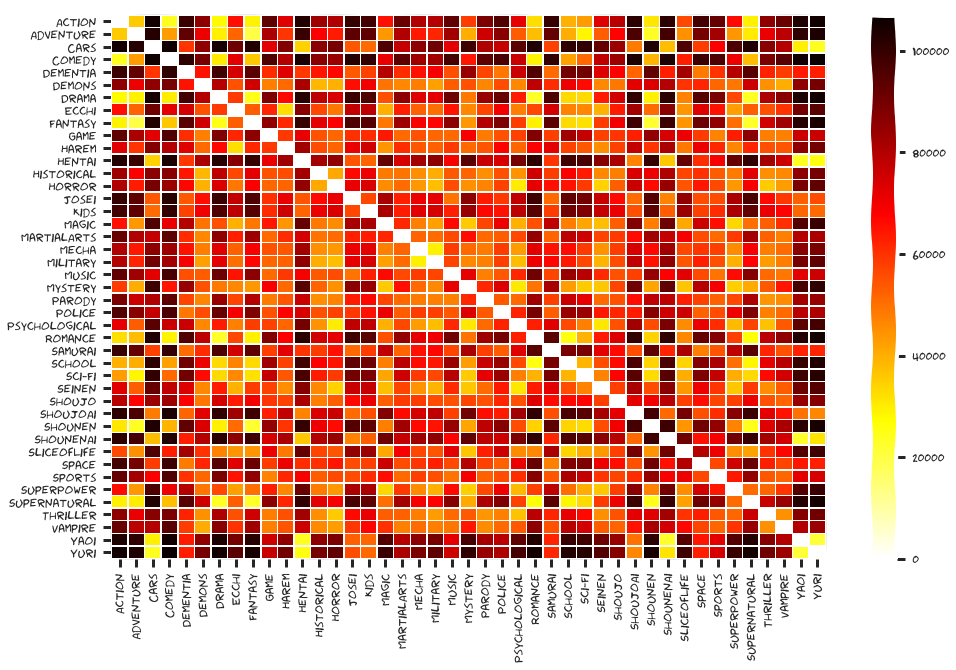

In [245]:
renaming = {x: x.replace('completed_', '') for x in completed_columns}
genres_users = users_completed[completed_columns].rename(columns=renaming).T
dists = pdist(genres_users, 'canberra')
dists_m = squareform(dists)
dists_df = pd.DataFrame(dists_m)
dists_df.columns = genres_users.index
dists_df.index = genres_users.index

f, ax = plt.subplots(figsize=(16, 10))
sns.heatmap(dists_df, linewidths=.5, cmap=plt.cm.hot_r)

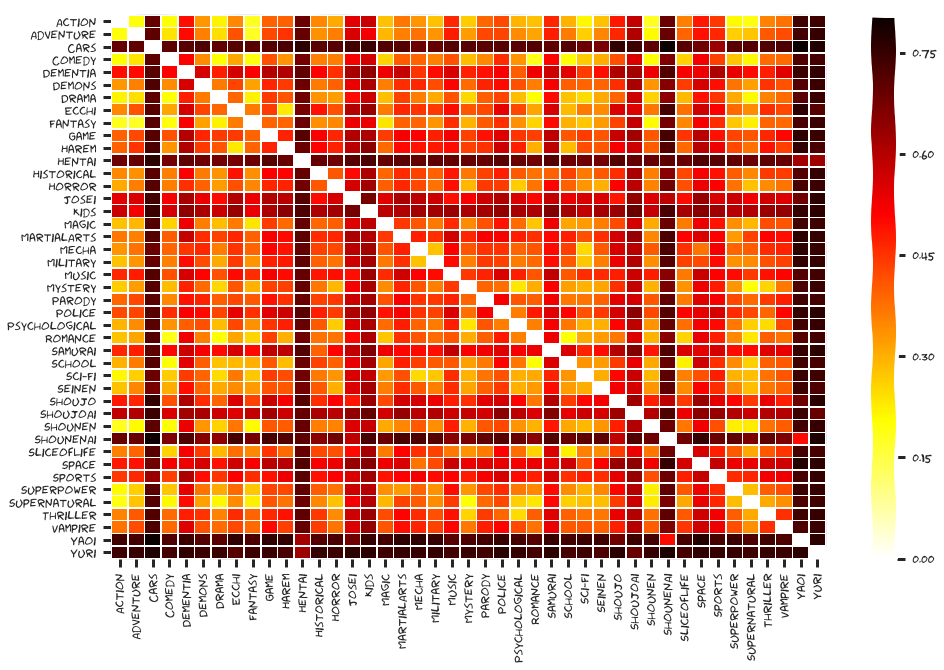

In [246]:
# using Jensen Shannon diverge, which is symeterized version of KL divergence
def js(p, q):
    p /= p.sum()
    q /= q.sum()
    m = (p + q) / 2
    return (entropy(p, m) + entropy(q, m)) / 2

def js_metric(p, q):
    # with square root it will satisfy triangle inequality
    return np.sqrt(js(p, q))

renaming = {x: x.replace('completed_', '') for x in completed_columns}
genres_users = users_completed[completed_columns].rename(columns=renaming).T
dists = pdist(genres_users, lambda x, y: js_metric(x, y))
dists_m = squareform(dists)
dists_df = pd.DataFrame(dists_m)
dists_df.columns = genres_users.index
dists_df.index = genres_users.index

f, ax = plt.subplots(figsize=(16, 10))
sns.heatmap(dists_df, linewidths=.5, cmap=plt.cm.hot_r)

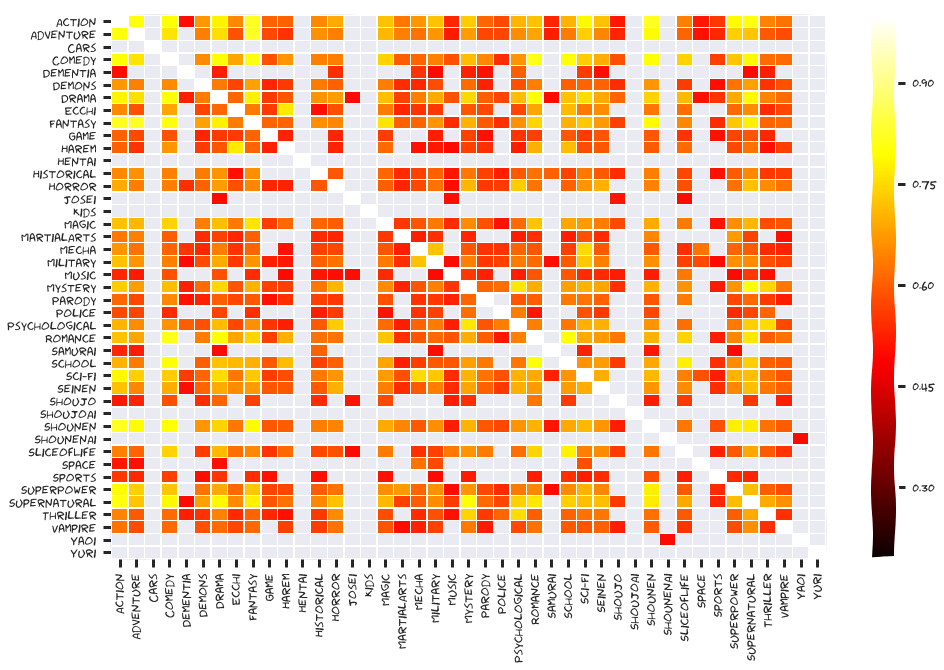

In [247]:
f, ax = plt.subplots(figsize=(16, 10))
mask = np.zeros_like(dists_df, dtype=np.bool)
mask[(1-dists_df) < 0.5] = True

sns.heatmap(1-dists_df, mask=mask, linewidths=.5, cmap=plt.cm.hot)

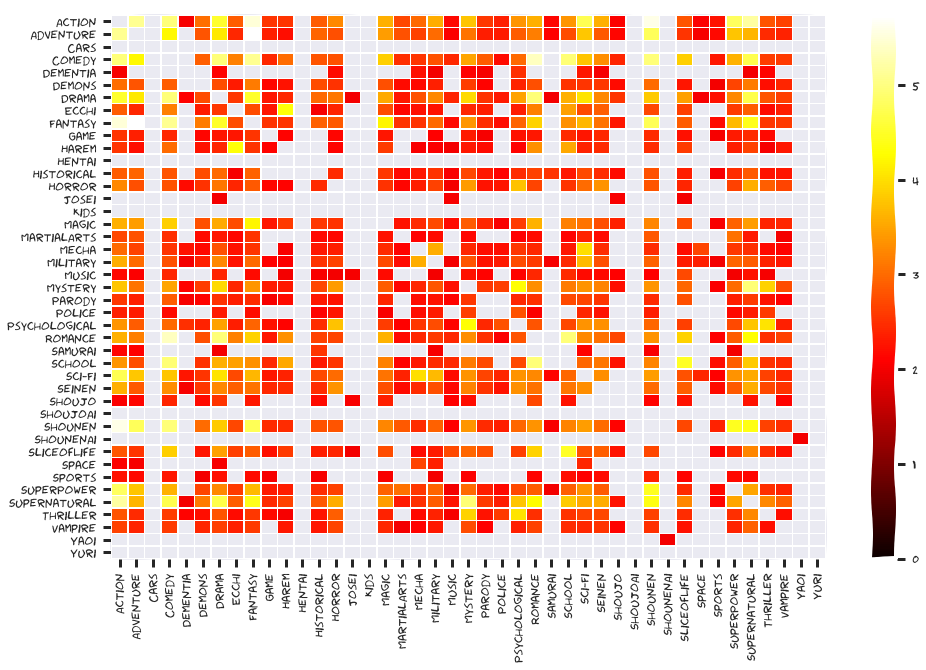

In [248]:
mask = np.zeros_like(dists_df, dtype=np.bool)
mask[dists_df == 0] = True

dists_df_inv = 1 / dists_df
dists_df_inv[dists_df_inv == np.inf] = 0
mask[dists_df_inv < 2] = True  # inspect how filtering low similarities will look like

f, ax = plt.subplots(figsize=(16, 10))
sns.heatmap(dists_df_inv, mask=mask, linewidths=.5, cmap=plt.cm.hot)

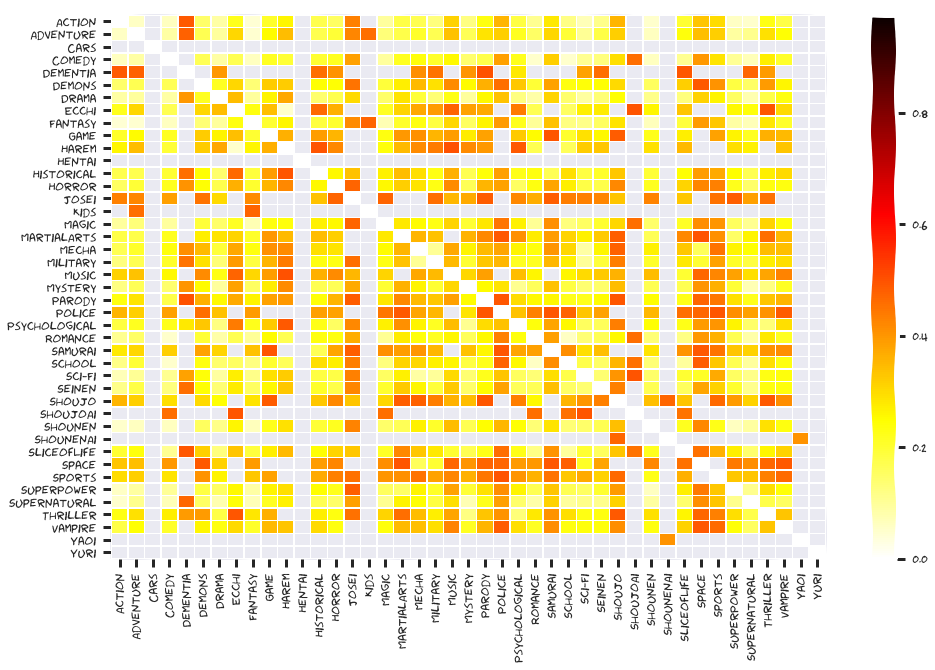

In [249]:
renaming = {x: x.replace('scoreabove8_', '') for x in above8_columns}
genres_users = users[above8_columns].rename(columns=renaming).T
dists = pdist(genres_users, 'cosine')
dists_m = squareform(dists)
dists_df = pd.DataFrame(dists_m)
dists_df.columns = genres_users.index
dists_df.index = genres_users.index

mask = np.zeros_like(dists_df, dtype=np.bool)
mask[dists_df  > 0.5] = True

f, ax = plt.subplots(figsize=(16, 10))
sns.heatmap(dists_df, mask=mask, linewidths=.5, cmap=plt.cm.hot_r)

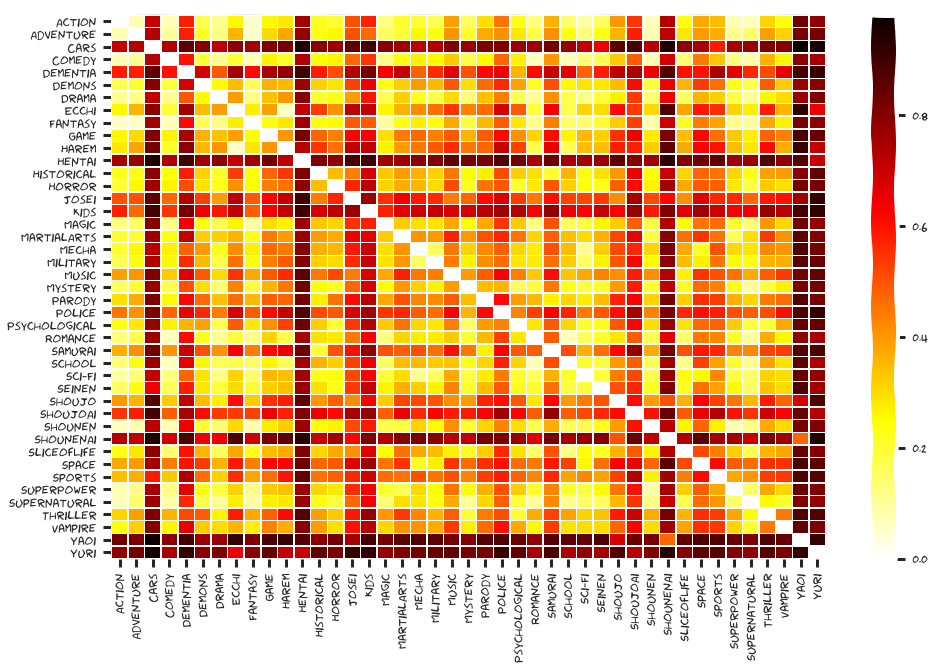

In [250]:
renaming = {x: x.replace('scoreabove9_', '') for x in above9_columns}
genres_users = users[above9_columns].rename(columns=renaming).T
dists = pdist(genres_users, 'cosine')
dists_m = squareform(dists)
dists_df = pd.DataFrame(dists_m)
dists_df.columns = genres_users.index
dists_df.index = genres_users.index

f, ax = plt.subplots(figsize=(16, 10))
sns.heatmap(dists_df, linewidths=.5, cmap=plt.cm.hot_r)

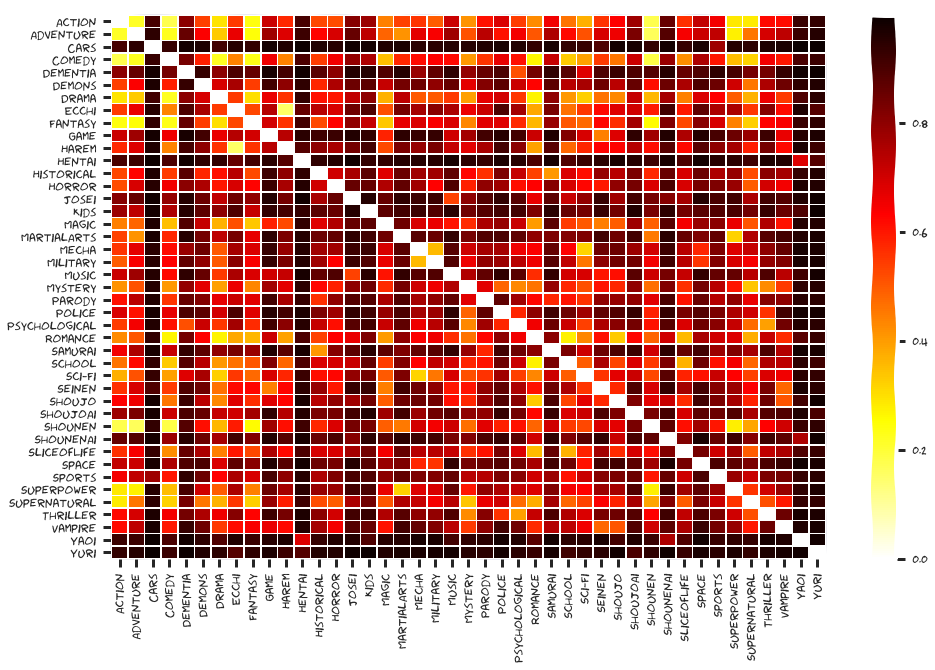

In [251]:
renaming = {x: x.replace('scoreabove9_', '') for x in above9_columns}
genres_users = users[above9_columns].div(users['all_rated'], axis=0).fillna(0).rename(columns=renaming).T
dists = pdist(genres_users, 'cosine')
dists_m = squareform(dists)
dists_df = pd.DataFrame(dists_m)
dists_df.columns = genres_users.index
dists_df.index = genres_users.index

f, ax = plt.subplots(figsize=(16, 10))
sns.heatmap(dists_df, linewidths=.5, cmap=plt.cm.hot_r)

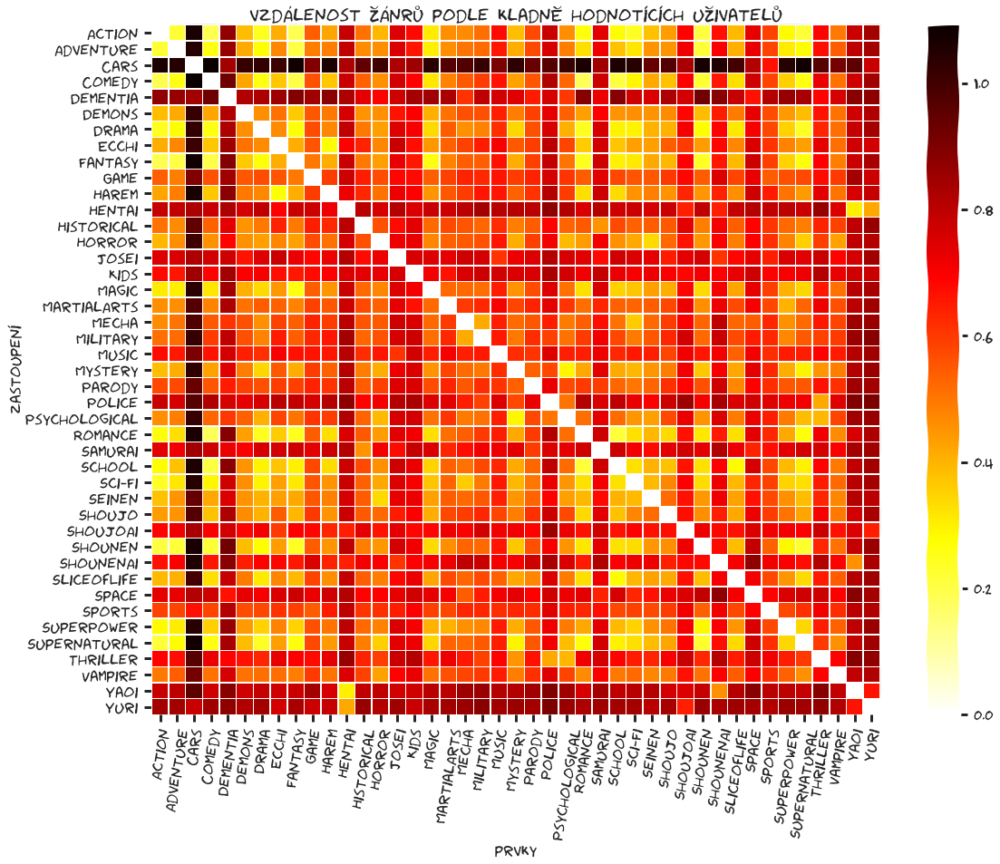

In [264]:
# NSD on 9 or more mean score
def nsd(x, y):
    return (max(np.log(x.sum()), np.log(y.sum())) - np.log((x & y).sum())) / (np.log(x.size) - min(np.log(x.sum()), np.log(y.sum())))

renaming = {x: x.replace('meanscore_', '') for x in mean_columns}
genres_users = (users[mean_columns] >= 9).rename(columns=renaming).T
dists = pdist(genres_users, lambda x, y: nsd(x, y))
dists_m = squareform(dists)
dists_df = pd.DataFrame(dists_m)
dists_df.columns = genres_users.index
dists_df.index = genres_users.index

f, ax = plt.subplots(figsize=(18, 14))
sns.heatmap(dists_df, linewidths=.5, cmap=plt.cm.hot_r)

plt.title('vzdálenost žánrů podle kladně hodnotících uživatelů')
plt.xticks(rotation=80)
plt.ylabel('zastoupení')
plt.xlabel('prvky')
plt.savefig('graphs/uzivatele-zanry-9-a-vice-heatmap.png', bbox_inches="tight")

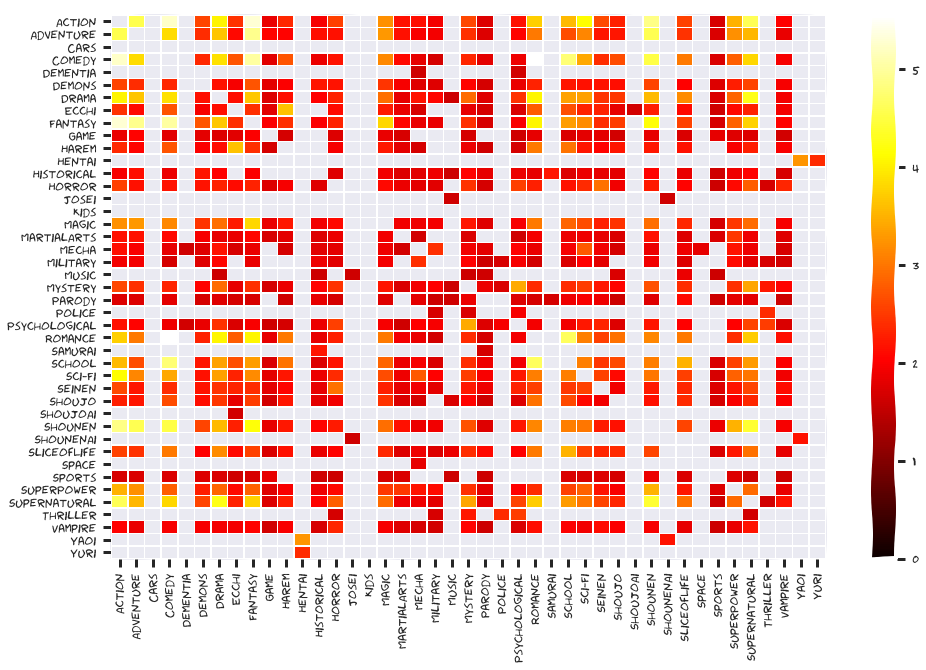

In [253]:
mask = np.zeros_like(dists_df, dtype=np.bool)
mask[dists_df == 0] = True

dists_df_inv = 1 / dists_df
dists_df_inv[dists_df_inv == np.inf] = 0
mask[dists_df_inv < 1.6] = True  # inspect how filtering low similarities will look like

f, ax = plt.subplots(figsize=(16, 10))
sns.heatmap(dists_df_inv, mask=mask, linewidths=.5, cmap=plt.cm.hot)

14

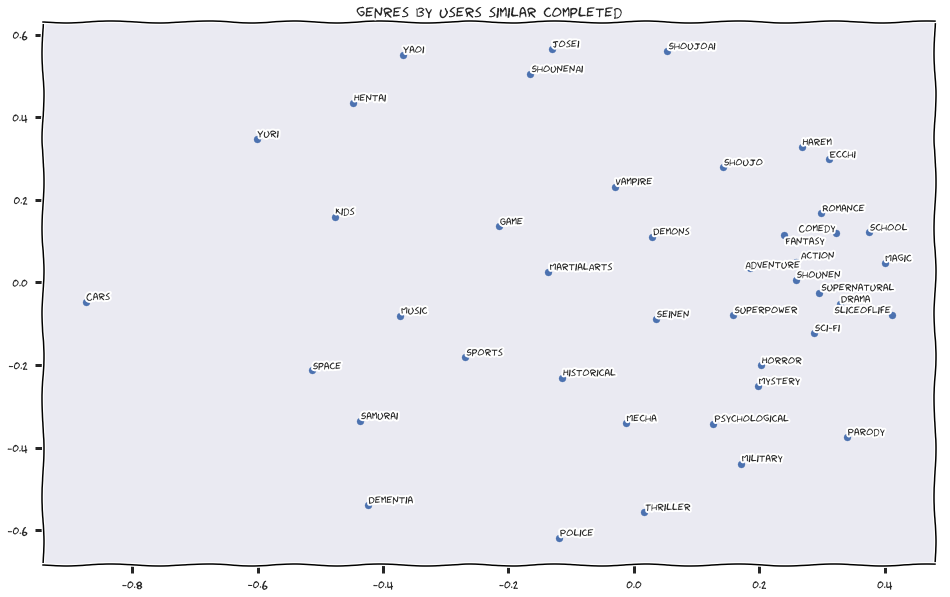

In [254]:
# MDS embedding for NSD
embedder = manifold.MDS(2, max_iter=2000, n_init=5, dissimilarity='precomputed')
embeddings = embedder.fit_transform(dists_m)
# need to agregate animes_studios because it does not contain duplicities because of genres
plt.figure(figsize=(16, 10))
plt.scatter(embeddings[:, 0], embeddings[:, 1])
plt.title("genres by users similar completed")
texts = [plt.text(embeddings[i, 0], embeddings[i, 1], txt) for i, txt in enumerate(dists_df.index)]
adjust_text(texts)

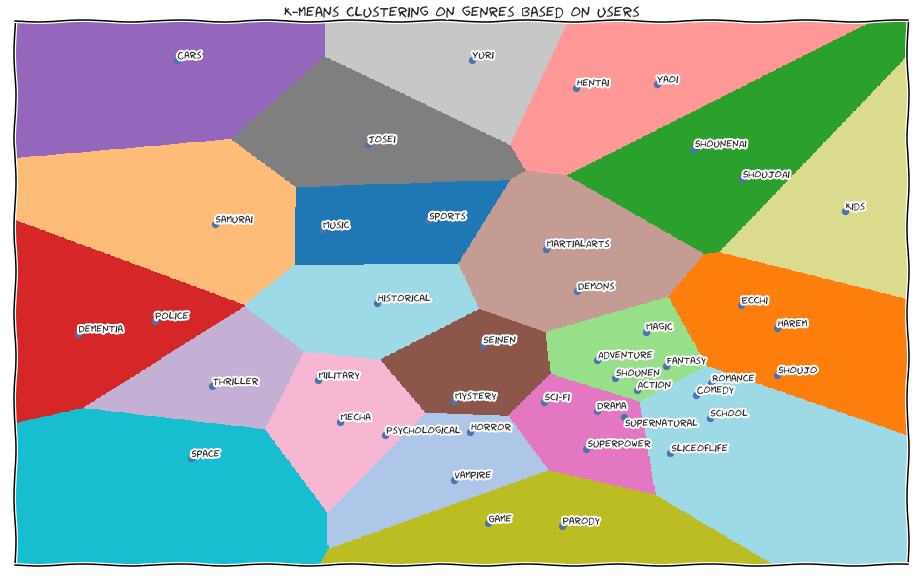

In [255]:
from sklearn.cluster import KMeans

embedder = manifold.MDS(2, max_iter=2000, n_init=5, dissimilarity='precomputed')
embeddings = embedder.fit_transform(dists_m)

kmeans = KMeans(init='k-means++', n_clusters=21, n_init=10)
kmeans.fit(embeddings)

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = .002     # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = embeddings[:, 0].min() - 0.1, embeddings[:, 0].max() + 0.1
y_min, y_max = embeddings[:, 1].min() - 0.1, embeddings[:, 1].max() + 0.1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(figsize=(16, 10))
plt.clf()
plt.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.tab20,
           aspect='auto', origin='lower')

plt.scatter(embeddings[:, 0], embeddings[:, 1])
#plt.plot(embeddings[:, 0], embeddings[:, 1], 'k.', markersize=2)
# Plot the centroids as a white X
plt.title('K-means clustering on genres based on users')

texts = [plt.text(embeddings[i, 0], embeddings[i, 1], txt) for i, txt in enumerate(dists_df.index)]
adjust_text(texts)

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()

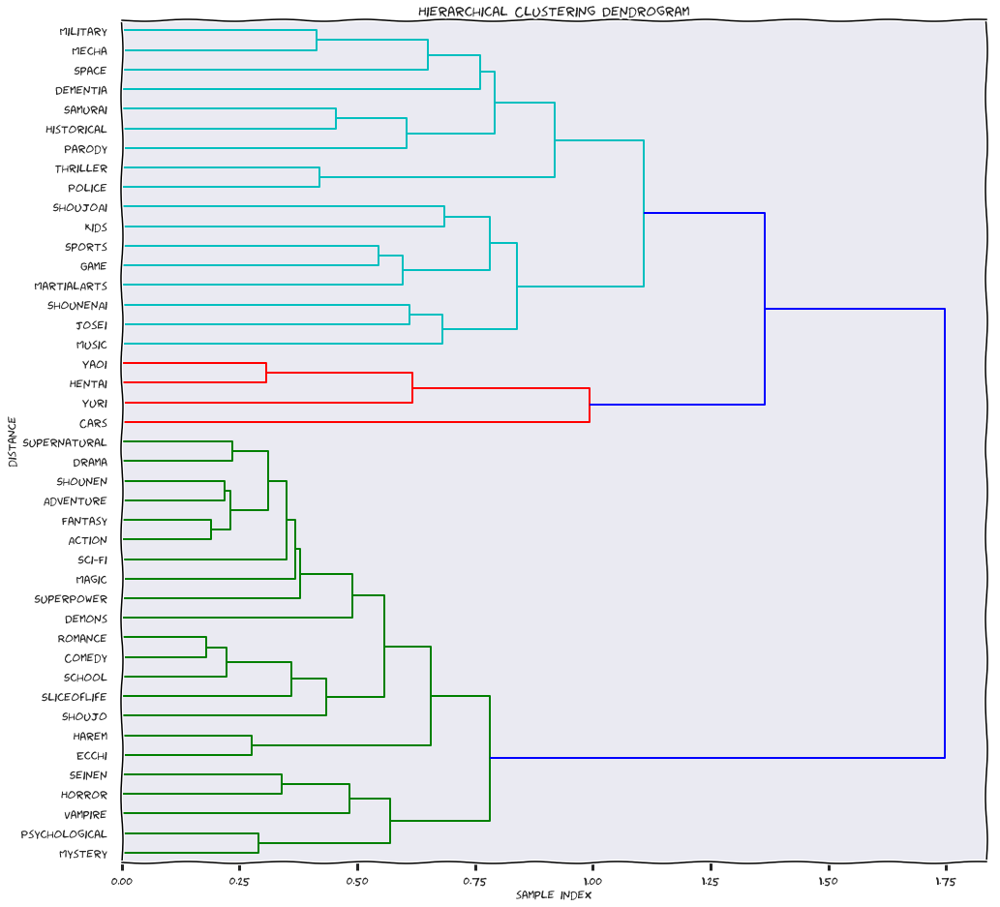

In [256]:
from scipy.cluster.hierarchy import dendrogram, linkage

# generate the linkage matrix 
# squareform transfers between condensed and redundant distance form
Z = linkage(squareform(dists_m), 'ward')

# calculate full dendrogram
plt.figure(figsize=(16, 16))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    Z,
#    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=12.,  # font size for the x axis labels
    orientation='right',
    labels=dists_df.index
)
plt.show()

In [257]:
pairs = np.array(list(combinations(genres_users.index, 2)))


# for gephi, higher edge cost means higher similarity
edges = pd.DataFrame({'source': pairs[:, 0], 'target': pairs[:, 1], 'weight': 1/dists})
edges = edges[edges['weight'] != np.inf]

nodes = pd.DataFrame({'id': genres_users.index, 'label': genres_users.index})
edges['type'] = 'undirected'

nodes.to_csv('genres_users_nodes.csv', index=False, sep=',', encoding='utf-8')
edges.to_csv('genres_users_edges_NSD.csv', index=False, sep=',', encoding='utf-8')